# HHS Regions

This notebook processes data, trains models, and runs GNNExplainer at the CBSA-level for each of the 10 [HHS regions](https://www.hhs.gov/about/agencies/iea/regional-offices/index.html). 

Mapping between CBSA and state uses list1_2023.csv (from [census.gov](https://www2.census.gov/programs-surveys/metro-micro/geographies/reference-files/2023/delineation-files/list1_2023.xlsx)).

In [9]:
%load_ext autoreload
%autoreload 2

%load_ext jupyter_ai_magics

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The jupyter_ai_magics extension is already loaded. To reload it, use:
  %reload_ext jupyter_ai_magics


In [10]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

import pickle
from tqdm import tqdm
from datetime import datetime

import process_data
from utils import get_cbsa_list

from torch_geometric.explain import Explainer, GNNExplainer
from torch_geometric.utils import subgraph

import torch

from tqdm import tqdm
from model import GCN, RMSLELoss
from torch_geometric.nn import summary


# Train each region separately

In [3]:
REGIONS = list(range(1,11))
VERSION = lambda hhs: f"gcn-usa-2020-22-hhs-{hhs}"

  0%|          | 0/10 [00:00<?, ?it/s]

============= HHS REGION: 1 ============= 
processing data on device: cuda
unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350
unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
imputing using columns ['retail_and_recreation_percent_change_from_baseline', 'grocery_and_pharmacy_percent_change_from_baseline', 'transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline', 'residential_percent_change_from_baseline']
Percent of variation explained with first component: 76.10792683627832 %
[0.76107927 0.10546504 0.09323786 0.03661961 0.00359822]
Reading population data from https://www2.census.gov/programs-surveys/popest/datasets/2020-2023/counties/totals/co-est2023-alldata.csv
creating coo_df
Creating


Spatial Edges: 100%|██████████| 15846/15846 [00:00<00:00, 24160.35it/s]


15846 spatial edges
Creating temporal edges...
3528 temporal edges
processing safegraph data
Processing edge weights...



100%|██████████| 19374/19374 [00:00<00:00, 1695858.37it/s]

Processed data saved to ../data/processed/gcn-usa-2020-22-hhs-1/




100%|██████████| 5000/5000 [00:24<00:00, 202.56it/s]


final test loss: 0.5061194896697998
train loss tensor(0.3098, device='cuda:0', grad_fn=<SqrtBackward0>)
test loss tensor(0.5061, device='cuda:0', grad_fn=<SqrtBackward0>)
train corr tensor(0.9891, device='cuda:0', grad_fn=<SelectBackward0>)
test corr tensor(0.9870, device='cuda:0', grad_fn=<SelectBackward0>)


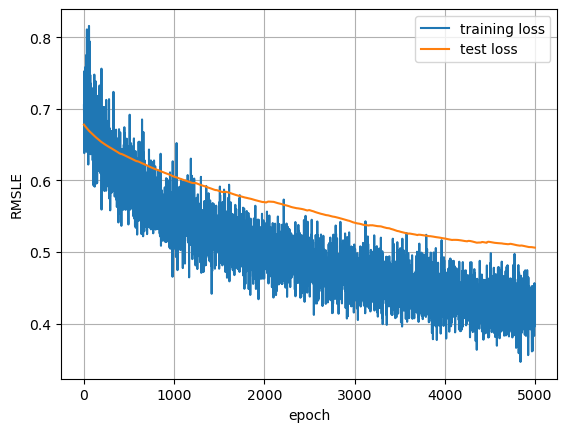


  0%|          | 0/139 [00:00<?, ?it/s]

2020-05-04
average explainable edge mask: tensor(0.0964)
number of edges in edge mask: 30
number of self edges: tensor(7)
number of inter edges: tensor(23)
date_range_start
2020-04-06    7
2020-04-13    6
2020-04-20    3
2020-04-27    3
2020-05-04    4
dtype: int64



  1%|          | 1/139 [00:01<04:22,  1.90s/it]

2020-05-11
average explainable edge mask: tensor(0.0793)
number of edges in edge mask: 18
number of self edges: tensor(4)
number of inter edges: tensor(14)
date_range_start
2020-04-13    4
2020-04-20    1
2020-04-27    4
2020-05-04    1
2020-05-11    3
dtype: int64



  1%|▏         | 2/139 [00:03<03:51,  1.69s/it]

2020-05-18
average explainable edge mask: tensor(0.0734)
number of edges in edge mask: 12
number of self edges: tensor(5)
number of inter edges: tensor(7)
date_range_start
2020-04-20    2
2020-04-27    3
2020-05-04    2
2020-05-11    1
2020-05-18    1
dtype: int64



  2%|▏         | 3/139 [00:04<03:28,  1.53s/it]

2020-05-25
average explainable edge mask: tensor(0.0751)
number of edges in edge mask: 16
number of self edges: tensor(6)
number of inter edges: tensor(10)
date_range_start
2020-05-04    2
2020-05-11    3
2020-05-18    5
2020-05-25    2
dtype: int64



  3%|▎         | 4/139 [00:06<03:23,  1.50s/it]

2020-06-01
average explainable edge mask: tensor(0.0590)
number of edges in edge mask: 3
number of self edges: tensor(0)
number of inter edges: tensor(3)
date_range_start
2020-05-18    1
dtype: int64



  4%|▎         | 5/139 [00:07<03:11,  1.43s/it]

2020-06-08
average explainable edge mask: tensor(0.0521)
number of edges in edge mask: 4
number of self edges: tensor(0)
number of inter edges: tensor(4)
date_range_start
2020-05-25    1
2020-06-08    1
dtype: int64



  4%|▍         | 6/139 [00:08<03:04,  1.38s/it]

2020-06-15
average explainable edge mask: tensor(0.0479)
number of edges in edge mask: 3
number of self edges: tensor(0)
number of inter edges: tensor(3)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



  5%|▌         | 7/139 [00:10<02:53,  1.31s/it]

2020-06-22
average explainable edge mask: tensor(0.0475)
number of edges in edge mask: 0
number of self edges: 0
number of inter edges: 0
Series([], dtype: int64)
No non-self-loop data to plot lines for.



  6%|▌         | 8/139 [00:11<02:50,  1.30s/it]

2020-06-29
average explainable edge mask: tensor(0.0498)
number of edges in edge mask: 3
number of self edges: tensor(0)
number of inter edges: tensor(3)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



  6%|▋         | 9/139 [00:12<02:44,  1.26s/it]

2020-07-06
average explainable edge mask: tensor(0.0535)
number of edges in edge mask: 4
number of self edges: tensor(0)
number of inter edges: tensor(4)
date_range_start
2020-06-08    1
dtype: int64



  7%|▋         | 10/139 [00:13<02:43,  1.27s/it]

2020-07-13
average explainable edge mask: tensor(0.0707)
number of edges in edge mask: 17
number of self edges: tensor(4)
number of inter edges: tensor(13)
date_range_start
2020-06-22    3
2020-06-29    6
2020-07-06    1
2020-07-13    1
dtype: int64



  8%|▊         | 11/139 [00:15<02:48,  1.32s/it]

2020-07-20
average explainable edge mask: tensor(0.0748)
number of edges in edge mask: 21
number of self edges: tensor(5)
number of inter edges: tensor(16)
date_range_start
2020-06-22    4
2020-06-29    1
2020-07-06    5
2020-07-13    4
dtype: int64



  9%|▊         | 12/139 [00:16<02:53,  1.37s/it]

2020-07-27
average explainable edge mask: tensor(0.0731)
number of edges in edge mask: 20
number of self edges: tensor(1)
number of inter edges: tensor(19)
date_range_start
2020-06-29    3
2020-07-06    1
2020-07-13    4
2020-07-20    2
2020-07-27    3
dtype: int64



  9%|▉         | 13/139 [00:18<03:04,  1.47s/it]

2020-08-03
average explainable edge mask: tensor(0.0611)
number of edges in edge mask: 9
number of self edges: tensor(0)
number of inter edges: tensor(9)
date_range_start
2020-07-27    2
2020-08-03    3
dtype: int64



 10%|█         | 14/139 [00:19<03:00,  1.44s/it]

2020-08-10
average explainable edge mask: tensor(0.0554)
number of edges in edge mask: 4
number of self edges: tensor(1)
number of inter edges: tensor(3)
date_range_start
2020-07-27    1
2020-08-03    2
dtype: int64



 11%|█         | 15/139 [00:21<02:54,  1.41s/it]

2020-08-17
average explainable edge mask: tensor(0.0528)
number of edges in edge mask: 3
number of self edges: tensor(0)
number of inter edges: tensor(3)
date_range_start
2020-08-03    1
dtype: int64



 12%|█▏        | 16/139 [00:22<02:58,  1.45s/it]

2020-08-24
average explainable edge mask: tensor(0.0868)
number of edges in edge mask: 38
number of self edges: tensor(4)
number of inter edges: tensor(34)
date_range_start
2020-07-27    5
2020-08-03    5
2020-08-10    3
2020-08-17    9
2020-08-24    4
dtype: int64



 12%|█▏        | 17/139 [00:24<03:11,  1.57s/it]

2020-08-31
average explainable edge mask: tensor(0.0677)
number of edges in edge mask: 19
number of self edges: tensor(2)
number of inter edges: tensor(17)
date_range_start
2020-08-03    4
2020-08-10    2
2020-08-17    3
2020-08-24    1
2020-08-31    1
dtype: int64



 13%|█▎        | 18/139 [00:26<03:12,  1.59s/it]

2020-09-07
average explainable edge mask: tensor(0.0563)
number of edges in edge mask: 9
number of self edges: tensor(2)
number of inter edges: tensor(7)
date_range_start
2020-08-10    2
2020-08-24    2
2020-08-31    2
dtype: int64



 14%|█▎        | 19/139 [00:27<03:05,  1.54s/it]

2020-09-14
average explainable edge mask: tensor(0.0574)
number of edges in edge mask: 11
number of self edges: tensor(0)
number of inter edges: tensor(11)
date_range_start
2020-09-07    5
2020-09-14    1
dtype: int64



 14%|█▍        | 20/139 [00:29<03:07,  1.57s/it]

2020-09-21
average explainable edge mask: tensor(0.0683)
number of edges in edge mask: 21
number of self edges: tensor(8)
number of inter edges: tensor(13)
date_range_start
2020-08-24    3
2020-08-31    3
2020-09-07    1
2020-09-14    4
2020-09-21    5
dtype: int64



 15%|█▌        | 21/139 [00:30<03:04,  1.57s/it]

2020-09-28
average explainable edge mask: tensor(0.0811)
number of edges in edge mask: 30
number of self edges: tensor(3)
number of inter edges: tensor(27)
date_range_start
2020-08-31    9
2020-09-07    3
2020-09-14    7
2020-09-21    1
2020-09-28    2
dtype: int64



 16%|█▌        | 22/139 [00:32<03:09,  1.62s/it]

2020-10-05
average explainable edge mask: tensor(0.0895)
number of edges in edge mask: 36
number of self edges: tensor(8)
number of inter edges: tensor(28)
date_range_start
2020-09-07    11
2020-09-14     4
2020-09-21     3
2020-09-28     1
2020-10-05     8
dtype: int64



 17%|█▋        | 23/139 [00:34<03:12,  1.66s/it]

2020-10-12
average explainable edge mask: tensor(0.0756)
number of edges in edge mask: 23
number of self edges: tensor(2)
number of inter edges: tensor(21)
date_range_start
2020-09-14    3
2020-09-21    3
2020-09-28    1
2020-10-12    6
dtype: int64



 17%|█▋        | 24/139 [00:35<03:10,  1.65s/it]

2020-10-19
average explainable edge mask: tensor(0.0631)
number of edges in edge mask: 11
number of self edges: tensor(2)
number of inter edges: tensor(9)
date_range_start
2020-09-21    1
2020-09-28    2
2020-10-05    2
2020-10-12    2
2020-10-19    1
dtype: int64



 18%|█▊        | 25/139 [00:37<03:00,  1.59s/it]

2020-10-26
average explainable edge mask: tensor(0.0970)
number of edges in edge mask: 41
number of self edges: tensor(4)
number of inter edges: tensor(37)
date_range_start
2020-09-28    7
2020-10-05    9
2020-10-12    6
2020-10-19    4
2020-10-26    4
dtype: int64



 19%|█▊        | 26/139 [00:39<03:11,  1.70s/it]

2020-11-02
average explainable edge mask: tensor(0.1168)
number of edges in edge mask: 56
number of self edges: tensor(9)
number of inter edges: tensor(47)
date_range_start
2020-10-05    14
2020-10-12     7
2020-10-19    11
2020-10-26     5
2020-11-02     5
dtype: int64



 19%|█▉        | 27/139 [00:41<03:24,  1.82s/it]

2020-11-09
average explainable edge mask: tensor(0.1367)
number of edges in edge mask: 65
number of self edges: tensor(16)
number of inter edges: tensor(49)
date_range_start
2020-10-12    13
2020-10-19     6
2020-10-26    10
2020-11-02     8
2020-11-09    10
dtype: int64



 20%|██        | 28/139 [00:43<03:29,  1.88s/it]

2020-11-16
average explainable edge mask: tensor(0.1392)
number of edges in edge mask: 64
number of self edges: tensor(16)
number of inter edges: tensor(48)
date_range_start
2020-10-19    12
2020-10-26     7
2020-11-02     7
2020-11-09     6
2020-11-16    12
dtype: int64



 21%|██        | 29/139 [00:45<03:29,  1.90s/it]

2020-11-23
average explainable edge mask: tensor(0.1021)
number of edges in edge mask: 38
number of self edges: tensor(11)
number of inter edges: tensor(27)
date_range_start
2020-10-26    6
2020-11-02    1
2020-11-09    6
2020-11-16    7
2020-11-23    3
dtype: int64



 22%|██▏       | 30/139 [00:46<03:15,  1.80s/it]

2020-11-30
average explainable edge mask: tensor(0.0827)
number of edges in edge mask: 22
number of self edges: tensor(2)
number of inter edges: tensor(20)
date_range_start
2020-11-02    2
2020-11-09    5
2020-11-16    1
2020-11-23    2
2020-11-30    4
dtype: int64



 22%|██▏       | 31/139 [00:48<03:05,  1.72s/it]

2020-12-07
average explainable edge mask: tensor(0.1250)
number of edges in edge mask: 54
number of self edges: tensor(13)
number of inter edges: tensor(41)
date_range_start
2020-11-09    12
2020-11-16     7
2020-11-23    10
2020-11-30     6
2020-12-07     6
dtype: int64



 23%|██▎       | 32/139 [00:50<03:14,  1.82s/it]

2020-12-14
average explainable edge mask: tensor(0.0950)
number of edges in edge mask: 28
number of self edges: tensor(5)
number of inter edges: tensor(23)
date_range_start
2020-11-16    7
2020-11-23    5
2020-11-30    4
2020-12-07    3
2020-12-14    2
dtype: int64



 24%|██▎       | 33/139 [00:52<03:07,  1.77s/it]

2020-12-21
average explainable edge mask: tensor(0.0729)
number of edges in edge mask: 15
number of self edges: tensor(5)
number of inter edges: tensor(10)
date_range_start
2020-11-23    2
2020-11-30    2
2020-12-07    1
2020-12-14    2
dtype: int64



 24%|██▍       | 34/139 [00:53<02:52,  1.64s/it]

2020-12-28
average explainable edge mask: tensor(0.0749)
number of edges in edge mask: 18
number of self edges: tensor(2)
number of inter edges: tensor(16)
date_range_start
2020-11-30    2
2020-12-07    3
2020-12-14    1
2020-12-21    1
2020-12-28    4
dtype: int64



 25%|██▌       | 35/139 [00:54<02:45,  1.59s/it]

2021-01-04
average explainable edge mask: tensor(0.0856)
number of edges in edge mask: 21
number of self edges: tensor(2)
number of inter edges: tensor(19)
date_range_start
2020-12-07    6
2020-12-14    4
2020-12-21    1
dtype: int64



 26%|██▌       | 36/139 [00:56<02:43,  1.58s/it]

2021-01-11
average explainable edge mask: tensor(0.1192)
number of edges in edge mask: 47
number of self edges: tensor(7)
number of inter edges: tensor(40)
date_range_start
2020-12-14    11
2020-12-21     7
2020-12-28     3
2021-01-04     6
2021-01-11     5
dtype: int64



 27%|██▋       | 37/139 [00:58<02:49,  1.66s/it]

2021-01-18
average explainable edge mask: tensor(0.0987)
number of edges in edge mask: 34
number of self edges: tensor(5)
number of inter edges: tensor(29)
date_range_start
2020-12-21    2
2020-12-28    6
2021-01-04    4
2021-01-11    6
2021-01-18    6
dtype: int64



 27%|██▋       | 38/139 [01:00<02:48,  1.67s/it]

2021-01-25
average explainable edge mask: tensor(0.0748)
number of edges in edge mask: 8
number of self edges: tensor(2)
number of inter edges: tensor(6)
date_range_start
2021-01-04    1
2021-01-11    3
2021-01-25    1
dtype: int64



 28%|██▊       | 39/139 [01:01<02:36,  1.57s/it]

2021-02-01
average explainable edge mask: tensor(0.0650)
number of edges in edge mask: 10
number of self edges: tensor(4)
number of inter edges: tensor(6)
date_range_start
2021-01-04    1
2021-01-11    2
2021-01-18    1
2021-01-25    1
2021-02-01    3
dtype: int64



 29%|██▉       | 40/139 [01:02<02:29,  1.51s/it]

2021-02-08
average explainable edge mask: tensor(0.0635)
number of edges in edge mask: 8
number of self edges: tensor(0)
number of inter edges: tensor(8)
date_range_start
2021-01-18    1
2021-02-01    1
2021-02-08    3
dtype: int64



 29%|██▉       | 41/139 [01:04<02:25,  1.48s/it]

2021-02-15
average explainable edge mask: tensor(0.1015)
number of edges in edge mask: 36
number of self edges: tensor(7)
number of inter edges: tensor(29)
date_range_start
2021-01-18    5
2021-01-25    7
2021-02-01    5
2021-02-08    3
2021-02-15    8
dtype: int64



 30%|███       | 42/139 [01:05<02:31,  1.56s/it]

2021-02-22
average explainable edge mask: tensor(0.0718)
number of edges in edge mask: 3
number of self edges: tensor(0)
number of inter edges: tensor(3)
date_range_start
2021-02-01    1
2021-02-15    1
dtype: int64



 31%|███       | 43/139 [01:07<02:22,  1.49s/it]

2021-03-01
average explainable edge mask: tensor(0.0439)
number of edges in edge mask: 4
number of self edges: tensor(1)
number of inter edges: tensor(3)
date_range_start
2021-02-15    1
dtype: int64
No non-self-loop data to plot lines for.



 32%|███▏      | 44/139 [01:08<02:12,  1.39s/it]

2021-03-08
average explainable edge mask: tensor(0.0416)
number of edges in edge mask: 9
number of self edges: tensor(1)
number of inter edges: tensor(8)
date_range_start
2021-02-08    1
2021-02-22    1
2021-03-01    1
2021-03-08    1
dtype: int64



 32%|███▏      | 45/139 [01:09<02:09,  1.38s/it]

2021-03-15
average explainable edge mask: tensor(0.0967)
number of edges in edge mask: 39
number of self edges: tensor(5)
number of inter edges: tensor(34)
date_range_start
2021-02-15    5
2021-02-22    7
2021-03-01    3
2021-03-08    3
2021-03-15    8
dtype: int64



 33%|███▎      | 46/139 [01:11<02:20,  1.51s/it]

2021-03-22
average explainable edge mask: tensor(0.1222)
number of edges in edge mask: 55
number of self edges: tensor(9)
number of inter edges: tensor(46)
date_range_start
2021-02-22     9
2021-03-01     2
2021-03-08     8
2021-03-15    13
2021-03-22     7
dtype: int64



 34%|███▍      | 47/139 [01:13<02:31,  1.65s/it]

2021-03-29
average explainable edge mask: tensor(0.1377)
number of edges in edge mask: 69
number of self edges: tensor(11)
number of inter edges: tensor(58)
date_range_start
2021-03-01     4
2021-03-08    11
2021-03-15    16
2021-03-22    10
2021-03-29    11
dtype: int64



 35%|███▍      | 48/139 [01:15<02:45,  1.82s/it]

2021-04-05
average explainable edge mask: tensor(0.1035)
number of edges in edge mask: 43
number of self edges: tensor(6)
number of inter edges: tensor(37)
date_range_start
2021-03-08    8
2021-03-15    3
2021-03-22    6
2021-03-29    3
2021-04-05    9
dtype: int64



 35%|███▌      | 49/139 [01:17<02:42,  1.81s/it]

2021-04-12
average explainable edge mask: tensor(0.0904)
number of edges in edge mask: 33
number of self edges: tensor(5)
number of inter edges: tensor(28)
date_range_start
2021-03-15    5
2021-03-22    3
2021-03-29    2
2021-04-05    5
2021-04-12    8
dtype: int64



 36%|███▌      | 50/139 [01:19<02:48,  1.89s/it]

2021-04-19
average explainable edge mask: tensor(0.0811)
number of edges in edge mask: 20
number of self edges: tensor(5)
number of inter edges: tensor(15)
date_range_start
2021-03-22    2
2021-03-29    2
2021-04-05    3
2021-04-12    2
2021-04-19    2
dtype: int64



 37%|███▋      | 51/139 [01:21<02:36,  1.78s/it]

2021-04-26
average explainable edge mask: tensor(0.0589)
number of edges in edge mask: 0
number of self edges: 0
number of inter edges: 0
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 37%|███▋      | 52/139 [01:22<02:23,  1.65s/it]

2021-05-03
average explainable edge mask: tensor(0.0620)
number of edges in edge mask: 6
number of self edges: tensor(1)
number of inter edges: tensor(5)
date_range_start
2021-04-19    1
2021-04-26    1
2021-05-03    4
dtype: int64



 38%|███▊      | 53/139 [01:23<02:14,  1.56s/it]

2021-05-10
average explainable edge mask: tensor(0.0683)
number of edges in edge mask: 9
number of self edges: tensor(2)
number of inter edges: tensor(7)
date_range_start
2021-04-12    3
2021-04-19    4
dtype: int64



 39%|███▉      | 54/139 [01:25<02:09,  1.53s/it]

2021-05-17
average explainable edge mask: tensor(0.0551)
number of edges in edge mask: 4
number of self edges: tensor(0)
number of inter edges: tensor(4)
date_range_start
2021-04-19    1
2021-04-26    1
dtype: int64



 40%|███▉      | 55/139 [01:26<02:11,  1.56s/it]

2021-05-24
average explainable edge mask: tensor(0.0441)
number of edges in edge mask: 1
number of self edges: tensor(0)
number of inter edges: tensor(1)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 40%|████      | 56/139 [01:28<02:00,  1.45s/it]

2021-05-31
average explainable edge mask: tensor(0.0396)
number of edges in edge mask: 0
number of self edges: 0
number of inter edges: 0
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 41%|████      | 57/139 [01:29<01:54,  1.40s/it]

2021-06-07
average explainable edge mask: tensor(0.0328)
number of edges in edge mask: 0
number of self edges: 0
number of inter edges: 0
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 42%|████▏     | 58/139 [01:30<01:47,  1.32s/it]

2021-06-14
average explainable edge mask: tensor(0.0349)
number of edges in edge mask: 0
number of self edges: 0
number of inter edges: 0
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 42%|████▏     | 59/139 [01:31<01:46,  1.33s/it]

2021-06-21
average explainable edge mask: tensor(0.0362)
number of edges in edge mask: 0
number of self edges: 0
number of inter edges: 0
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 43%|████▎     | 60/139 [01:33<01:41,  1.28s/it]

2021-06-28
average explainable edge mask: tensor(0.0395)
number of edges in edge mask: 0
number of self edges: 0
number of inter edges: 0
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 44%|████▍     | 61/139 [01:34<01:39,  1.27s/it]

2021-07-05
average explainable edge mask: tensor(0.0496)
number of edges in edge mask: 6
number of self edges: tensor(0)
number of inter edges: tensor(6)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 45%|████▍     | 62/139 [01:35<01:39,  1.29s/it]

2021-07-12
average explainable edge mask: tensor(0.0921)
number of edges in edge mask: 42
number of self edges: tensor(5)
number of inter edges: tensor(37)
date_range_start
2021-06-14    8
2021-06-21    4
2021-06-28    3
2021-07-05    8
2021-07-12    7
dtype: int64



 45%|████▌     | 63/139 [01:37<01:50,  1.46s/it]

2021-07-19
average explainable edge mask: tensor(0.1260)
number of edges in edge mask: 75
number of self edges: tensor(9)
number of inter edges: tensor(66)
date_range_start
2021-06-21    11
2021-06-28    16
2021-07-05     9
2021-07-12    14
2021-07-19     9
dtype: int64



 46%|████▌     | 64/139 [01:40<02:13,  1.78s/it]

2021-07-26
average explainable edge mask: tensor(0.1365)
number of edges in edge mask: 86
number of self edges: tensor(16)
number of inter edges: tensor(70)
date_range_start
2021-06-28    17
2021-07-05    11
2021-07-12    14
2021-07-19    13
2021-07-26    14
dtype: int64



 47%|████▋     | 65/139 [01:43<02:39,  2.16s/it]

2021-08-02
average explainable edge mask: tensor(0.1635)
number of edges in edge mask: 114
number of self edges: tensor(19)
number of inter edges: tensor(95)
date_range_start
2021-07-05    22
2021-07-12    18
2021-07-19    20
2021-07-26    16
2021-08-02    20
dtype: int64



 47%|████▋     | 66/139 [01:46<03:01,  2.49s/it]

2021-08-09
average explainable edge mask: tensor(0.1365)
number of edges in edge mask: 83
number of self edges: tensor(13)
number of inter edges: tensor(70)
date_range_start
2021-07-12    15
2021-07-19     7
2021-07-26    12
2021-08-02    15
2021-08-09    17
dtype: int64



 48%|████▊     | 67/139 [01:49<03:03,  2.54s/it]

2021-08-16
average explainable edge mask: tensor(0.1032)
number of edges in edge mask: 57
number of self edges: tensor(6)
number of inter edges: tensor(51)
date_range_start
2021-07-19     5
2021-07-26     7
2021-08-02     8
2021-08-09    13
2021-08-16     8
dtype: int64



 49%|████▉     | 68/139 [01:51<02:55,  2.47s/it]

2021-08-23
average explainable edge mask: tensor(0.0776)
number of edges in edge mask: 26
number of self edges: tensor(3)
number of inter edges: tensor(23)
date_range_start
2021-07-26    1
2021-08-02    3
2021-08-09    4
2021-08-16    3
2021-08-23    6
dtype: int64



 50%|████▉     | 69/139 [01:52<02:35,  2.22s/it]

2021-08-30
average explainable edge mask: tensor(0.0850)
number of edges in edge mask: 32
number of self edges: tensor(6)
number of inter edges: tensor(26)
date_range_start
2021-08-02    2
2021-08-09    4
2021-08-16    6
2021-08-23    6
2021-08-30    5
dtype: int64



 50%|█████     | 70/139 [01:54<02:21,  2.05s/it]

2021-09-06
average explainable edge mask: tensor(0.0735)
number of edges in edge mask: 18
number of self edges: tensor(2)
number of inter edges: tensor(16)
date_range_start
2021-08-09    2
2021-08-16    4
2021-08-23    4
2021-09-06    2
dtype: int64



 51%|█████     | 71/139 [01:56<02:14,  1.98s/it]

2021-09-13
average explainable edge mask: tensor(0.0756)
number of edges in edge mask: 21
number of self edges: tensor(4)
number of inter edges: tensor(17)
date_range_start
2021-08-16    4
2021-08-23    4
2021-08-30    2
2021-09-06    3
2021-09-13    2
dtype: int64



 52%|█████▏    | 72/139 [01:57<02:02,  1.83s/it]

2021-09-20
average explainable edge mask: tensor(0.0709)
number of edges in edge mask: 18
number of self edges: tensor(4)
number of inter edges: tensor(14)
date_range_start
2021-08-23    4
2021-08-30    2
2021-09-06    2
2021-09-13    1
2021-09-20    4
dtype: int64



 53%|█████▎    | 73/139 [01:59<01:53,  1.73s/it]

2021-09-27
average explainable edge mask: tensor(0.0641)
number of edges in edge mask: 8
number of self edges: tensor(4)
number of inter edges: tensor(4)
date_range_start
2021-08-30    1
2021-09-06    1
2021-09-13    1
2021-09-27    3
dtype: int64



 53%|█████▎    | 74/139 [02:00<01:46,  1.63s/it]

2021-10-04
average explainable edge mask: tensor(0.0659)
number of edges in edge mask: 9
number of self edges: tensor(2)
number of inter edges: tensor(7)
date_range_start
2021-09-06    2
2021-09-20    2
2021-10-04    2
dtype: int64



 54%|█████▍    | 75/139 [02:02<01:39,  1.55s/it]

2021-10-11
average explainable edge mask: tensor(0.0746)
number of edges in edge mask: 16
number of self edges: tensor(4)
number of inter edges: tensor(12)
date_range_start
2021-09-13    1
2021-09-20    2
2021-09-27    3
2021-10-04    1
2021-10-11    2
dtype: int64



 55%|█████▍    | 76/139 [02:03<01:37,  1.55s/it]

2021-10-18
average explainable edge mask: tensor(0.0983)
number of edges in edge mask: 44
number of self edges: tensor(9)
number of inter edges: tensor(35)
date_range_start
2021-09-20     4
2021-09-27    10
2021-10-04     5
2021-10-11     7
2021-10-18     8
dtype: int64



 55%|█████▌    | 77/139 [02:05<01:41,  1.63s/it]

2021-10-25
average explainable edge mask: tensor(0.0709)
number of edges in edge mask: 21
number of self edges: tensor(3)
number of inter edges: tensor(18)
date_range_start
2021-09-27    2
2021-10-04    2
2021-10-11    3
2021-10-18    3
2021-10-25    4
dtype: int64



 56%|█████▌    | 78/139 [02:06<01:36,  1.58s/it]

2021-11-01
average explainable edge mask: tensor(0.0658)
number of edges in edge mask: 13
number of self edges: tensor(0)
number of inter edges: tensor(13)
date_range_start
2021-10-04    4
2021-10-11    2
2021-10-18    2
2021-10-25    1
dtype: int64



 57%|█████▋    | 79/139 [02:08<01:33,  1.56s/it]

2021-11-08
average explainable edge mask: tensor(0.1383)
number of edges in edge mask: 79
number of self edges: tensor(10)
number of inter edges: tensor(69)
date_range_start
2021-10-11    11
2021-10-18    13
2021-10-25     8
2021-11-01    15
2021-11-08    15
dtype: int64



 58%|█████▊    | 80/139 [02:10<01:47,  1.82s/it]

2021-11-15
average explainable edge mask: tensor(0.1570)
number of edges in edge mask: 95
number of self edges: tensor(17)
number of inter edges: tensor(78)
date_range_start
2021-10-18    21
2021-10-25    10
2021-11-01    12
2021-11-08    13
2021-11-15    19
dtype: int64



 58%|█████▊    | 81/139 [02:13<01:59,  2.05s/it]

2021-11-22
average explainable edge mask: tensor(0.1601)
number of edges in edge mask: 94
number of self edges: tensor(17)
number of inter edges: tensor(77)
date_range_start
2021-10-25    11
2021-11-01    12
2021-11-08    17
2021-11-15    11
2021-11-22    28
dtype: int64



 59%|█████▉    | 82/139 [02:16<02:21,  2.48s/it]

2021-11-29
average explainable edge mask: tensor(0.0993)
number of edges in edge mask: 41
number of self edges: tensor(11)
number of inter edges: tensor(30)
date_range_start
2021-11-01    4
2021-11-08    6
2021-11-15    9
2021-11-22    5
2021-11-29    5
dtype: int64



 60%|█████▉    | 83/139 [02:18<02:05,  2.25s/it]

2021-12-06
average explainable edge mask: tensor(0.1159)
number of edges in edge mask: 55
number of self edges: tensor(11)
number of inter edges: tensor(44)
date_range_start
2021-11-08     9
2021-11-15     9
2021-11-22     6
2021-11-29    11
2021-12-06     9
dtype: int64



 60%|██████    | 84/139 [02:20<01:59,  2.18s/it]

2021-12-13
average explainable edge mask: tensor(0.1319)
number of edges in edge mask: 67
number of self edges: tensor(9)
number of inter edges: tensor(58)
date_range_start
2021-11-15    15
2021-11-22     8
2021-11-29     4
2021-12-06     5
2021-12-13    21
dtype: int64



 61%|██████    | 85/139 [02:22<01:59,  2.21s/it]

2021-12-20
average explainable edge mask: tensor(0.0829)
number of edges in edge mask: 22
number of self edges: tensor(3)
number of inter edges: tensor(19)
date_range_start
2021-11-22    3
2021-11-29    1
2021-12-06    2
2021-12-13    6
2021-12-20    3
dtype: int64



 62%|██████▏   | 86/139 [02:24<01:48,  2.04s/it]

2021-12-27
average explainable edge mask: tensor(0.1312)
number of edges in edge mask: 63
number of self edges: tensor(12)
number of inter edges: tensor(51)
date_range_start
2021-11-29     9
2021-12-06     7
2021-12-13    13
2021-12-20    12
2021-12-27    11
dtype: int64



 63%|██████▎   | 87/139 [02:26<01:49,  2.10s/it]

2022-01-03
average explainable edge mask: tensor(0.1466)
number of edges in edge mask: 78
number of self edges: tensor(9)
number of inter edges: tensor(69)
date_range_start
2021-12-06    15
2021-12-13    14
2021-12-20    12
2021-12-27    16
2022-01-03     3
dtype: int64



 63%|██████▎   | 88/139 [02:29<01:52,  2.20s/it]

2022-01-10
average explainable edge mask: tensor(0.1604)
number of edges in edge mask: 94
number of self edges: tensor(17)
number of inter edges: tensor(77)
date_range_start
2021-12-13    12
2021-12-20    14
2021-12-27    11
2022-01-03    11
2022-01-10    24
dtype: int64



 64%|██████▍   | 89/139 [02:31<01:54,  2.29s/it]

2022-01-17
average explainable edge mask: tensor(0.1201)
number of edges in edge mask: 59
number of self edges: tensor(12)
number of inter edges: tensor(47)
date_range_start
2021-12-20     4
2021-12-27     7
2022-01-03     7
2022-01-10    14
2022-01-17    10
dtype: int64



 65%|██████▍   | 90/139 [02:33<01:47,  2.19s/it]

2022-01-24
average explainable edge mask: tensor(0.0873)
number of edges in edge mask: 29
number of self edges: tensor(1)
number of inter edges: tensor(28)
date_range_start
2021-12-27    2
2022-01-03    8
2022-01-10    5
2022-01-17    5
2022-01-24    5
dtype: int64



 65%|██████▌   | 91/139 [02:35<01:39,  2.06s/it]

2022-01-31
average explainable edge mask: tensor(0.0807)
number of edges in edge mask: 21
number of self edges: tensor(4)
number of inter edges: tensor(17)
date_range_start
2022-01-03    2
2022-01-10    3
2022-01-17    1
2022-01-24    4
2022-01-31    5
dtype: int64



 66%|██████▌   | 92/139 [02:37<01:28,  1.89s/it]

2022-02-07
average explainable edge mask: tensor(0.0733)
number of edges in edge mask: 9
number of self edges: tensor(0)
number of inter edges: tensor(9)
date_range_start
2022-01-10    1
2022-01-24    1
2022-01-31    3
dtype: int64



 67%|██████▋   | 93/139 [02:38<01:21,  1.77s/it]

2022-02-14
average explainable edge mask: tensor(0.1082)
number of edges in edge mask: 48
number of self edges: tensor(9)
number of inter edges: tensor(39)
date_range_start
2022-01-17    12
2022-01-24     8
2022-01-31    10
2022-02-07     6
2022-02-14     7
dtype: int64



 68%|██████▊   | 94/139 [02:40<01:23,  1.86s/it]

2022-02-21
average explainable edge mask: tensor(0.1089)
number of edges in edge mask: 11
number of self edges: tensor(0)
number of inter edges: tensor(11)
date_range_start
2022-01-24    2
2022-01-31    2
2022-02-14    1
2022-02-21    3
dtype: int64



 68%|██████▊   | 95/139 [02:41<01:15,  1.72s/it]

2022-02-28
average explainable edge mask: tensor(0.0727)
number of edges in edge mask: 7
number of self edges: tensor(3)
number of inter edges: tensor(4)
date_range_start
2022-01-31    1
2022-02-07    1
2022-02-14    1
2022-02-28    2
dtype: int64



 69%|██████▉   | 96/139 [02:43<01:08,  1.59s/it]

2022-03-07
average explainable edge mask: tensor(0.0345)
number of edges in edge mask: 5
number of self edges: tensor(0)
number of inter edges: tensor(5)
date_range_start
2022-02-28    2
2022-03-07    1
dtype: int64



 70%|██████▉   | 97/139 [02:44<01:04,  1.54s/it]

2022-03-14
average explainable edge mask: tensor(0.0349)
number of edges in edge mask: 4
number of self edges: tensor(0)
number of inter edges: tensor(4)
date_range_start
2022-02-28    1
2022-03-07    1
dtype: int64



 71%|███████   | 98/139 [02:45<00:59,  1.46s/it]

2022-03-21
average explainable edge mask: tensor(0.0587)
number of edges in edge mask: 18
number of self edges: tensor(2)
number of inter edges: tensor(16)
date_range_start
2022-02-21    1
2022-02-28    5
2022-03-07    3
2022-03-21    2
dtype: int64



 71%|███████   | 99/139 [02:47<00:58,  1.46s/it]

2022-03-28
average explainable edge mask: tensor(0.1308)
number of edges in edge mask: 72
number of self edges: tensor(12)
number of inter edges: tensor(60)
date_range_start
2022-02-28     6
2022-03-07    15
2022-03-14     8
2022-03-21     6
2022-03-28    21
dtype: int64



 72%|███████▏  | 100/139 [02:49<01:06,  1.71s/it]

2022-04-04
average explainable edge mask: tensor(0.1244)
number of edges in edge mask: 66
number of self edges: tensor(7)
number of inter edges: tensor(59)
date_range_start
2022-03-07     7
2022-03-14     7
2022-03-21     8
2022-03-28    11
2022-04-04    16
dtype: int64



 73%|███████▎  | 101/139 [02:51<01:11,  1.87s/it]

2022-04-11
average explainable edge mask: tensor(0.1555)
number of edges in edge mask: 93
number of self edges: tensor(14)
number of inter edges: tensor(79)
date_range_start
2022-03-14    18
2022-03-21    20
2022-03-28    15
2022-04-04    12
2022-04-11    10
dtype: int64



 73%|███████▎  | 102/139 [02:54<01:17,  2.10s/it]

2022-04-18
average explainable edge mask: tensor(0.1308)
number of edges in edge mask: 69
number of self edges: tensor(15)
number of inter edges: tensor(54)
date_range_start
2022-03-21     8
2022-03-28    10
2022-04-04    12
2022-04-11     5
2022-04-18    19
dtype: int64



 74%|███████▍  | 103/139 [02:56<01:16,  2.13s/it]

2022-04-25
average explainable edge mask: tensor(0.1178)
number of edges in edge mask: 57
number of self edges: tensor(8)
number of inter edges: tensor(49)
date_range_start
2022-03-28     7
2022-04-04     7
2022-04-11     9
2022-04-18     9
2022-04-25    10
dtype: int64



 75%|███████▍  | 104/139 [02:58<01:13,  2.10s/it]

2022-05-02
average explainable edge mask: tensor(0.1063)
number of edges in edge mask: 50
number of self edges: tensor(6)
number of inter edges: tensor(44)
date_range_start
2022-04-04     7
2022-04-11     6
2022-04-18     7
2022-04-25     5
2022-05-02    12
dtype: int64



 76%|███████▌  | 105/139 [03:00<01:10,  2.08s/it]

2022-05-09
average explainable edge mask: tensor(0.1072)
number of edges in edge mask: 49
number of self edges: tensor(10)
number of inter edges: tensor(39)
date_range_start
2022-04-11     4
2022-04-18     8
2022-04-25     2
2022-05-02    10
2022-05-09    12
dtype: int64



 76%|███████▋  | 106/139 [03:02<01:06,  2.01s/it]

2022-05-16
average explainable edge mask: tensor(0.0817)
number of edges in edge mask: 20
number of self edges: tensor(4)
number of inter edges: tensor(16)
date_range_start
2022-04-18    1
2022-04-25    5
2022-05-02    1
2022-05-09    1
2022-05-16    7
dtype: int64



 77%|███████▋  | 107/139 [03:04<01:00,  1.88s/it]

2022-05-23
average explainable edge mask: tensor(0.0655)
number of edges in edge mask: 11
number of self edges: tensor(2)
number of inter edges: tensor(9)
date_range_start
2022-04-25    3
2022-05-02    1
2022-05-09    2
2022-05-16    1
2022-05-23    1
dtype: int64



 78%|███████▊  | 108/139 [03:05<00:55,  1.80s/it]

2022-05-30
average explainable edge mask: tensor(0.0583)
number of edges in edge mask: 3
number of self edges: tensor(1)
number of inter edges: tensor(2)
date_range_start
2022-05-09    1
2022-05-16    2
dtype: int64



 78%|███████▊  | 109/139 [03:07<00:49,  1.66s/it]

2022-06-06
average explainable edge mask: tensor(0.0583)
number of edges in edge mask: 3
number of self edges: tensor(0)
number of inter edges: tensor(3)
date_range_start
2022-05-16    2
2022-05-30    1
dtype: int64



 79%|███████▉  | 110/139 [03:09<00:49,  1.72s/it]

2022-06-13
average explainable edge mask: tensor(0.0638)
number of edges in edge mask: 8
number of self edges: tensor(1)
number of inter edges: tensor(7)
date_range_start
2022-05-16    1
2022-05-23    2
2022-05-30    2
2022-06-13    1
dtype: int64



 80%|███████▉  | 111/139 [03:10<00:47,  1.68s/it]

2022-06-20
average explainable edge mask: tensor(0.0713)
number of edges in edge mask: 12
number of self edges: tensor(1)
number of inter edges: tensor(11)
date_range_start
2022-05-30    3
2022-06-13    2
2022-06-20    5
dtype: int64



 81%|████████  | 112/139 [03:12<00:43,  1.62s/it]

2022-06-27
average explainable edge mask: tensor(0.0575)
number of edges in edge mask: 2
number of self edges: tensor(0)
number of inter edges: tensor(2)
date_range_start
2022-05-30    1
dtype: int64



 81%|████████▏ | 113/139 [03:13<00:39,  1.52s/it]

2022-07-04
average explainable edge mask: tensor(0.0478)
number of edges in edge mask: 5
number of self edges: tensor(0)
number of inter edges: tensor(5)
date_range_start
2022-06-27    2
2022-07-04    1
dtype: int64



 82%|████████▏ | 114/139 [03:14<00:36,  1.47s/it]

2022-07-11
average explainable edge mask: tensor(0.0482)
number of edges in edge mask: 5
number of self edges: tensor(0)
number of inter edges: tensor(5)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 83%|████████▎ | 115/139 [03:15<00:33,  1.39s/it]

2022-07-18
average explainable edge mask: tensor(0.1055)
number of edges in edge mask: 55
number of self edges: tensor(3)
number of inter edges: tensor(52)
date_range_start
2022-06-20     8
2022-06-27     4
2022-07-04    10
2022-07-11     8
2022-07-18    10
dtype: int64



 83%|████████▎ | 116/139 [03:18<00:36,  1.60s/it]

2022-07-25
average explainable edge mask: tensor(0.1312)
number of edges in edge mask: 79
number of self edges: tensor(15)
number of inter edges: tensor(64)
date_range_start
2022-06-27    11
2022-07-04    17
2022-07-11    16
2022-07-18    10
2022-07-25    11
dtype: int64



 84%|████████▍ | 117/139 [03:20<00:40,  1.83s/it]

2022-08-01
average explainable edge mask: tensor(0.0814)
number of edges in edge mask: 34
number of self edges: tensor(5)
number of inter edges: tensor(29)
date_range_start
2022-07-04    3
2022-07-11    2
2022-07-18    5
2022-07-25    8
2022-08-01    4
dtype: int64



 85%|████████▍ | 118/139 [03:22<00:37,  1.77s/it]

2022-08-08
average explainable edge mask: tensor(0.0615)
number of edges in edge mask: 11
number of self edges: tensor(2)
number of inter edges: tensor(9)
date_range_start
2022-07-18    2
2022-08-08    1
dtype: int64



 86%|████████▌ | 119/139 [03:23<00:32,  1.64s/it]

2022-08-15
average explainable edge mask: tensor(0.0656)
number of edges in edge mask: 18
number of self edges: tensor(2)
number of inter edges: tensor(16)
date_range_start
2022-07-18    1
2022-07-25    4
2022-08-15    4
dtype: int64



 86%|████████▋ | 120/139 [03:24<00:29,  1.57s/it]

2022-08-22
average explainable edge mask: tensor(0.0647)
number of edges in edge mask: 11
number of self edges: tensor(1)
number of inter edges: tensor(10)
date_range_start
2022-07-25    2
2022-08-01    1
2022-08-08    1
2022-08-15    1
2022-08-22    1
dtype: int64



 87%|████████▋ | 121/139 [03:26<00:27,  1.55s/it]

2022-08-29
average explainable edge mask: tensor(0.0700)
number of edges in edge mask: 20
number of self edges: tensor(2)
number of inter edges: tensor(18)
date_range_start
2022-08-01    2
2022-08-08    3
2022-08-15    4
2022-08-22    2
2022-08-29    2
dtype: int64



 88%|████████▊ | 122/139 [03:27<00:25,  1.53s/it]

2022-09-05
average explainable edge mask: tensor(0.0527)
number of edges in edge mask: 1
number of self edges: tensor(0)
number of inter edges: tensor(1)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 88%|████████▊ | 123/139 [03:28<00:22,  1.42s/it]

2022-09-12
average explainable edge mask: tensor(0.0525)
number of edges in edge mask: 5
number of self edges: tensor(0)
number of inter edges: tensor(5)
date_range_start
2022-09-12    1
dtype: int64



 89%|████████▉ | 124/139 [03:30<00:20,  1.37s/it]

2022-09-19
average explainable edge mask: tensor(0.1325)
number of edges in edge mask: 84
number of self edges: tensor(12)
number of inter edges: tensor(72)
date_range_start
2022-08-22    13
2022-08-29    11
2022-09-05    19
2022-09-12    11
2022-09-19    11
dtype: int64



 90%|████████▉ | 125/139 [03:32<00:23,  1.69s/it]

2022-09-26
average explainable edge mask: tensor(0.1224)
number of edges in edge mask: 71
number of self edges: tensor(11)
number of inter edges: tensor(60)
date_range_start
2022-08-29    13
2022-09-05    12
2022-09-12    14
2022-09-19     3
2022-09-26    14
dtype: int64



 91%|█████████ | 126/139 [03:35<00:27,  2.10s/it]

2022-10-03
average explainable edge mask: tensor(0.0786)
number of edges in edge mask: 30
number of self edges: tensor(2)
number of inter edges: tensor(28)
date_range_start
2022-09-05    8
2022-09-12    2
2022-09-19    3
2022-09-26    2
2022-10-03    4
dtype: int64



 91%|█████████▏| 127/139 [03:37<00:24,  2.02s/it]

2022-10-10
average explainable edge mask: tensor(0.0588)
number of edges in edge mask: 8
number of self edges: tensor(1)
number of inter edges: tensor(7)
date_range_start
2022-09-19    1
2022-09-26    1
2022-10-10    2
dtype: int64



 92%|█████████▏| 128/139 [03:38<00:20,  1.82s/it]

2022-10-17
average explainable edge mask: tensor(0.0759)
number of edges in edge mask: 22
number of self edges: tensor(4)
number of inter edges: tensor(18)
date_range_start
2022-09-19    3
2022-09-26    3
2022-10-03    3
2022-10-10    2
2022-10-17    5
dtype: int64



 93%|█████████▎| 129/139 [03:40<00:17,  1.75s/it]

2022-10-24
average explainable edge mask: tensor(0.0607)
number of edges in edge mask: 9
number of self edges: tensor(1)
number of inter edges: tensor(8)
date_range_start
2022-09-26    1
2022-10-03    1
2022-10-10    1
2022-10-17    3
dtype: int64



 94%|█████████▎| 130/139 [03:41<00:14,  1.66s/it]

2022-10-31
average explainable edge mask: tensor(0.0619)
number of edges in edge mask: 9
number of self edges: tensor(1)
number of inter edges: tensor(8)
date_range_start
2022-10-10    3
2022-10-17    1
2022-10-24    1
2022-10-31    3
dtype: int64



 94%|█████████▍| 131/139 [03:43<00:12,  1.59s/it]

2022-11-07
average explainable edge mask: tensor(0.0550)
number of edges in edge mask: 3
number of self edges: tensor(0)
number of inter edges: tensor(3)
date_range_start
2022-10-31    1
dtype: int64



 95%|█████████▍| 132/139 [03:44<00:10,  1.50s/it]

2022-11-14
average explainable edge mask: tensor(0.0449)
number of edges in edge mask: 0
number of self edges: 0
number of inter edges: 0
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 96%|█████████▌| 133/139 [03:45<00:08,  1.41s/it]

2022-11-21
average explainable edge mask: tensor(0.0395)
number of edges in edge mask: 2
number of self edges: tensor(0)
number of inter edges: tensor(2)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 96%|█████████▋| 134/139 [03:46<00:06,  1.34s/it]

2022-11-28
average explainable edge mask: tensor(0.0500)
number of edges in edge mask: 10
number of self edges: tensor(1)
number of inter edges: tensor(9)
date_range_start
2022-10-31    1
2022-11-14    1
2022-11-28    2
dtype: int64



 97%|█████████▋| 135/139 [03:48<00:05,  1.33s/it]

2022-12-05
average explainable edge mask: tensor(0.1410)
number of edges in edge mask: 81
number of self edges: tensor(20)
number of inter edges: tensor(61)
date_range_start
2022-11-07    18
2022-11-14    12
2022-11-21    10
2022-11-28    10
2022-12-05    11
dtype: int64



 98%|█████████▊| 136/139 [03:50<00:04,  1.60s/it]

2022-12-12
average explainable edge mask: tensor(0.1276)
number of edges in edge mask: 67
number of self edges: tensor(15)
number of inter edges: tensor(52)
date_range_start
2022-11-14     7
2022-11-21     8
2022-11-28     9
2022-12-05    12
2022-12-12    12
dtype: int64



 99%|█████████▊| 137/139 [03:52<00:03,  1.73s/it]

2022-12-19
average explainable edge mask: tensor(0.1067)
number of edges in edge mask: 50
number of self edges: tensor(14)
number of inter edges: tensor(36)
date_range_start
2022-11-21    8
2022-11-28    9
2022-12-05    9
2022-12-12    8
2022-12-19    3
dtype: int64



 99%|█████████▉| 138/139 [03:54<00:01,  1.74s/it]

2022-12-26
average explainable edge mask: tensor(0.0701)
number of edges in edge mask: 16
number of self edges: tensor(2)
number of inter edges: tensor(14)
date_range_start
2022-11-28    4
2022-12-05    1
2022-12-12    4
2022-12-26    1
dtype: int64



100%|██████████| 139/139 [03:55<00:00,  1.70s/it]


unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


 10%|█         | 1/10 [11:00<1:39:03, 660.43s/it]

============= HHS REGION: 2 ============= 
processing data on device: cuda
unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350
unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
imputing using columns ['retail_and_recreation_percent_change_from_baseline', 'grocery_and_pharmacy_percent_change_from_baseline', 'transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline', 'residential_percent_change_from_baseline']
Percent of variation explained with first component: 76.10792683627832 %
[0.76107927 0.10546504 0.09323786 0.03661961 0.00359822]
Reading population data from https://www2.census.gov/programs-surveys/popest/datasets/2020-2023/counties/totals/co-est2023-alldata.csv
creating coo_df
Creating


Spatial Edges: 100%|██████████| 20333/20333 [00:00<00:00, 24428.59it/s]


20333 spatial edges
Creating temporal edges...
4410 temporal edges
processing safegraph data
Processing edge weights...



100%|██████████| 24743/24743 [00:00<00:00, 1678467.80it/s]

Processed data saved to ../data/processed/gcn-usa-2020-22-hhs-2/




100%|██████████| 5000/5000 [00:25<00:00, 199.35it/s]


final test loss: 0.6977081894874573
train loss tensor(0.4809, device='cuda:0', grad_fn=<SqrtBackward0>)
test loss tensor(0.6977, device='cuda:0', grad_fn=<SqrtBackward0>)
train corr tensor(0.9784, device='cuda:0', grad_fn=<SelectBackward0>)
test corr tensor(0.9798, device='cuda:0', grad_fn=<SelectBackward0>)


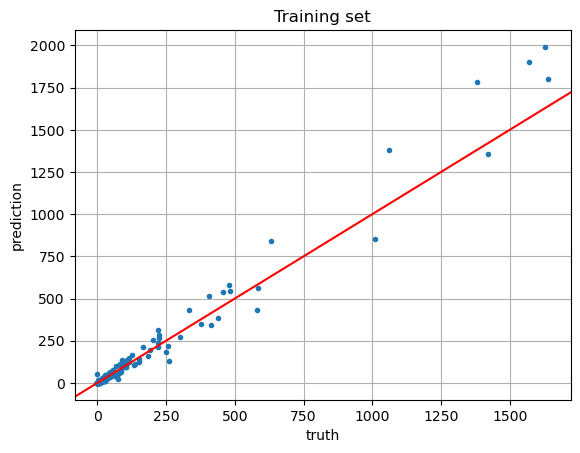

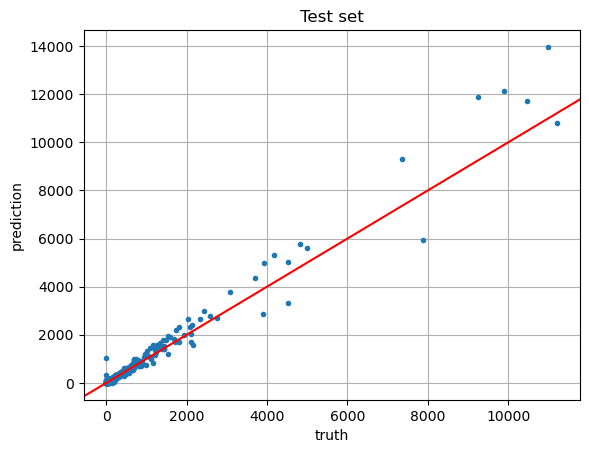

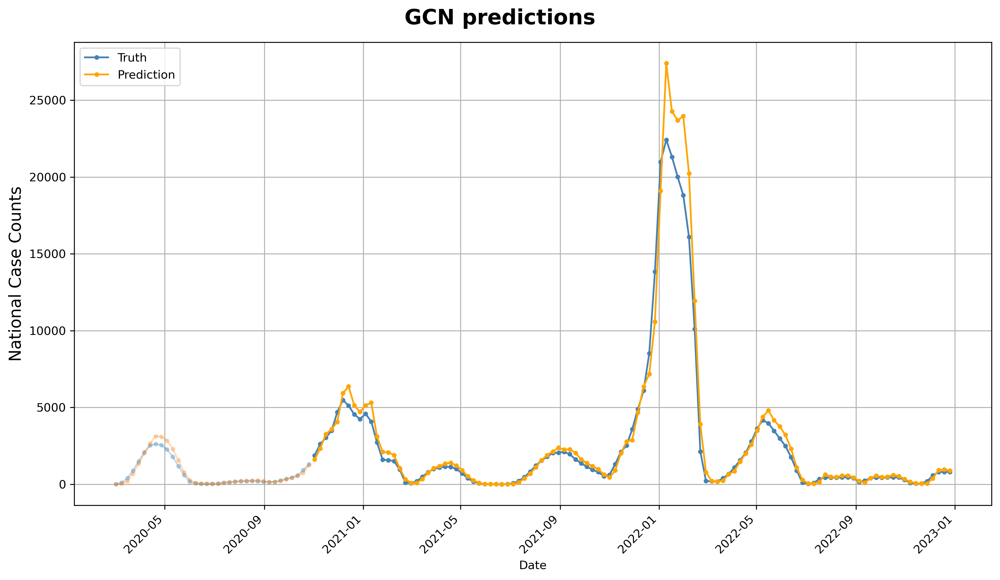

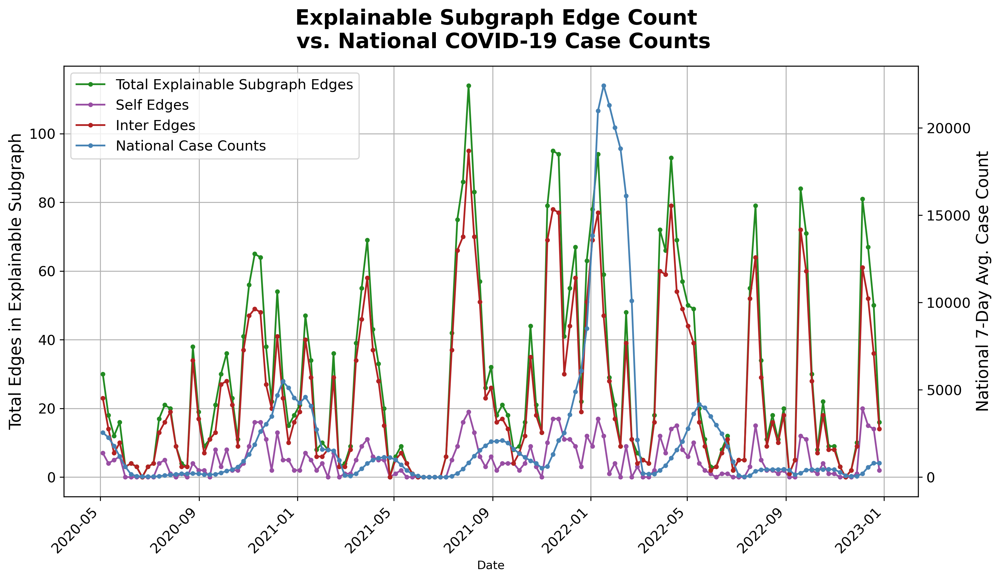

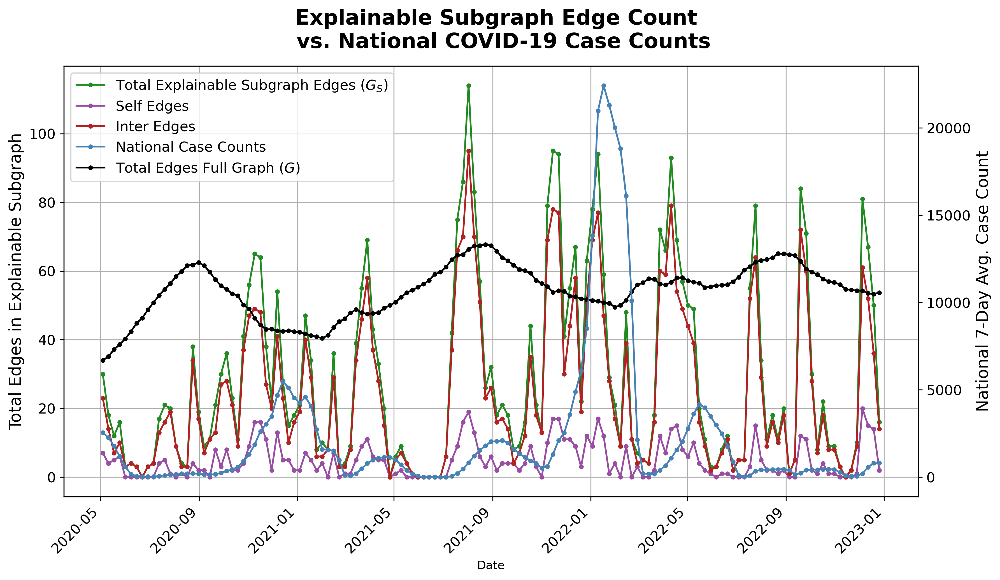

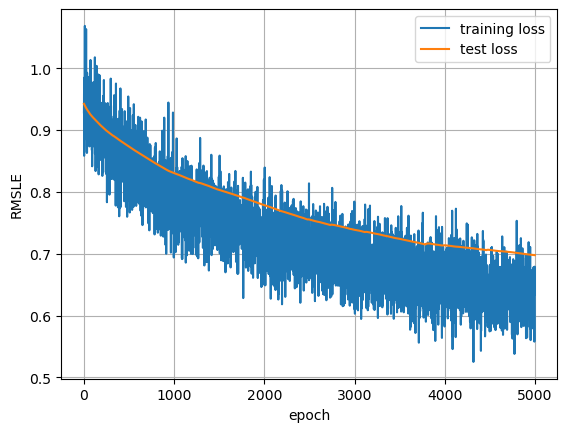


  0%|          | 0/139 [00:00<?, ?it/s]

2020-05-04
average explainable edge mask: tensor(0.1533)
number of edges in edge mask: 82
number of self edges: tensor(23)
number of inter edges: tensor(59)
date_range_start
2020-04-06    14
2020-04-13    11
2020-04-20    11
2020-04-27     9
2020-05-04    10
dtype: int64



  1%|          | 1/139 [00:02<05:22,  2.34s/it]

2020-05-11
average explainable edge mask: tensor(0.1489)
number of edges in edge mask: 83
number of self edges: tensor(18)
number of inter edges: tensor(65)
date_range_start
2020-04-13     8
2020-04-20    10
2020-04-27    13
2020-05-04    11
2020-05-11    13
dtype: int64



  1%|▏         | 2/139 [00:04<05:15,  2.30s/it]

2020-05-18
average explainable edge mask: tensor(0.1154)
number of edges in edge mask: 55
number of self edges: tensor(11)
number of inter edges: tensor(44)
date_range_start
2020-04-20     7
2020-04-27     5
2020-05-04     6
2020-05-11     8
2020-05-18    11
dtype: int64



  2%|▏         | 3/139 [00:06<04:51,  2.15s/it]

2020-05-25
average explainable edge mask: tensor(0.1007)
number of edges in edge mask: 43
number of self edges: tensor(8)
number of inter edges: tensor(35)
date_range_start
2020-04-27    5
2020-05-04    3
2020-05-11    3
2020-05-18    5
2020-05-25    7
dtype: int64



  3%|▎         | 4/139 [00:08<04:24,  1.96s/it]

2020-06-01
average explainable edge mask: tensor(0.0760)
number of edges in edge mask: 26
number of self edges: tensor(4)
number of inter edges: tensor(22)
date_range_start
2020-05-04    3
2020-05-11    3
2020-05-25    1
2020-06-01    3
dtype: int64



  4%|▎         | 5/139 [00:09<03:56,  1.76s/it]

2020-06-08
average explainable edge mask: tensor(0.0822)
number of edges in edge mask: 33
number of self edges: tensor(3)
number of inter edges: tensor(30)
date_range_start
2020-05-11    2
2020-05-18    5
2020-05-25    4
2020-06-01    1
2020-06-08    3
dtype: int64



  4%|▍         | 6/139 [00:11<03:43,  1.68s/it]

2020-06-15
average explainable edge mask: tensor(0.0698)
number of edges in edge mask: 23
number of self edges: tensor(5)
number of inter edges: tensor(18)
date_range_start
2020-05-18    2
2020-05-25    3
2020-06-08    3
2020-06-15    4
dtype: int64



  5%|▌         | 7/139 [00:12<03:31,  1.60s/it]

2020-06-22
average explainable edge mask: tensor(0.0522)
number of edges in edge mask: 8
number of self edges: tensor(0)
number of inter edges: tensor(8)
date_range_start
2020-06-08    2
dtype: int64



  6%|▌         | 8/139 [00:13<03:17,  1.51s/it]

2020-06-29
average explainable edge mask: tensor(0.0495)
number of edges in edge mask: 7
number of self edges: tensor(0)
number of inter edges: tensor(7)
date_range_start
2020-06-01    1
2020-06-29    1
dtype: int64



  6%|▋         | 9/139 [00:15<03:14,  1.50s/it]

2020-07-06
average explainable edge mask: tensor(0.0586)
number of edges in edge mask: 12
number of self edges: tensor(0)
number of inter edges: tensor(12)
date_range_start
2020-06-08    1
2020-06-15    1
dtype: int64



  7%|▋         | 10/139 [00:16<03:06,  1.44s/it]

2020-07-13
average explainable edge mask: tensor(0.0738)
number of edges in edge mask: 30
number of self edges: tensor(4)
number of inter edges: tensor(26)
date_range_start
2020-06-15    2
2020-06-22    1
2020-06-29    2
2020-07-06    4
2020-07-13    4
dtype: int64



  8%|▊         | 11/139 [00:18<03:06,  1.46s/it]

2020-07-20
average explainable edge mask: tensor(0.0899)
number of edges in edge mask: 44
number of self edges: tensor(3)
number of inter edges: tensor(41)
date_range_start
2020-06-22    5
2020-06-29    5
2020-07-06    5
2020-07-13    3
2020-07-20    8
dtype: int64



  9%|▊         | 12/139 [00:20<03:23,  1.60s/it]

2020-07-27
average explainable edge mask: tensor(0.0774)
number of edges in edge mask: 30
number of self edges: tensor(5)
number of inter edges: tensor(25)
date_range_start
2020-06-29    4
2020-07-13    4
2020-07-20    3
2020-07-27    3
dtype: int64



  9%|▉         | 13/139 [00:21<03:18,  1.57s/it]

2020-08-03
average explainable edge mask: tensor(0.0809)
number of edges in edge mask: 35
number of self edges: tensor(1)
number of inter edges: tensor(34)
date_range_start
2020-07-06    6
2020-07-13    1
2020-07-20    3
2020-07-27    5
2020-08-03    3
dtype: int64



 10%|█         | 14/139 [00:23<03:25,  1.64s/it]

2020-08-10
average explainable edge mask: tensor(0.0765)
number of edges in edge mask: 28
number of self edges: tensor(1)
number of inter edges: tensor(27)
date_range_start
2020-07-20    2
2020-07-27    1
2020-08-03    4
2020-08-10    2
dtype: int64



 11%|█         | 15/139 [00:24<03:17,  1.59s/it]

2020-08-17
average explainable edge mask: tensor(0.0745)
number of edges in edge mask: 27
number of self edges: tensor(1)
number of inter edges: tensor(26)
date_range_start
2020-07-27    1
2020-08-03    2
2020-08-10    4
2020-08-17    5
dtype: int64



 12%|█▏        | 16/139 [00:26<03:30,  1.71s/it]

2020-08-24
average explainable edge mask: tensor(0.0743)
number of edges in edge mask: 28
number of self edges: tensor(3)
number of inter edges: tensor(25)
date_range_start
2020-07-27    1
2020-08-10    3
2020-08-17    2
2020-08-24    3
dtype: int64



 12%|█▏        | 17/139 [00:28<03:34,  1.76s/it]

2020-08-31
average explainable edge mask: tensor(0.0757)
number of edges in edge mask: 35
number of self edges: tensor(5)
number of inter edges: tensor(30)
date_range_start
2020-08-03    3
2020-08-10    6
2020-08-17    5
2020-08-24    1
2020-08-31    3
dtype: int64



 13%|█▎        | 18/139 [00:30<03:29,  1.73s/it]

2020-09-07
average explainable edge mask: tensor(0.0866)
number of edges in edge mask: 50
number of self edges: tensor(7)
number of inter edges: tensor(43)
date_range_start
2020-08-10    5
2020-08-17    8
2020-08-24    7
2020-08-31    6
2020-09-07    4
dtype: int64



 14%|█▎        | 19/139 [00:33<04:12,  2.10s/it]

2020-09-14
average explainable edge mask: tensor(0.0984)
number of edges in edge mask: 62
number of self edges: tensor(4)
number of inter edges: tensor(58)
date_range_start
2020-08-17    11
2020-08-24     3
2020-08-31     7
2020-09-07     6
2020-09-14    12
dtype: int64



 14%|█▍        | 20/139 [00:35<04:11,  2.11s/it]

2020-09-21
average explainable edge mask: tensor(0.1001)
number of edges in edge mask: 62
number of self edges: tensor(12)
number of inter edges: tensor(50)
date_range_start
2020-08-24    11
2020-08-31     7
2020-09-07     8
2020-09-14     7
2020-09-21     9
dtype: int64



 15%|█▌        | 21/139 [00:37<04:13,  2.15s/it]

2020-09-28
average explainable edge mask: tensor(0.1105)
number of edges in edge mask: 70
number of self edges: tensor(8)
number of inter edges: tensor(62)
date_range_start
2020-08-31    10
2020-09-07     4
2020-09-14    11
2020-09-21    11
2020-09-28     9
dtype: int64



 16%|█▌        | 22/139 [00:39<04:12,  2.16s/it]

2020-10-05
average explainable edge mask: tensor(0.1326)
number of edges in edge mask: 94
number of self edges: tensor(12)
number of inter edges: tensor(82)
date_range_start
2020-09-07    14
2020-09-14    10
2020-09-21    13
2020-09-28    15
2020-10-05    17
dtype: int64



 17%|█▋        | 23/139 [00:42<04:26,  2.30s/it]

2020-10-12
average explainable edge mask: tensor(0.1349)
number of edges in edge mask: 96
number of self edges: tensor(16)
number of inter edges: tensor(80)
date_range_start
2020-09-14    15
2020-09-21    19
2020-09-28     8
2020-10-05    15
2020-10-12    12
dtype: int64



 17%|█▋        | 24/139 [00:45<04:32,  2.37s/it]

2020-10-19
average explainable edge mask: tensor(0.1404)
number of edges in edge mask: 102
number of self edges: tensor(20)
number of inter edges: tensor(82)
date_range_start
2020-09-21    14
2020-09-28     4
2020-10-05    18
2020-10-12    18
2020-10-19    19
dtype: int64



 18%|█▊        | 25/139 [00:47<04:38,  2.44s/it]

2020-10-26
average explainable edge mask: tensor(0.1427)
number of edges in edge mask: 102
number of self edges: tensor(20)
number of inter edges: tensor(82)
date_range_start
2020-09-28    16
2020-10-05    10
2020-10-12    21
2020-10-19    15
2020-10-26    12
dtype: int64



 19%|█▊        | 26/139 [00:50<04:51,  2.58s/it]

2020-11-02
average explainable edge mask: tensor(0.1536)
number of edges in edge mask: 112
number of self edges: tensor(19)
number of inter edges: tensor(93)
date_range_start
2020-10-05    15
2020-10-12    14
2020-10-19    18
2020-10-26    18
2020-11-02    18
dtype: int64



 19%|█▉        | 27/139 [00:53<04:56,  2.65s/it]

2020-11-09
average explainable edge mask: tensor(0.1619)
number of edges in edge mask: 116
number of self edges: tensor(22)
number of inter edges: tensor(94)
date_range_start
2020-10-12    19
2020-10-19    15
2020-10-26    19
2020-11-02    17
2020-11-09    16
dtype: int64



 20%|██        | 28/139 [00:56<04:57,  2.68s/it]

2020-11-16
average explainable edge mask: tensor(0.1626)
number of edges in edge mask: 115
number of self edges: tensor(20)
number of inter edges: tensor(95)
date_range_start
2020-10-19    14
2020-10-26    21
2020-11-02    11
2020-11-09    19
2020-11-16    20
dtype: int64



 21%|██        | 29/139 [00:59<05:04,  2.77s/it]

2020-11-23
average explainable edge mask: tensor(0.1826)
number of edges in edge mask: 134
number of self edges: tensor(20)
number of inter edges: tensor(114)
date_range_start
2020-10-26    17
2020-11-02    29
2020-11-09    18
2020-11-16    17
2020-11-23    22
dtype: int64



 22%|██▏       | 30/139 [01:02<05:16,  2.90s/it]

2020-11-30
average explainable edge mask: tensor(0.1665)
number of edges in edge mask: 119
number of self edges: tensor(26)
number of inter edges: tensor(93)
date_range_start
2020-11-02    22
2020-11-09    13
2020-11-16    16
2020-11-23    20
2020-11-30    18
dtype: int64



 22%|██▏       | 31/139 [01:05<05:08,  2.86s/it]

2020-12-07
average explainable edge mask: tensor(0.1599)
number of edges in edge mask: 115
number of self edges: tensor(22)
number of inter edges: tensor(93)
date_range_start
2020-11-09    14
2020-11-16    22
2020-11-23    20
2020-11-30    17
2020-12-07    11
dtype: int64



 23%|██▎       | 32/139 [01:07<05:04,  2.84s/it]

2020-12-14
average explainable edge mask: tensor(0.1678)
number of edges in edge mask: 122
number of self edges: tensor(23)
number of inter edges: tensor(99)
date_range_start
2020-11-16    14
2020-11-23    19
2020-11-30    23
2020-12-07    22
2020-12-14    13
dtype: int64



 24%|██▎       | 33/139 [01:10<05:04,  2.87s/it]

2020-12-21
average explainable edge mask: tensor(0.1639)
number of edges in edge mask: 116
number of self edges: tensor(21)
number of inter edges: tensor(95)
date_range_start
2020-11-23    17
2020-11-30    13
2020-12-07    23
2020-12-14    12
2020-12-21    21
dtype: int64



 24%|██▍       | 34/139 [01:13<05:01,  2.87s/it]

2020-12-28
average explainable edge mask: tensor(0.1739)
number of edges in edge mask: 124
number of self edges: tensor(23)
number of inter edges: tensor(101)
date_range_start
2020-11-30    16
2020-12-07    14
2020-12-14    24
2020-12-21    20
2020-12-28    20
dtype: int64



 25%|██▌       | 35/139 [01:16<05:06,  2.95s/it]

2021-01-04
average explainable edge mask: tensor(0.1677)
number of edges in edge mask: 118
number of self edges: tensor(24)
number of inter edges: tensor(94)
date_range_start
2020-12-07    14
2020-12-14    31
2020-12-21    20
2020-12-28    21
2021-01-04     1
dtype: int64



 26%|██▌       | 36/139 [01:20<05:08,  2.99s/it]

2021-01-11
average explainable edge mask: tensor(0.1553)
number of edges in edge mask: 112
number of self edges: tensor(21)
number of inter edges: tensor(91)
date_range_start
2020-12-14    19
2020-12-21    12
2020-12-28    12
2021-01-04    20
2021-01-11    20
dtype: int64



 27%|██▋       | 37/139 [01:22<05:00,  2.95s/it]

2021-01-18
average explainable edge mask: tensor(0.1600)
number of edges in edge mask: 116
number of self edges: tensor(19)
number of inter edges: tensor(97)
date_range_start
2020-12-21     8
2020-12-28     9
2021-01-04    21
2021-01-11    29
2021-01-18    19
dtype: int64



 27%|██▋       | 38/139 [01:25<04:55,  2.93s/it]

2021-01-25
average explainable edge mask: tensor(0.1577)
number of edges in edge mask: 111
number of self edges: tensor(22)
number of inter edges: tensor(89)
date_range_start
2020-12-28     6
2021-01-04    19
2021-01-11    19
2021-01-18    17
2021-01-25    20
dtype: int64



 28%|██▊       | 39/139 [01:28<04:47,  2.87s/it]

2021-02-01
average explainable edge mask: tensor(0.1649)
number of edges in edge mask: 110
number of self edges: tensor(17)
number of inter edges: tensor(93)
date_range_start
2021-01-04    13
2021-01-11    18
2021-01-18    19
2021-01-25    15
2021-02-01    14
dtype: int64



 29%|██▉       | 40/139 [01:31<04:40,  2.83s/it]

2021-02-08
average explainable edge mask: tensor(0.1696)
number of edges in edge mask: 124
number of self edges: tensor(20)
number of inter edges: tensor(104)
date_range_start
2021-01-11    19
2021-01-18    19
2021-01-25    19
2021-02-01    17
2021-02-08    20
dtype: int64



 29%|██▉       | 41/139 [01:34<04:44,  2.90s/it]

2021-02-15
average explainable edge mask: tensor(0.1654)
number of edges in edge mask: 125
number of self edges: tensor(24)
number of inter edges: tensor(101)
date_range_start
2021-01-18    23
2021-01-25    12
2021-02-01    15
2021-02-08    28
2021-02-15    18
dtype: int64



 30%|███       | 42/139 [01:37<04:43,  2.92s/it]

2021-02-22
average explainable edge mask: tensor(0.1348)
number of edges in edge mask: 99
number of self edges: tensor(21)
number of inter edges: tensor(78)
date_range_start
2021-01-25    11
2021-02-01    12
2021-02-08    19
2021-02-15    17
2021-02-22    15
dtype: int64



 31%|███       | 43/139 [01:39<04:30,  2.81s/it]

2021-03-01
average explainable edge mask: tensor(0.0672)
number of edges in edge mask: 24
number of self edges: tensor(4)
number of inter edges: tensor(20)
date_range_start
2021-02-08    4
2021-02-15    2
2021-02-22    3
2021-03-01    3
dtype: int64



 32%|███▏      | 44/139 [01:41<03:54,  2.47s/it]

2021-03-08
average explainable edge mask: tensor(0.0636)
number of edges in edge mask: 24
number of self edges: tensor(2)
number of inter edges: tensor(22)
date_range_start
2021-02-08    1
2021-02-15    3
2021-02-22    4
2021-03-01    4
2021-03-08    3
dtype: int64



 32%|███▏      | 45/139 [01:43<03:30,  2.24s/it]

2021-03-15
average explainable edge mask: tensor(0.0806)
number of edges in edge mask: 35
number of self edges: tensor(5)
number of inter edges: tensor(30)
date_range_start
2021-02-15    4
2021-02-22    7
2021-03-01    6
2021-03-08    3
2021-03-15    2
dtype: int64



 33%|███▎      | 46/139 [01:44<03:14,  2.09s/it]

2021-03-22
average explainable edge mask: tensor(0.1527)
number of edges in edge mask: 106
number of self edges: tensor(24)
number of inter edges: tensor(82)
date_range_start
2021-02-22    14
2021-03-01    18
2021-03-08    16
2021-03-15    16
2021-03-22    17
dtype: int64



 34%|███▍      | 47/139 [01:47<03:27,  2.25s/it]

2021-03-29
average explainable edge mask: tensor(0.1704)
number of edges in edge mask: 128
number of self edges: tensor(24)
number of inter edges: tensor(104)
date_range_start
2021-03-01    17
2021-03-08    21
2021-03-15    18
2021-03-22    18
2021-03-29    25
dtype: int64



 35%|███▍      | 48/139 [01:51<04:04,  2.69s/it]

2021-04-05
average explainable edge mask: tensor(0.1672)
number of edges in edge mask: 126
number of self edges: tensor(22)
number of inter edges: tensor(104)
date_range_start
2021-03-08    26
2021-03-15    15
2021-03-22    18
2021-03-29    20
2021-04-05    17
dtype: int64



 35%|███▌      | 49/139 [01:54<04:16,  2.85s/it]

2021-04-12
average explainable edge mask: tensor(0.1573)
number of edges in edge mask: 116
number of self edges: tensor(18)
number of inter edges: tensor(98)
date_range_start
2021-03-15    17
2021-03-22    17
2021-03-29    15
2021-04-05    18
2021-04-12    19
dtype: int64



 36%|███▌      | 50/139 [01:57<04:15,  2.88s/it]

2021-04-19
average explainable edge mask: tensor(0.1596)
number of edges in edge mask: 119
number of self edges: tensor(21)
number of inter edges: tensor(98)
date_range_start
2021-03-22    19
2021-03-29    21
2021-04-05    14
2021-04-12    16
2021-04-19    19
dtype: int64



 37%|███▋      | 51/139 [02:00<04:16,  2.92s/it]

2021-04-26
average explainable edge mask: tensor(0.1406)
number of edges in edge mask: 100
number of self edges: tensor(18)
number of inter edges: tensor(82)
date_range_start
2021-03-29    13
2021-04-05    12
2021-04-12    13
2021-04-19    18
2021-04-26    15
dtype: int64



 37%|███▋      | 52/139 [02:03<04:08,  2.85s/it]

2021-05-03
average explainable edge mask: tensor(0.1402)
number of edges in edge mask: 103
number of self edges: tensor(13)
number of inter edges: tensor(90)
date_range_start
2021-04-05    14
2021-04-12    15
2021-04-19    11
2021-04-26    15
2021-05-03    19
dtype: int64



 38%|███▊      | 53/139 [02:05<04:02,  2.83s/it]

2021-05-10
average explainable edge mask: tensor(0.1269)
number of edges in edge mask: 92
number of self edges: tensor(16)
number of inter edges: tensor(76)
date_range_start
2021-04-12    12
2021-04-19    17
2021-04-26     8
2021-05-03    20
2021-05-10     9
dtype: int64



 39%|███▉      | 54/139 [02:08<03:51,  2.72s/it]

2021-05-17
average explainable edge mask: tensor(0.0875)
number of edges in edge mask: 47
number of self edges: tensor(7)
number of inter edges: tensor(40)
date_range_start
2021-04-19    3
2021-04-26    6
2021-05-03    6
2021-05-10    4
2021-05-17    8
dtype: int64



 40%|███▉      | 55/139 [02:10<03:25,  2.45s/it]

2021-05-24
average explainable edge mask: tensor(0.0656)
number of edges in edge mask: 24
number of self edges: tensor(2)
number of inter edges: tensor(22)
date_range_start
2021-05-03    1
2021-05-10    4
2021-05-17    1
2021-05-24    3
dtype: int64



 40%|████      | 56/139 [02:11<03:01,  2.19s/it]

2021-05-31
average explainable edge mask: tensor(0.0508)
number of edges in edge mask: 7
number of self edges: tensor(0)
number of inter edges: tensor(7)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 41%|████      | 57/139 [02:13<02:38,  1.93s/it]

2021-06-07
average explainable edge mask: tensor(0.0405)
number of edges in edge mask: 3
number of self edges: tensor(0)
number of inter edges: tensor(3)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 42%|████▏     | 58/139 [02:14<02:19,  1.72s/it]

2021-06-14
average explainable edge mask: tensor(0.0395)
number of edges in edge mask: 2
number of self edges: tensor(0)
number of inter edges: tensor(2)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 42%|████▏     | 59/139 [02:15<02:08,  1.60s/it]

2021-06-21
average explainable edge mask: tensor(0.0386)
number of edges in edge mask: 3
number of self edges: tensor(0)
number of inter edges: tensor(3)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 43%|████▎     | 60/139 [02:16<01:59,  1.51s/it]

2021-06-28
average explainable edge mask: tensor(0.0451)
number of edges in edge mask: 1
number of self edges: tensor(0)
number of inter edges: tensor(1)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 44%|████▍     | 61/139 [02:18<01:52,  1.44s/it]

2021-07-05
average explainable edge mask: tensor(0.0656)
number of edges in edge mask: 17
number of self edges: tensor(1)
number of inter edges: tensor(16)
date_range_start
2021-06-07    1
2021-06-14    4
2021-06-21    2
2021-07-05    3
dtype: int64



 45%|████▍     | 62/139 [02:19<01:54,  1.48s/it]

2021-07-12
average explainable edge mask: tensor(0.0987)
number of edges in edge mask: 57
number of self edges: tensor(8)
number of inter edges: tensor(49)
date_range_start
2021-06-14     7
2021-06-21     7
2021-06-28    11
2021-07-05     7
2021-07-12     9
dtype: int64



 45%|████▌     | 63/139 [02:21<02:07,  1.67s/it]

2021-07-19
average explainable edge mask: tensor(0.1389)
number of edges in edge mask: 106
number of self edges: tensor(10)
number of inter edges: tensor(96)
date_range_start
2021-06-21    19
2021-06-28    15
2021-07-05    14
2021-07-12    17
2021-07-19    15
dtype: int64



 46%|████▌     | 64/139 [02:24<02:33,  2.05s/it]

2021-07-26
average explainable edge mask: tensor(0.1616)
number of edges in edge mask: 135
number of self edges: tensor(18)
number of inter edges: tensor(117)
date_range_start
2021-06-28    22
2021-07-05    19
2021-07-12    24
2021-07-19    20
2021-07-26    20
dtype: int64



 47%|████▋     | 65/139 [02:28<03:06,  2.53s/it]

2021-08-02
average explainable edge mask: tensor(0.1794)
number of edges in edge mask: 158
number of self edges: tensor(34)
number of inter edges: tensor(124)
date_range_start
2021-07-05    26
2021-07-12    27
2021-07-19    23
2021-07-26    22
2021-08-02    30
dtype: int64



 47%|████▋     | 66/139 [02:32<03:31,  2.90s/it]

2021-08-09
average explainable edge mask: tensor(0.1836)
number of edges in edge mask: 165
number of self edges: tensor(23)
number of inter edges: tensor(142)
date_range_start
2021-07-12    24
2021-07-19    25
2021-07-26    23
2021-08-02    31
2021-08-09    32
dtype: int64



 48%|████▊     | 67/139 [02:36<03:57,  3.29s/it]

2021-08-16
average explainable edge mask: tensor(0.1840)
number of edges in edge mask: 168
number of self edges: tensor(21)
number of inter edges: tensor(147)
date_range_start
2021-07-19    27
2021-07-26    25
2021-08-02    29
2021-08-09    29
2021-08-16    28
dtype: int64



 49%|████▉     | 68/139 [02:40<04:13,  3.57s/it]

2021-08-23
average explainable edge mask: tensor(0.1816)
number of edges in edge mask: 167
number of self edges: tensor(24)
number of inter edges: tensor(143)
date_range_start
2021-07-26    15
2021-08-02    27
2021-08-09    24
2021-08-16    31
2021-08-23    40
dtype: int64



 50%|████▉     | 69/139 [02:44<04:18,  3.69s/it]

2021-08-30
average explainable edge mask: tensor(0.1772)
number of edges in edge mask: 164
number of self edges: tensor(19)
number of inter edges: tensor(145)
date_range_start
2021-08-02    24
2021-08-09    24
2021-08-16    30
2021-08-23    23
2021-08-30    33
dtype: int64



 50%|█████     | 70/139 [02:48<04:20,  3.78s/it]

2021-09-06
average explainable edge mask: tensor(0.1604)
number of edges in edge mask: 146
number of self edges: tensor(18)
number of inter edges: tensor(128)
date_range_start
2021-08-09    20
2021-08-16    23
2021-08-23    30
2021-08-30    19
2021-09-06    24
dtype: int64



 51%|█████     | 71/139 [02:52<04:14,  3.74s/it]

2021-09-13
average explainable edge mask: tensor(0.1556)
number of edges in edge mask: 144
number of self edges: tensor(19)
number of inter edges: tensor(125)
date_range_start
2021-08-16    28
2021-08-23    20
2021-08-30    24
2021-09-06    19
2021-09-13    23
dtype: int64



 52%|█████▏    | 72/139 [02:56<04:11,  3.75s/it]

2021-09-20
average explainable edge mask: tensor(0.1554)
number of edges in edge mask: 142
number of self edges: tensor(18)
number of inter edges: tensor(124)
date_range_start
2021-08-23    27
2021-08-30    16
2021-09-06    26
2021-09-13    24
2021-09-20    19
dtype: int64



 53%|█████▎    | 73/139 [02:59<04:03,  3.69s/it]

2021-09-27
average explainable edge mask: tensor(0.1543)
number of edges in edge mask: 139
number of self edges: tensor(25)
number of inter edges: tensor(114)
date_range_start
2021-08-30    23
2021-09-06    22
2021-09-13    20
2021-09-20    18
2021-09-27    26
dtype: int64



 53%|█████▎    | 74/139 [03:02<03:53,  3.59s/it]

2021-10-04
average explainable edge mask: tensor(0.1527)
number of edges in edge mask: 132
number of self edges: tensor(22)
number of inter edges: tensor(110)
date_range_start
2021-09-06    21
2021-09-13    16
2021-09-20    25
2021-09-27    19
2021-10-04    23
dtype: int64



 54%|█████▍    | 75/139 [03:06<03:43,  3.50s/it]

2021-10-11
average explainable edge mask: tensor(0.1628)
number of edges in edge mask: 139
number of self edges: tensor(21)
number of inter edges: tensor(118)
date_range_start
2021-09-13    24
2021-09-20    20
2021-09-27    22
2021-10-04    21
2021-10-11    22
dtype: int64



 55%|█████▍    | 76/139 [03:09<03:40,  3.51s/it]

2021-10-18
average explainable edge mask: tensor(0.1398)
number of edges in edge mask: 112
number of self edges: tensor(20)
number of inter edges: tensor(92)
date_range_start
2021-09-20    14
2021-09-27    13
2021-10-04    21
2021-10-11    17
2021-10-18    17
dtype: int64



 55%|█████▌    | 77/139 [03:12<03:24,  3.30s/it]

2021-10-25
average explainable edge mask: tensor(0.1310)
number of edges in edge mask: 101
number of self edges: tensor(17)
number of inter edges: tensor(84)
date_range_start
2021-09-27    19
2021-10-04    12
2021-10-11    20
2021-10-18    13
2021-10-25    10
dtype: int64



 56%|█████▌    | 78/139 [03:15<03:09,  3.10s/it]

2021-11-01
average explainable edge mask: tensor(0.1202)
number of edges in edge mask: 88
number of self edges: tensor(20)
number of inter edges: tensor(68)
date_range_start
2021-10-04    14
2021-10-11    12
2021-10-18    13
2021-10-25    10
2021-11-01    14
dtype: int64



 57%|█████▋    | 79/139 [03:17<02:52,  2.87s/it]

2021-11-08
average explainable edge mask: tensor(0.1569)
number of edges in edge mask: 126
number of self edges: tensor(15)
number of inter edges: tensor(111)
date_range_start
2021-10-11    19
2021-10-18    22
2021-10-25    20
2021-11-01    21
2021-11-08    15
dtype: int64



 58%|█████▊    | 80/139 [03:21<03:02,  3.09s/it]

2021-11-15
average explainable edge mask: tensor(0.1693)
number of edges in edge mask: 136
number of self edges: tensor(24)
number of inter edges: tensor(112)
date_range_start
2021-10-18    21
2021-10-25    19
2021-11-01    22
2021-11-08    22
2021-11-15    22
dtype: int64



 58%|█████▊    | 81/139 [03:24<03:03,  3.17s/it]

2021-11-22
average explainable edge mask: tensor(0.1804)
number of edges in edge mask: 150
number of self edges: tensor(20)
number of inter edges: tensor(130)
date_range_start
2021-10-25    26
2021-11-01    23
2021-11-08    22
2021-11-15    21
2021-11-22    29
dtype: int64



 59%|█████▉    | 82/139 [03:28<03:07,  3.30s/it]

2021-11-29
average explainable edge mask: tensor(0.1635)
number of edges in edge mask: 131
number of self edges: tensor(18)
number of inter edges: tensor(113)
date_range_start
2021-11-01    22
2021-11-08    21
2021-11-15    18
2021-11-22    20
2021-11-29    21
dtype: int64



 60%|█████▉    | 83/139 [03:32<03:25,  3.67s/it]

2021-12-06
average explainable edge mask: tensor(0.1589)
number of edges in edge mask: 127
number of self edges: tensor(27)
number of inter edges: tensor(100)
date_range_start
2021-11-08    20
2021-11-15    19
2021-11-22    26
2021-11-29    14
2021-12-06    18
dtype: int64



 60%|██████    | 84/139 [03:35<03:10,  3.47s/it]

2021-12-13
average explainable edge mask: tensor(0.1645)
number of edges in edge mask: 132
number of self edges: tensor(23)
number of inter edges: tensor(109)
date_range_start
2021-11-15    21
2021-11-22    21
2021-11-29    20
2021-12-06    18
2021-12-13    21
dtype: int64



 61%|██████    | 85/139 [03:38<03:01,  3.36s/it]

2021-12-20
average explainable edge mask: tensor(0.1611)
number of edges in edge mask: 127
number of self edges: tensor(23)
number of inter edges: tensor(104)
date_range_start
2021-11-22    19
2021-11-29    19
2021-12-06    21
2021-12-13    18
2021-12-20    19
dtype: int64



 62%|██████▏   | 86/139 [03:41<02:52,  3.25s/it]

2021-12-27
average explainable edge mask: tensor(0.1640)
number of edges in edge mask: 123
number of self edges: tensor(17)
number of inter edges: tensor(106)
date_range_start
2021-11-29    21
2021-12-06    18
2021-12-13    14
2021-12-20    17
2021-12-27    24
dtype: int64



 63%|██████▎   | 87/139 [03:44<02:46,  3.20s/it]

2022-01-03
average explainable edge mask: tensor(0.1824)
number of edges in edge mask: 145
number of self edges: tensor(30)
number of inter edges: tensor(115)
date_range_start
2021-12-06    24
2021-12-13    28
2021-12-20    26
2021-12-27    23
2022-01-03    10
dtype: int64



 63%|██████▎   | 88/139 [03:48<02:43,  3.20s/it]

2022-01-10
average explainable edge mask: tensor(0.1958)
number of edges in edge mask: 164
number of self edges: tensor(26)
number of inter edges: tensor(138)
date_range_start
2021-12-13    15
2021-12-20    18
2021-12-27    13
2022-01-03    38
2022-01-10    40
dtype: int64



 64%|██████▍   | 89/139 [03:51<02:45,  3.30s/it]

2022-01-17
average explainable edge mask: tensor(0.2083)
number of edges in edge mask: 176
number of self edges: tensor(26)
number of inter edges: tensor(150)
date_range_start
2021-12-20    13
2021-12-27    11
2022-01-03    34
2022-01-10    38
2022-01-17    36
dtype: int64



 65%|██████▍   | 90/139 [03:56<02:58,  3.65s/it]

2022-01-24
average explainable edge mask: tensor(0.2114)
number of edges in edge mask: 172
number of self edges: tensor(33)
number of inter edges: tensor(139)
date_range_start
2021-12-27     9
2022-01-03    27
2022-01-10    30
2022-01-17    41
2022-01-24    29
dtype: int64



 65%|██████▌   | 91/139 [03:59<02:59,  3.74s/it]

2022-01-31
average explainable edge mask: tensor(0.2096)
number of edges in edge mask: 168
number of self edges: tensor(33)
number of inter edges: tensor(135)
date_range_start
2022-01-03    28
2022-01-10    20
2022-01-17    32
2022-01-24    21
2022-01-31    28
dtype: int64



 66%|██████▌   | 92/139 [04:03<02:54,  3.71s/it]

2022-02-07
average explainable edge mask: tensor(0.1875)
number of edges in edge mask: 160
number of self edges: tensor(38)
number of inter edges: tensor(122)
date_range_start
2022-01-10    21
2022-01-17    24
2022-01-24    29
2022-01-31    24
2022-02-07    23
dtype: int64



 67%|██████▋   | 93/139 [04:06<02:43,  3.56s/it]

2022-02-14
average explainable edge mask: tensor(0.1756)
number of edges in edge mask: 154
number of self edges: tensor(27)
number of inter edges: tensor(127)
date_range_start
2022-01-17    27
2022-01-24    22
2022-01-31    28
2022-02-07    25
2022-02-14    23
dtype: int64



 68%|██████▊   | 94/139 [04:10<02:46,  3.70s/it]

2022-02-21
average explainable edge mask: tensor(0.1719)
number of edges in edge mask: 159
number of self edges: tensor(31)
number of inter edges: tensor(128)
date_range_start
2022-01-24    22
2022-01-31    26
2022-02-07    27
2022-02-14    26
2022-02-21    28
dtype: int64



 68%|██████▊   | 95/139 [04:14<02:44,  3.75s/it]

2022-02-28
average explainable edge mask: tensor(0.0533)
number of edges in edge mask: 20
number of self edges: tensor(2)
number of inter edges: tensor(18)
date_range_start
2022-01-31    2
2022-02-07    2
2022-02-14    1
2022-02-28    2
dtype: int64



 69%|██████▉   | 96/139 [04:16<02:13,  3.10s/it]

2022-03-07
average explainable edge mask: tensor(0.0347)
number of edges in edge mask: 1
number of self edges: tensor(0)
number of inter edges: tensor(1)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 70%|██████▉   | 97/139 [04:18<01:53,  2.71s/it]

2022-03-14
average explainable edge mask: tensor(0.0526)
number of edges in edge mask: 16
number of self edges: tensor(3)
number of inter edges: tensor(13)
date_range_start
2022-02-14    2
2022-02-21    2
2022-02-28    1
2022-03-07    1
2022-03-14    3
dtype: int64



 71%|███████   | 98/139 [04:19<01:37,  2.37s/it]

2022-03-21
average explainable edge mask: tensor(0.1016)
number of edges in edge mask: 65
number of self edges: tensor(10)
number of inter edges: tensor(55)
date_range_start
2022-02-21     8
2022-02-28    16
2022-03-07     7
2022-03-14    13
2022-03-21     6
dtype: int64



 71%|███████   | 99/139 [04:22<01:34,  2.36s/it]

2022-03-28
average explainable edge mask: tensor(0.1570)
number of edges in edge mask: 129
number of self edges: tensor(17)
number of inter edges: tensor(112)
date_range_start
2022-02-28    16
2022-03-07    14
2022-03-14    26
2022-03-21    26
2022-03-28    18
dtype: int64



 72%|███████▏  | 100/139 [04:25<01:44,  2.68s/it]

2022-04-04
average explainable edge mask: tensor(0.1732)
number of edges in edge mask: 147
number of self edges: tensor(22)
number of inter edges: tensor(125)
date_range_start
2022-03-07    28
2022-03-14    27
2022-03-21    29
2022-03-28    16
2022-04-04    17
dtype: int64



 73%|███████▎  | 101/139 [04:28<01:50,  2.91s/it]

2022-04-11
average explainable edge mask: tensor(0.1774)
number of edges in edge mask: 153
number of self edges: tensor(15)
number of inter edges: tensor(138)
date_range_start
2022-03-14    27
2022-03-21    31
2022-03-28    21
2022-04-04    21
2022-04-11    23
dtype: int64



 73%|███████▎  | 102/139 [04:32<01:56,  3.15s/it]

2022-04-18
average explainable edge mask: tensor(0.1851)
number of edges in edge mask: 161
number of self edges: tensor(33)
number of inter edges: tensor(128)
date_range_start
2022-03-21    24
2022-03-28    25
2022-04-04    24
2022-04-11    23
2022-04-18    35
dtype: int64



 74%|███████▍  | 103/139 [04:36<01:58,  3.30s/it]

2022-04-25
average explainable edge mask: tensor(0.1634)
number of edges in edge mask: 138
number of self edges: tensor(29)
number of inter edges: tensor(109)
date_range_start
2022-03-28    23
2022-04-04    16
2022-04-11    22
2022-04-18    26
2022-04-25    21
dtype: int64



 75%|███████▍  | 104/139 [04:39<01:53,  3.25s/it]

2022-05-02
average explainable edge mask: tensor(0.1612)
number of edges in edge mask: 137
number of self edges: tensor(22)
number of inter edges: tensor(115)
date_range_start
2022-04-04    19
2022-04-11    25
2022-04-18    23
2022-04-25    12
2022-05-02    28
dtype: int64



 76%|███████▌  | 105/139 [04:42<01:50,  3.26s/it]

2022-05-09
average explainable edge mask: tensor(0.1557)
number of edges in edge mask: 132
number of self edges: tensor(30)
number of inter edges: tensor(102)
date_range_start
2022-04-11    26
2022-04-18    22
2022-04-25    19
2022-05-02    16
2022-05-09    20
dtype: int64



 76%|███████▋  | 106/139 [04:45<01:46,  3.22s/it]

2022-05-16
average explainable edge mask: tensor(0.1549)
number of edges in edge mask: 126
number of self edges: tensor(18)
number of inter edges: tensor(108)
date_range_start
2022-04-18    15
2022-04-25    16
2022-05-02    21
2022-05-09    20
2022-05-16    23
dtype: int64



 77%|███████▋  | 107/139 [04:48<01:42,  3.19s/it]

2022-05-23
average explainable edge mask: tensor(0.1723)
number of edges in edge mask: 147
number of self edges: tensor(21)
number of inter edges: tensor(126)
date_range_start
2022-04-25    20
2022-05-02    22
2022-05-09    24
2022-05-16    19
2022-05-23    32
dtype: int64



 78%|███████▊  | 108/139 [04:52<01:41,  3.28s/it]

2022-05-30
average explainable edge mask: tensor(0.1510)
number of edges in edge mask: 124
number of self edges: tensor(21)
number of inter edges: tensor(103)
date_range_start
2022-05-02    24
2022-05-09    20
2022-05-16    12
2022-05-23    17
2022-05-30    22
dtype: int64



 78%|███████▊  | 109/139 [04:55<01:35,  3.18s/it]

2022-06-06
average explainable edge mask: tensor(0.1389)
number of edges in edge mask: 112
number of self edges: tensor(18)
number of inter edges: tensor(94)
date_range_start
2022-05-09    10
2022-05-16    16
2022-05-23    21
2022-05-30    14
2022-06-06    22
dtype: int64



 79%|███████▉  | 110/139 [04:58<01:32,  3.20s/it]

2022-06-13
average explainable edge mask: tensor(0.1150)
number of edges in edge mask: 86
number of self edges: tensor(11)
number of inter edges: tensor(75)
date_range_start
2022-05-16    14
2022-05-23    11
2022-05-30    14
2022-06-06     9
2022-06-13    12
dtype: int64



 80%|███████▉  | 111/139 [05:01<01:23,  2.98s/it]

2022-06-20
average explainable edge mask: tensor(0.1146)
number of edges in edge mask: 85
number of self edges: tensor(15)
number of inter edges: tensor(70)
date_range_start
2022-05-23     7
2022-05-30     9
2022-06-06    18
2022-06-13    16
2022-06-20    13
dtype: int64



 81%|████████  | 112/139 [05:03<01:16,  2.84s/it]

2022-06-27
average explainable edge mask: tensor(0.1070)
number of edges in edge mask: 74
number of self edges: tensor(14)
number of inter edges: tensor(60)
date_range_start
2022-05-30    12
2022-06-06     6
2022-06-13    12
2022-06-20    12
2022-06-27    11
dtype: int64



 81%|████████▏ | 113/139 [05:05<01:09,  2.69s/it]

2022-07-04
average explainable edge mask: tensor(0.1097)
number of edges in edge mask: 71
number of self edges: tensor(13)
number of inter edges: tensor(58)
date_range_start
2022-06-06    13
2022-06-13     8
2022-06-20     9
2022-06-27    13
2022-07-04    11
dtype: int64



 82%|████████▏ | 114/139 [05:08<01:03,  2.54s/it]

2022-07-11
average explainable edge mask: tensor(0.1563)
number of edges in edge mask: 123
number of self edges: tensor(19)
number of inter edges: tensor(104)
date_range_start
2022-06-13    17
2022-06-20    24
2022-06-27    18
2022-07-04    15
2022-07-11    21
dtype: int64



 83%|████████▎ | 115/139 [05:11<01:06,  2.76s/it]

2022-07-18
average explainable edge mask: tensor(0.1730)
number of edges in edge mask: 147
number of self edges: tensor(25)
number of inter edges: tensor(122)
date_range_start
2022-06-20    27
2022-06-27    20
2022-07-04    21
2022-07-11    23
2022-07-18    26
dtype: int64



 83%|████████▎ | 116/139 [05:14<01:08,  2.99s/it]

2022-07-25
average explainable edge mask: tensor(0.1718)
number of edges in edge mask: 149
number of self edges: tensor(20)
number of inter edges: tensor(129)
date_range_start
2022-06-27    28
2022-07-04    21
2022-07-11    21
2022-07-18    21
2022-07-25    28
dtype: int64



 84%|████████▍ | 117/139 [05:18<01:10,  3.21s/it]

2022-08-01
average explainable edge mask: tensor(0.1808)
number of edges in edge mask: 160
number of self edges: tensor(16)
number of inter edges: tensor(144)
date_range_start
2022-07-04    26
2022-07-11    22
2022-07-18    25
2022-07-25    30
2022-08-01    27
dtype: int64



 85%|████████▍ | 118/139 [05:22<01:11,  3.43s/it]

2022-08-08
average explainable edge mask: tensor(0.1814)
number of edges in edge mask: 157
number of self edges: tensor(24)
number of inter edges: tensor(133)
date_range_start
2022-07-11    29
2022-07-18    24
2022-07-25    22
2022-08-01    25
2022-08-08    27
dtype: int64



 86%|████████▌ | 119/139 [05:26<01:09,  3.49s/it]

2022-08-15
average explainable edge mask: tensor(0.1756)
number of edges in edge mask: 160
number of self edges: tensor(29)
number of inter edges: tensor(131)
date_range_start
2022-07-18    24
2022-07-25    21
2022-08-01    31
2022-08-08    27
2022-08-15    27
dtype: int64



 86%|████████▋ | 120/139 [05:29<01:07,  3.54s/it]

2022-08-22
average explainable edge mask: tensor(0.1614)
number of edges in edge mask: 154
number of self edges: tensor(29)
number of inter edges: tensor(125)
date_range_start
2022-07-25    24
2022-08-01    20
2022-08-08    32
2022-08-15    25
2022-08-22    23
dtype: int64



 87%|████████▋ | 121/139 [05:34<01:07,  3.76s/it]

2022-08-29
average explainable edge mask: tensor(0.1424)
number of edges in edge mask: 137
number of self edges: tensor(29)
number of inter edges: tensor(108)
date_range_start
2022-08-01    27
2022-08-08    27
2022-08-15    20
2022-08-22    19
2022-08-29    16
dtype: int64



 88%|████████▊ | 122/139 [05:37<01:02,  3.69s/it]

2022-09-05
average explainable edge mask: tensor(0.0839)
number of edges in edge mask: 51
number of self edges: tensor(5)
number of inter edges: tensor(46)
date_range_start
2022-08-08    11
2022-08-15     3
2022-08-22     6
2022-08-29     4
2022-09-05     2
dtype: int64



 88%|████████▊ | 123/139 [05:39<00:50,  3.14s/it]

2022-09-12
average explainable edge mask: tensor(0.0732)
number of edges in edge mask: 38
number of self edges: tensor(5)
number of inter edges: tensor(33)
date_range_start
2022-08-15    3
2022-08-22    4
2022-08-29    2
2022-09-05    3
2022-09-12    4
dtype: int64



 89%|████████▉ | 124/139 [05:41<00:40,  2.69s/it]

2022-09-19
average explainable edge mask: tensor(0.1577)
number of edges in edge mask: 137
number of self edges: tensor(17)
number of inter edges: tensor(120)
date_range_start
2022-08-22    26
2022-08-29    22
2022-09-05    21
2022-09-12    20
2022-09-19    18
dtype: int64



 90%|████████▉ | 125/139 [05:44<00:40,  2.92s/it]

2022-09-26
average explainable edge mask: tensor(0.1596)
number of edges in edge mask: 139
number of self edges: tensor(11)
number of inter edges: tensor(128)
date_range_start
2022-08-29    25
2022-09-05    24
2022-09-12    21
2022-09-19    21
2022-09-26    18
dtype: int64



 91%|█████████ | 126/139 [05:48<00:40,  3.10s/it]

2022-10-03
average explainable edge mask: tensor(0.1643)
number of edges in edge mask: 144
number of self edges: tensor(30)
number of inter edges: tensor(114)
date_range_start
2022-09-05    25
2022-09-12    23
2022-09-19    23
2022-09-26    21
2022-10-03    22
dtype: int64



 91%|█████████▏| 127/139 [05:51<00:37,  3.15s/it]

2022-10-10
average explainable edge mask: tensor(0.1698)
number of edges in edge mask: 143
number of self edges: tensor(23)
number of inter edges: tensor(120)
date_range_start
2022-09-12    27
2022-09-19    20
2022-09-26    21
2022-10-03    24
2022-10-10    21
dtype: int64



 92%|█████████▏| 128/139 [05:54<00:35,  3.24s/it]

2022-10-17
average explainable edge mask: tensor(0.1672)
number of edges in edge mask: 136
number of self edges: tensor(20)
number of inter edges: tensor(116)
date_range_start
2022-09-19    24
2022-09-26    17
2022-10-03    20
2022-10-10    23
2022-10-17    23
dtype: int64



 93%|█████████▎| 129/139 [05:58<00:32,  3.29s/it]

2022-10-24
average explainable edge mask: tensor(0.1459)
number of edges in edge mask: 119
number of self edges: tensor(16)
number of inter edges: tensor(103)
date_range_start
2022-09-26     9
2022-10-03    20
2022-10-10    16
2022-10-17    24
2022-10-24    21
dtype: int64



 94%|█████████▎| 130/139 [06:01<00:28,  3.19s/it]

2022-10-31
average explainable edge mask: tensor(0.1298)
number of edges in edge mask: 107
number of self edges: tensor(15)
number of inter edges: tensor(92)
date_range_start
2022-10-03    12
2022-10-10    18
2022-10-17    12
2022-10-24    18
2022-10-31    18
dtype: int64



 94%|█████████▍| 131/139 [06:04<00:24,  3.11s/it]

2022-11-07
average explainable edge mask: tensor(0.1161)
number of edges in edge mask: 93
number of self edges: tensor(6)
number of inter edges: tensor(87)
date_range_start
2022-10-10    12
2022-10-17    13
2022-10-24    11
2022-10-31    12
2022-11-07    18
dtype: int64



 95%|█████████▍| 132/139 [06:06<00:20,  2.97s/it]

2022-11-14
average explainable edge mask: tensor(0.0746)
number of edges in edge mask: 29
number of self edges: tensor(1)
number of inter edges: tensor(28)
date_range_start
2022-10-17    4
2022-10-24    4
2022-10-31    1
2022-11-07    1
2022-11-14    3
dtype: int64



 96%|█████████▌| 133/139 [06:08<00:15,  2.55s/it]

2022-11-21
average explainable edge mask: tensor(0.0820)
number of edges in edge mask: 37
number of self edges: tensor(5)
number of inter edges: tensor(32)
date_range_start
2022-10-24    2
2022-10-31    6
2022-11-07    4
2022-11-14    3
2022-11-21    7
dtype: int64



 96%|█████████▋| 134/139 [06:10<00:11,  2.29s/it]

2022-11-28
average explainable edge mask: tensor(0.0963)
number of edges in edge mask: 53
number of self edges: tensor(8)
number of inter edges: tensor(45)
date_range_start
2022-10-31    5
2022-11-07    9
2022-11-14    9
2022-11-21    7
2022-11-28    4
dtype: int64



 97%|█████████▋| 135/139 [06:11<00:08,  2.17s/it]

2022-12-05
average explainable edge mask: tensor(0.1486)
number of edges in edge mask: 116
number of self edges: tensor(19)
number of inter edges: tensor(97)
date_range_start
2022-11-07    19
2022-11-14    17
2022-11-21    20
2022-11-28    17
2022-12-05    16
dtype: int64



 98%|█████████▊| 136/139 [06:14<00:07,  2.38s/it]

2022-12-12
average explainable edge mask: tensor(0.1628)
number of edges in edge mask: 130
number of self edges: tensor(23)
number of inter edges: tensor(107)
date_range_start
2022-11-14    16
2022-11-21    17
2022-11-28    25
2022-12-05    22
2022-12-12    20
dtype: int64



 99%|█████████▊| 137/139 [06:17<00:05,  2.58s/it]

2022-12-19
average explainable edge mask: tensor(0.1588)
number of edges in edge mask: 128
number of self edges: tensor(20)
number of inter edges: tensor(108)
date_range_start
2022-11-21    25
2022-11-28    13
2022-12-05    18
2022-12-12    24
2022-12-19    19
dtype: int64



 99%|█████████▉| 138/139 [06:21<00:02,  2.77s/it]

2022-12-26
average explainable edge mask: tensor(0.1714)
number of edges in edge mask: 134
number of self edges: tensor(17)
number of inter edges: tensor(117)
date_range_start
2022-11-28    24
2022-12-05    20
2022-12-12    22
2022-12-19    22
2022-12-26    17
dtype: int64



100%|██████████| 139/139 [06:24<00:00,  2.77s/it]


unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


 20%|██        | 2/10 [24:32<1:39:57, 749.72s/it]

============= HHS REGION: 3 ============= 
processing data on device: cuda
unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350
unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
imputing using columns ['retail_and_recreation_percent_change_from_baseline', 'grocery_and_pharmacy_percent_change_from_baseline', 'transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline', 'residential_percent_change_from_baseline']
Percent of variation explained with first component: 76.10792683627832 %
[0.76107927 0.10546504 0.09323786 0.03661961 0.00359822]
Reading population data from https://www2.census.gov/programs-surveys/popest/datasets/2020-2023/counties/totals/co-est2023-alldata.csv
creating coo_df
Creating


Spatial Edges: 100%|██████████| 60292/60292 [00:02<00:00, 24374.62it/s]


60292 spatial edges
Creating temporal edges...
10437 temporal edges
processing safegraph data
Processing edge weights...



100%|██████████| 70729/70729 [00:00<00:00, 1538105.01it/s]


Processed data saved to ../data/processed/gcn-usa-2020-22-hhs-3/



100%|██████████| 5000/5000 [00:25<00:00, 195.96it/s]


final test loss: 0.5173078179359436
train loss tensor(0.3211, device='cuda:0', grad_fn=<SqrtBackward0>)
test loss tensor(0.5173, device='cuda:0', grad_fn=<SqrtBackward0>)
train corr tensor(0.9877, device='cuda:0', grad_fn=<SelectBackward0>)
test corr tensor(0.9861, device='cuda:0', grad_fn=<SelectBackward0>)


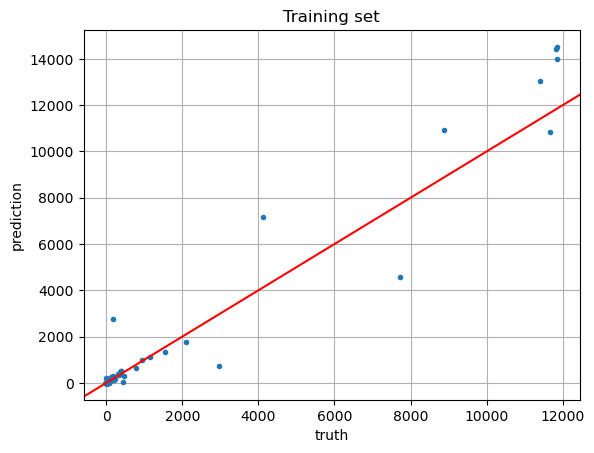

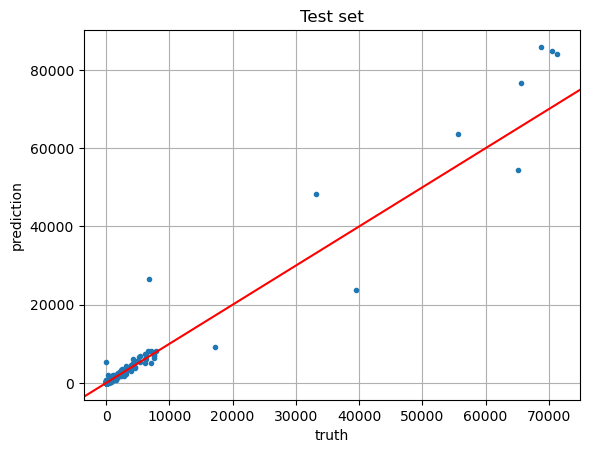

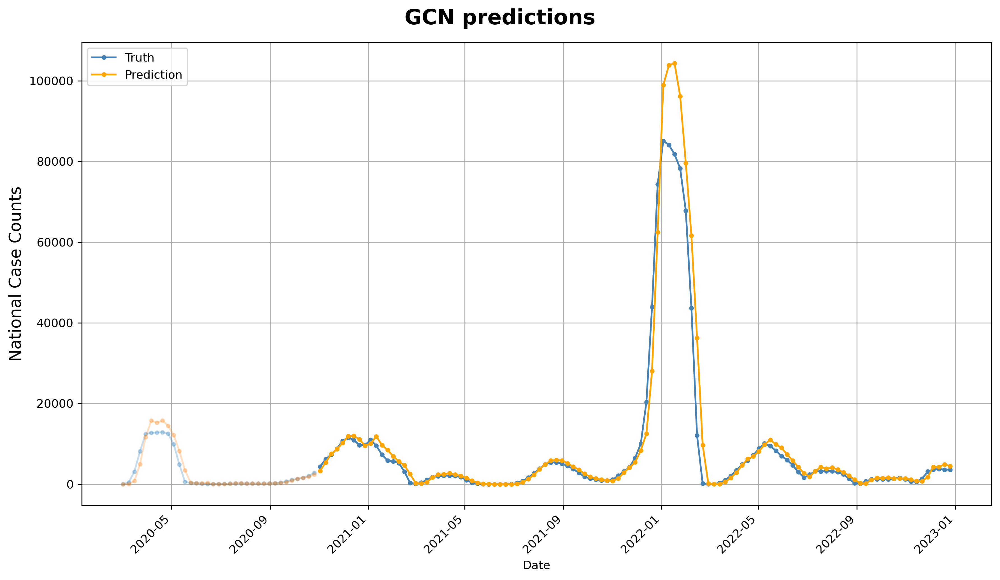

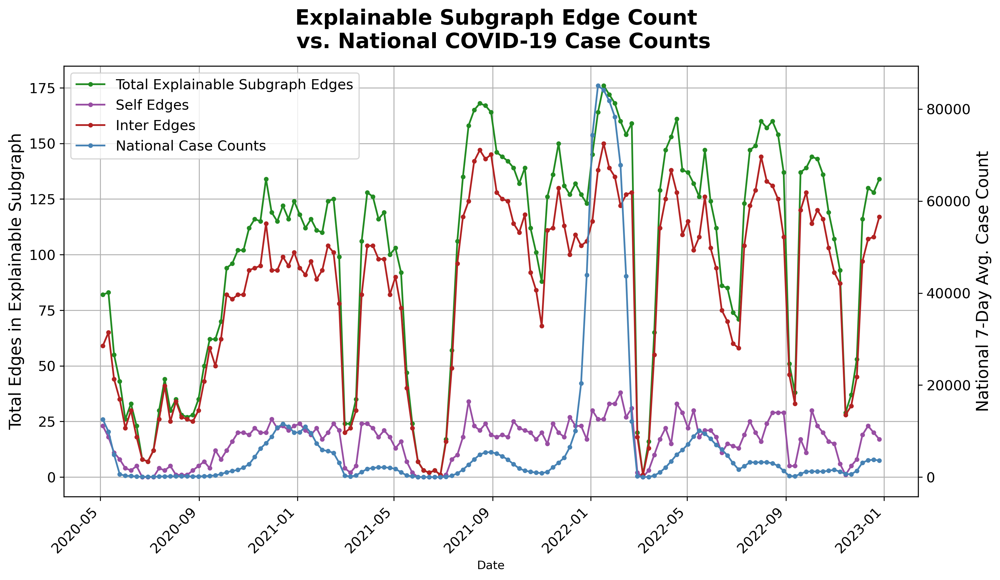

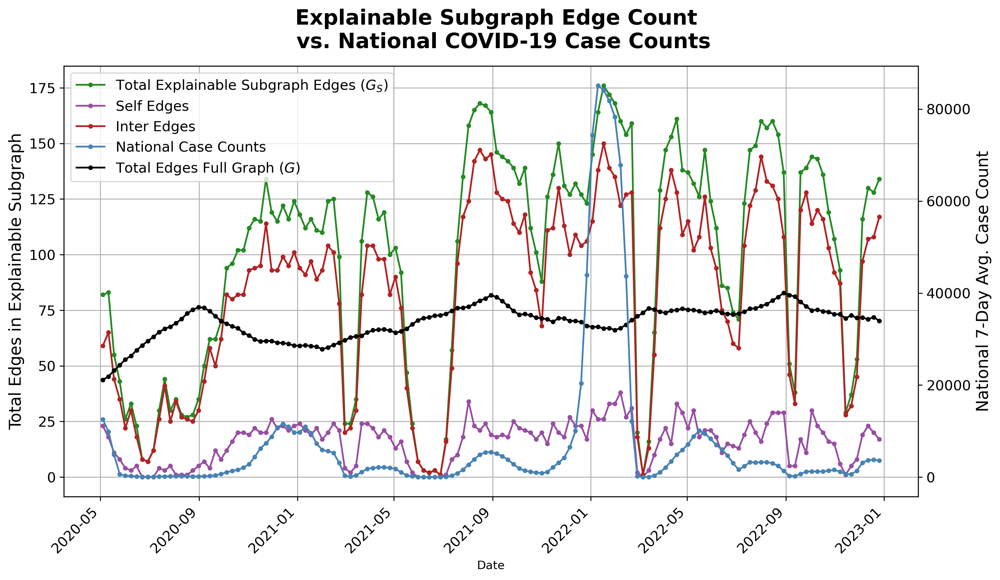

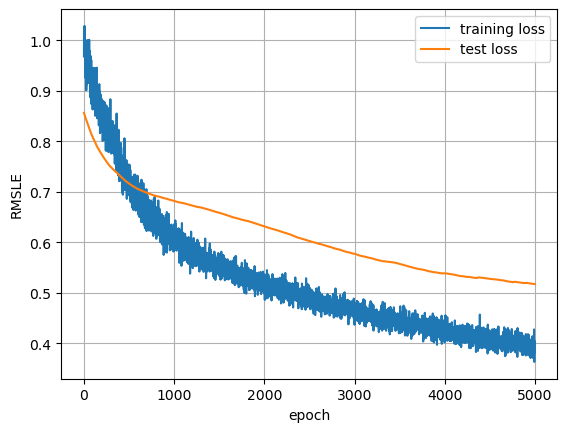


  0%|          | 0/139 [00:00<?, ?it/s]

2020-05-04
average explainable edge mask: tensor(0.0931)
number of edges in edge mask: 73
number of self edges: tensor(18)
number of inter edges: tensor(55)
date_range_start
2020-04-06     9
2020-04-13    13
2020-04-20     8
2020-04-27    10
2020-05-04     7
dtype: int64



  1%|          | 1/139 [00:02<05:34,  2.42s/it]

2020-05-11
average explainable edge mask: tensor(0.1034)
number of edges in edge mask: 105
number of self edges: tensor(29)
number of inter edges: tensor(76)
date_range_start
2020-04-13    14
2020-04-20    12
2020-04-27    24
2020-05-04    10
2020-05-11    19
dtype: int64



  1%|▏         | 2/139 [00:05<06:07,  2.68s/it]

2020-05-18
average explainable edge mask: tensor(0.0838)
number of edges in edge mask: 55
number of self edges: tensor(10)
number of inter edges: tensor(45)
date_range_start
2020-04-20    7
2020-04-27    8
2020-05-04    9
2020-05-11    8
2020-05-18    7
dtype: int64



  2%|▏         | 3/139 [00:07<05:38,  2.49s/it]

2020-05-25
average explainable edge mask: tensor(0.0841)
number of edges in edge mask: 58
number of self edges: tensor(7)
number of inter edges: tensor(51)
date_range_start
2020-04-27     6
2020-05-04     7
2020-05-11     9
2020-05-18     7
2020-05-25    10
dtype: int64



  3%|▎         | 4/139 [00:09<05:26,  2.42s/it]

2020-06-01
average explainable edge mask: tensor(0.0744)
number of edges in edge mask: 44
number of self edges: tensor(4)
number of inter edges: tensor(40)
date_range_start
2020-05-04     3
2020-05-11     3
2020-05-18     1
2020-05-25    12
2020-06-01     5
dtype: int64



  4%|▎         | 5/139 [00:11<05:08,  2.30s/it]

2020-06-08
average explainable edge mask: tensor(0.0649)
number of edges in edge mask: 13
number of self edges: tensor(2)
number of inter edges: tensor(11)
date_range_start
2020-05-11    1
2020-05-18    1
2020-05-25    2
2020-06-08    3
dtype: int64



  4%|▍         | 6/139 [00:13<04:36,  2.08s/it]

2020-06-15
average explainable edge mask: tensor(0.0637)
number of edges in edge mask: 17
number of self edges: tensor(0)
number of inter edges: tensor(17)
date_range_start
2020-06-01    2
2020-06-15    1
dtype: int64



  5%|▌         | 7/139 [00:15<04:16,  1.94s/it]

2020-06-22
average explainable edge mask: tensor(0.0661)
number of edges in edge mask: 25
number of self edges: tensor(4)
number of inter edges: tensor(21)
date_range_start
2020-05-25    1
2020-06-01    2
2020-06-08    2
2020-06-15    1
2020-06-22    1
dtype: int64



  6%|▌         | 8/139 [00:17<04:07,  1.89s/it]

2020-06-29
average explainable edge mask: tensor(0.0819)
number of edges in edge mask: 73
number of self edges: tensor(8)
number of inter edges: tensor(65)
date_range_start
2020-06-01     9
2020-06-08    12
2020-06-15     6
2020-06-22     6
2020-06-29     9
dtype: int64



  6%|▋         | 9/139 [00:19<04:26,  2.05s/it]

2020-07-06
average explainable edge mask: tensor(0.0825)
number of edges in edge mask: 74
number of self edges: tensor(11)
number of inter edges: tensor(63)
date_range_start
2020-06-08     3
2020-06-15    16
2020-06-22    13
2020-06-29     9
2020-07-06    10
dtype: int64



  7%|▋         | 10/139 [00:21<04:40,  2.17s/it]

2020-07-13
average explainable edge mask: tensor(0.0929)
number of edges in edge mask: 112
number of self edges: tensor(10)
number of inter edges: tensor(102)
date_range_start
2020-06-15    10
2020-06-22    21
2020-06-29    19
2020-07-06    11
2020-07-13    15
dtype: int64



  8%|▊         | 11/139 [00:24<05:12,  2.44s/it]

2020-07-20
average explainable edge mask: tensor(0.1007)
number of edges in edge mask: 141
number of self edges: tensor(17)
number of inter edges: tensor(124)
date_range_start
2020-06-22    18
2020-06-29    18
2020-07-06    26
2020-07-13    20
2020-07-20    21
dtype: int64



  9%|▊         | 12/139 [00:28<05:55,  2.80s/it]

2020-07-27
average explainable edge mask: tensor(0.0915)
number of edges in edge mask: 110
number of self edges: tensor(15)
number of inter edges: tensor(95)
date_range_start
2020-06-29    14
2020-07-06    11
2020-07-13     8
2020-07-20    23
2020-07-27    23
dtype: int64



  9%|▉         | 13/139 [00:31<06:03,  2.89s/it]

2020-08-03
average explainable edge mask: tensor(0.0762)
number of edges in edge mask: 51
number of self edges: tensor(1)
number of inter edges: tensor(50)
date_range_start
2020-07-06    2
2020-07-13    5
2020-07-20    8
2020-07-27    4
2020-08-03    2
dtype: int64



 10%|█         | 14/139 [00:33<05:28,  2.62s/it]

2020-08-10
average explainable edge mask: tensor(0.0814)
number of edges in edge mask: 80
number of self edges: tensor(8)
number of inter edges: tensor(72)
date_range_start
2020-07-13    15
2020-07-20     7
2020-07-27     9
2020-08-03     9
2020-08-10    16
dtype: int64



 11%|█         | 15/139 [00:36<05:31,  2.67s/it]

2020-08-17
average explainable edge mask: tensor(0.0798)
number of edges in edge mask: 76
number of self edges: tensor(7)
number of inter edges: tensor(69)
date_range_start
2020-07-20     9
2020-07-27    12
2020-08-03    11
2020-08-10     8
2020-08-17     7
dtype: int64



 12%|█▏        | 16/139 [00:39<05:24,  2.64s/it]

2020-08-24
average explainable edge mask: tensor(0.0718)
number of edges in edge mask: 54
number of self edges: tensor(6)
number of inter edges: tensor(48)
date_range_start
2020-07-27    5
2020-08-03    7
2020-08-10    6
2020-08-17    8
2020-08-24    3
dtype: int64



 12%|█▏        | 17/139 [00:41<05:02,  2.48s/it]

2020-08-31
average explainable edge mask: tensor(0.0713)
number of edges in edge mask: 59
number of self edges: tensor(3)
number of inter edges: tensor(56)
date_range_start
2020-08-03     7
2020-08-10    10
2020-08-17     3
2020-08-24     6
2020-08-31     5
dtype: int64



 13%|█▎        | 18/139 [00:43<04:50,  2.40s/it]

2020-09-07
average explainable edge mask: tensor(0.0701)
number of edges in edge mask: 50
number of self edges: tensor(1)
number of inter edges: tensor(49)
date_range_start
2020-08-10    1
2020-08-17    5
2020-08-24    7
2020-08-31    8
2020-09-07    2
dtype: int64



 14%|█▎        | 19/139 [00:46<05:07,  2.56s/it]

2020-09-14
average explainable edge mask: tensor(0.0642)
number of edges in edge mask: 28
number of self edges: tensor(1)
number of inter edges: tensor(27)
date_range_start
2020-08-17    1
2020-08-31    1
2020-09-07    2
2020-09-14    4
dtype: int64



 14%|█▍        | 20/139 [00:48<04:50,  2.44s/it]

2020-09-21
average explainable edge mask: tensor(0.0624)
number of edges in edge mask: 21
number of self edges: tensor(0)
number of inter edges: tensor(21)
date_range_start
2020-08-31    1
2020-09-07    1
2020-09-21    1
dtype: int64



 15%|█▌        | 21/139 [00:50<04:30,  2.30s/it]

2020-09-28
average explainable edge mask: tensor(0.0746)
number of edges in edge mask: 67
number of self edges: tensor(3)
number of inter edges: tensor(64)
date_range_start
2020-08-31    11
2020-09-07     7
2020-09-14     7
2020-09-21     4
2020-09-28     8
dtype: int64



 16%|█▌        | 22/139 [00:52<04:30,  2.31s/it]

2020-10-05
average explainable edge mask: tensor(0.1020)
number of edges in edge mask: 152
number of self edges: tensor(20)
number of inter edges: tensor(132)
date_range_start
2020-09-07    28
2020-09-14    18
2020-09-21    15
2020-09-28    19
2020-10-05    26
dtype: int64



 17%|█▋        | 23/139 [00:56<05:23,  2.79s/it]

2020-10-12
average explainable edge mask: tensor(0.1163)
number of edges in edge mask: 186
number of self edges: tensor(32)
number of inter edges: tensor(154)
date_range_start
2020-09-14    26
2020-09-21    31
2020-09-28    28
2020-10-05    30
2020-10-12    22
dtype: int64



 17%|█▋        | 24/139 [01:00<06:05,  3.18s/it]

2020-10-19
average explainable edge mask: tensor(0.0969)
number of edges in edge mask: 122
number of self edges: tensor(13)
number of inter edges: tensor(109)
date_range_start
2020-09-21    15
2020-09-28    19
2020-10-05    17
2020-10-12    11
2020-10-19    16
dtype: int64



 18%|█▊        | 25/139 [01:03<05:56,  3.13s/it]

2020-10-26
average explainable edge mask: tensor(0.1120)
number of edges in edge mask: 173
number of self edges: tensor(22)
number of inter edges: tensor(151)
date_range_start
2020-09-28    25
2020-10-05    23
2020-10-12    20
2020-10-19    28
2020-10-26    27
dtype: int64



 19%|█▊        | 26/139 [01:08<06:39,  3.54s/it]

2020-11-02
average explainable edge mask: tensor(0.1356)
number of edges in edge mask: 251
number of self edges: tensor(34)
number of inter edges: tensor(217)
date_range_start
2020-10-05    46
2020-10-12    45
2020-10-19    28
2020-10-26    33
2020-11-02    42
dtype: int64



 19%|█▉        | 27/139 [01:13<07:45,  4.16s/it]

2020-11-09
average explainable edge mask: tensor(0.1549)
number of edges in edge mask: 298
number of self edges: tensor(48)
number of inter edges: tensor(250)
date_range_start
2020-10-12    49
2020-10-19    38
2020-10-26    45
2020-11-02    51
2020-11-09    52
dtype: int64



 20%|██        | 28/139 [01:20<08:48,  4.76s/it]

2020-11-16
average explainable edge mask: tensor(0.1679)
number of edges in edge mask: 329
number of self edges: tensor(56)
number of inter edges: tensor(273)
date_range_start
2020-10-19    49
2020-10-26    50
2020-11-02    59
2020-11-09    55
2020-11-16    48
dtype: int64



 21%|██        | 29/139 [01:26<09:32,  5.21s/it]

2020-11-23
average explainable edge mask: tensor(0.1640)
number of edges in edge mask: 307
number of self edges: tensor(53)
number of inter edges: tensor(254)
date_range_start
2020-10-26    41
2020-11-02    45
2020-11-09    52
2020-11-16    54
2020-11-23    53
dtype: int64



 22%|██▏       | 30/139 [01:32<09:50,  5.42s/it]

2020-11-30
average explainable edge mask: tensor(0.1190)
number of edges in edge mask: 160
number of self edges: tensor(25)
number of inter edges: tensor(135)
date_range_start
2020-11-02    17
2020-11-09    26
2020-11-16    30
2020-11-23    23
2020-11-30    22
dtype: int64



 22%|██▏       | 31/139 [01:35<08:49,  4.91s/it]

2020-12-07
average explainable edge mask: tensor(0.1666)
number of edges in edge mask: 326
number of self edges: tensor(63)
number of inter edges: tensor(263)
date_range_start
2020-11-09    62
2020-11-16    45
2020-11-23    57
2020-11-30    43
2020-12-07    52
dtype: int64



 23%|██▎       | 32/139 [01:43<10:11,  5.71s/it]

2020-12-14
average explainable edge mask: tensor(0.1566)
number of edges in edge mask: 298
number of self edges: tensor(51)
number of inter edges: tensor(247)
date_range_start
2020-11-16    44
2020-11-23    52
2020-11-30    52
2020-12-07    46
2020-12-14    37
dtype: int64



 24%|██▎       | 33/139 [01:49<10:10,  5.76s/it]

2020-12-21
average explainable edge mask: tensor(0.1191)
number of edges in edge mask: 169
number of self edges: tensor(26)
number of inter edges: tensor(143)
date_range_start
2020-11-23    24
2020-11-30    32
2020-12-07    22
2020-12-14    25
2020-12-21    29
dtype: int64



 24%|██▍       | 34/139 [01:53<09:25,  5.38s/it]

2020-12-28
average explainable edge mask: tensor(0.1402)
number of edges in edge mask: 250
number of self edges: tensor(40)
number of inter edges: tensor(210)
date_range_start
2020-11-30    41
2020-12-07    29
2020-12-14    38
2020-12-21    37
2020-12-28    51
dtype: int64



 25%|██▌       | 35/139 [01:59<09:17,  5.37s/it]

2021-01-04
average explainable edge mask: tensor(0.1538)
number of edges in edge mask: 307
number of self edges: tensor(48)
number of inter edges: tensor(259)
date_range_start
2020-12-07    64
2020-12-14    58
2020-12-21    64
2020-12-28    54
dtype: int64



 26%|██▌       | 36/139 [02:05<09:34,  5.58s/it]

2021-01-11
average explainable edge mask: tensor(0.1431)
number of edges in edge mask: 253
number of self edges: tensor(36)
number of inter edges: tensor(217)
date_range_start
2020-12-14    19
2020-12-21    32
2020-12-28    27
2021-01-04    59
2021-01-11    65
dtype: int64



 27%|██▋       | 37/139 [02:10<09:24,  5.54s/it]

2021-01-18
average explainable edge mask: tensor(0.0852)
number of edges in edge mask: 46
number of self edges: tensor(4)
number of inter edges: tensor(42)
date_range_start
2020-12-21     2
2020-12-28     1
2021-01-04    11
2021-01-11     5
2021-01-18     7
dtype: int64



 27%|██▋       | 38/139 [02:12<07:37,  4.53s/it]

2021-01-25
average explainable edge mask: tensor(0.0766)
number of edges in edge mask: 20
number of self edges: tensor(1)
number of inter edges: tensor(19)
date_range_start
2020-12-28    1
2021-01-04    1
2021-01-11    1
2021-01-18    2
2021-01-25    1
dtype: int64



 28%|██▊       | 39/139 [02:14<06:14,  3.75s/it]

2021-02-01
average explainable edge mask: tensor(0.1114)
number of edges in edge mask: 178
number of self edges: tensor(20)
number of inter edges: tensor(158)
date_range_start
2021-01-04    28
2021-01-11    25
2021-01-18    26
2021-01-25    22
2021-02-01    33
dtype: int64



 29%|██▉       | 40/139 [02:19<06:29,  3.93s/it]

2021-02-08
average explainable edge mask: tensor(0.0722)
number of edges in edge mask: 47
number of self edges: tensor(6)
number of inter edges: tensor(41)
date_range_start
2021-01-11    2
2021-01-18    9
2021-01-25    6
2021-02-01    5
2021-02-08    5
dtype: int64



 29%|██▉       | 41/139 [02:21<05:34,  3.41s/it]

2021-02-15
average explainable edge mask: tensor(0.0942)
number of edges in edge mask: 112
number of self edges: tensor(22)
number of inter edges: tensor(90)
date_range_start
2021-01-18    18
2021-01-25    13
2021-02-01    14
2021-02-08    16
2021-02-15    19
dtype: int64



 30%|███       | 42/139 [02:24<05:20,  3.30s/it]

2021-02-22
average explainable edge mask: tensor(0.0666)
number of edges in edge mask: 15
number of self edges: tensor(1)
number of inter edges: tensor(14)
date_range_start
2021-02-01    2
2021-02-08    2
2021-02-15    1
2021-02-22    3
dtype: int64



 31%|███       | 43/139 [02:26<04:35,  2.87s/it]

2021-03-01
average explainable edge mask: tensor(0.0596)
number of edges in edge mask: 14
number of self edges: tensor(2)
number of inter edges: tensor(12)
date_range_start
2021-02-01    3
2021-02-22    1
2021-03-01    1
dtype: int64



 32%|███▏      | 44/139 [02:27<04:00,  2.53s/it]

2021-03-08
average explainable edge mask: tensor(0.0622)
number of edges in edge mask: 33
number of self edges: tensor(5)
number of inter edges: tensor(28)
date_range_start
2021-02-08    6
2021-02-15    5
2021-03-01    2
2021-03-08    2
dtype: int64



 32%|███▏      | 45/139 [02:30<03:51,  2.46s/it]

2021-03-15
average explainable edge mask: tensor(0.0833)
number of edges in edge mask: 78
number of self edges: tensor(10)
number of inter edges: tensor(68)
date_range_start
2021-02-15    15
2021-02-22    11
2021-03-01     9
2021-03-08     5
2021-03-15     9
dtype: int64



 33%|███▎      | 46/139 [02:32<03:49,  2.47s/it]

2021-03-22
average explainable edge mask: tensor(0.1247)
number of edges in edge mask: 202
number of self edges: tensor(35)
number of inter edges: tensor(167)
date_range_start
2021-02-22    28
2021-03-01    35
2021-03-08    29
2021-03-15    29
2021-03-22    38
dtype: int64



 34%|███▍      | 47/139 [02:37<04:43,  3.08s/it]

2021-03-29
average explainable edge mask: tensor(0.1462)
number of edges in edge mask: 268
number of self edges: tensor(40)
number of inter edges: tensor(228)
date_range_start
2021-03-01    39
2021-03-08    46
2021-03-15    38
2021-03-22    47
2021-03-29    46
dtype: int64



 35%|███▍      | 48/139 [02:42<05:50,  3.85s/it]

2021-04-05
average explainable edge mask: tensor(0.1009)
number of edges in edge mask: 129
number of self edges: tensor(15)
number of inter edges: tensor(114)
date_range_start
2021-03-08    16
2021-03-15    14
2021-03-22    17
2021-03-29    17
2021-04-05    27
dtype: int64



 35%|███▌      | 49/139 [02:46<05:32,  3.70s/it]

2021-04-12
average explainable edge mask: tensor(0.1010)
number of edges in edge mask: 133
number of self edges: tensor(15)
number of inter edges: tensor(118)
date_range_start
2021-03-15    17
2021-03-22    15
2021-03-29    17
2021-04-05    22
2021-04-12    13
dtype: int64



 36%|███▌      | 50/139 [02:49<05:16,  3.56s/it]

2021-04-19
average explainable edge mask: tensor(0.1016)
number of edges in edge mask: 154
number of self edges: tensor(26)
number of inter edges: tensor(128)
date_range_start
2021-03-22    24
2021-03-29    24
2021-04-05    21
2021-04-12    25
2021-04-19    21
dtype: int64



 37%|███▋      | 51/139 [02:53<05:15,  3.58s/it]

2021-04-26
average explainable edge mask: tensor(0.0778)
number of edges in edge mask: 66
number of self edges: tensor(7)
number of inter edges: tensor(59)
date_range_start
2021-03-29    6
2021-04-05    9
2021-04-12    5
2021-04-19    9
2021-04-26    5
dtype: int64



 37%|███▋      | 52/139 [02:55<04:42,  3.24s/it]

2021-05-03
average explainable edge mask: tensor(0.0998)
number of edges in edge mask: 159
number of self edges: tensor(20)
number of inter edges: tensor(139)
date_range_start
2021-04-05    18
2021-04-12    26
2021-04-19    16
2021-04-26    23
2021-05-03    28
dtype: int64



 38%|███▊      | 53/139 [02:59<04:51,  3.39s/it]

2021-05-10
average explainable edge mask: tensor(0.0796)
number of edges in edge mask: 73
number of self edges: tensor(6)
number of inter edges: tensor(67)
date_range_start
2021-04-12     2
2021-04-19    15
2021-04-26    10
2021-05-03    11
2021-05-10     7
dtype: int64



 39%|███▉      | 54/139 [03:01<04:29,  3.17s/it]

2021-05-17
average explainable edge mask: tensor(0.0625)
number of edges in edge mask: 12
number of self edges: tensor(0)
number of inter edges: tensor(12)
date_range_start
2021-04-19    1
2021-04-26    2
dtype: int64



 40%|███▉      | 55/139 [03:03<03:48,  2.72s/it]

2021-05-24
average explainable edge mask: tensor(0.0599)
number of edges in edge mask: 6
number of self edges: tensor(0)
number of inter edges: tensor(6)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 40%|████      | 56/139 [03:05<03:20,  2.42s/it]

2021-05-31
average explainable edge mask: tensor(0.0551)
number of edges in edge mask: 3
number of self edges: tensor(0)
number of inter edges: tensor(3)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 41%|████      | 57/139 [03:06<02:58,  2.18s/it]

2021-06-07
average explainable edge mask: tensor(0.0507)
number of edges in edge mask: 4
number of self edges: tensor(0)
number of inter edges: tensor(4)
date_range_start
2021-05-24    1
dtype: int64



 42%|████▏     | 58/139 [03:08<02:51,  2.12s/it]

2021-06-14
average explainable edge mask: tensor(0.0538)
number of edges in edge mask: 5
number of self edges: tensor(0)
number of inter edges: tensor(5)
date_range_start
2021-05-31    1
2021-06-14    1
dtype: int64



 42%|████▏     | 59/139 [03:10<02:41,  2.02s/it]

2021-06-21
average explainable edge mask: tensor(0.0592)
number of edges in edge mask: 11
number of self edges: tensor(0)
number of inter edges: tensor(11)
date_range_start
2021-05-24    1
2021-05-31    2
2021-06-21    2
dtype: int64



 43%|████▎     | 60/139 [03:12<02:40,  2.03s/it]

2021-06-28
average explainable edge mask: tensor(0.0568)
number of edges in edge mask: 8
number of self edges: tensor(0)
number of inter edges: tensor(8)
date_range_start
2021-06-07    1
2021-06-14    1
2021-06-21    1
2021-06-28    1
dtype: int64



 44%|████▍     | 61/139 [03:14<02:30,  1.93s/it]

2021-07-05
average explainable edge mask: tensor(0.0579)
number of edges in edge mask: 9
number of self edges: tensor(1)
number of inter edges: tensor(8)
date_range_start
2021-06-07    1
2021-07-05    1
dtype: int64



 45%|████▍     | 62/139 [03:16<02:22,  1.85s/it]

2021-07-12
average explainable edge mask: tensor(0.0756)
number of edges in edge mask: 69
number of self edges: tensor(6)
number of inter edges: tensor(63)
date_range_start
2021-06-14     7
2021-06-21    11
2021-06-28     9
2021-07-05     9
2021-07-12     7
dtype: int64



 45%|████▌     | 63/139 [03:18<02:37,  2.07s/it]

2021-07-19
average explainable edge mask: tensor(0.1028)
number of edges in edge mask: 171
number of self edges: tensor(11)
number of inter edges: tensor(160)
date_range_start
2021-06-21    19
2021-06-28    27
2021-07-05    31
2021-07-12    23
2021-07-19    24
dtype: int64



 46%|████▌     | 64/139 [03:22<03:22,  2.70s/it]

2021-07-26
average explainable edge mask: tensor(0.1390)
number of edges in edge mask: 299
number of self edges: tensor(46)
number of inter edges: tensor(253)
date_range_start
2021-06-28    42
2021-07-05    56
2021-07-12    55
2021-07-19    52
2021-07-26    39
dtype: int64



 47%|████▋     | 65/139 [03:30<05:12,  4.22s/it]

2021-08-02
average explainable edge mask: tensor(0.1607)
number of edges in edge mask: 380
number of self edges: tensor(49)
number of inter edges: tensor(331)
date_range_start
2021-07-05    56
2021-07-12    71
2021-07-19    67
2021-07-26    58
2021-08-02    63
dtype: int64



 47%|████▋     | 66/139 [03:38<06:27,  5.31s/it]

2021-08-09
average explainable edge mask: tensor(0.1709)
number of edges in edge mask: 420
number of self edges: tensor(53)
number of inter edges: tensor(367)
date_range_start
2021-07-12    73
2021-07-19    80
2021-07-26    59
2021-08-02    66
2021-08-09    77
dtype: int64



 48%|████▊     | 67/139 [03:47<07:31,  6.27s/it]

2021-08-16
average explainable edge mask: tensor(0.1650)
number of edges in edge mask: 403
number of self edges: tensor(50)
number of inter edges: tensor(353)
date_range_start
2021-07-19    56
2021-07-26    63
2021-08-02    59
2021-08-09    70
2021-08-16    87
dtype: int64



 49%|████▉     | 68/139 [03:55<08:03,  6.81s/it]

2021-08-23
average explainable edge mask: tensor(0.1574)
number of edges in edge mask: 380
number of self edges: tensor(44)
number of inter edges: tensor(336)
date_range_start
2021-07-26    65
2021-08-02    55
2021-08-09    64
2021-08-16    58
2021-08-23    69
dtype: int64



 50%|████▉     | 69/139 [04:03<08:35,  7.37s/it]

2021-08-30
average explainable edge mask: tensor(0.1662)
number of edges in edge mask: 412
number of self edges: tensor(57)
number of inter edges: tensor(355)
date_range_start
2021-08-02    65
2021-08-09    62
2021-08-16    77
2021-08-23    74
2021-08-30    64
dtype: int64



 50%|█████     | 70/139 [04:12<08:45,  7.62s/it]

2021-09-06
average explainable edge mask: tensor(0.1489)
number of edges in edge mask: 355
number of self edges: tensor(42)
number of inter edges: tensor(313)
date_range_start
2021-08-09    72
2021-08-16    63
2021-08-23    58
2021-08-30    46
2021-09-06    48
dtype: int64



 51%|█████     | 71/139 [04:19<08:35,  7.59s/it]

2021-09-13
average explainable edge mask: tensor(0.1575)
number of edges in edge mask: 383
number of self edges: tensor(52)
number of inter edges: tensor(331)
date_range_start
2021-08-16    78
2021-08-23    60
2021-08-30    63
2021-09-06    54
2021-09-13    58
dtype: int64



 52%|█████▏    | 72/139 [04:27<08:36,  7.70s/it]

2021-09-20
average explainable edge mask: tensor(0.1483)
number of edges in edge mask: 345
number of self edges: tensor(42)
number of inter edges: tensor(303)
date_range_start
2021-08-23    56
2021-08-30    66
2021-09-06    64
2021-09-13    52
2021-09-20    51
dtype: int64



 53%|█████▎    | 73/139 [04:34<08:21,  7.59s/it]

2021-09-27
average explainable edge mask: tensor(0.1209)
number of edges in edge mask: 230
number of self edges: tensor(29)
number of inter edges: tensor(201)
date_range_start
2021-08-30    33
2021-09-06    35
2021-09-13    46
2021-09-20    26
2021-09-27    34
dtype: int64



 53%|█████▎    | 74/139 [04:39<07:23,  6.82s/it]

2021-10-04
average explainable edge mask: tensor(0.1303)
number of edges in edge mask: 267
number of self edges: tensor(32)
number of inter edges: tensor(235)
date_range_start
2021-09-06    50
2021-09-13    41
2021-09-20    40
2021-09-27    41
2021-10-04    37
dtype: int64



 54%|█████▍    | 75/139 [04:45<06:56,  6.50s/it]

2021-10-11
average explainable edge mask: tensor(0.1144)
number of edges in edge mask: 226
number of self edges: tensor(25)
number of inter edges: tensor(201)
date_range_start
2021-09-13    32
2021-09-20    33
2021-09-27    40
2021-10-04    35
2021-10-11    33
dtype: int64



 55%|█████▍    | 76/139 [04:50<06:22,  6.07s/it]

2021-10-18
average explainable edge mask: tensor(0.0872)
number of edges in edge mask: 112
number of self edges: tensor(10)
number of inter edges: tensor(102)
date_range_start
2021-09-20    13
2021-09-27    12
2021-10-04     9
2021-10-11    21
2021-10-18    17
dtype: int64



 55%|█████▌    | 77/139 [04:53<05:24,  5.24s/it]

2021-10-25
average explainable edge mask: tensor(0.0780)
number of edges in edge mask: 84
number of self edges: tensor(15)
number of inter edges: tensor(69)
date_range_start
2021-09-27    15
2021-10-04     6
2021-10-11    15
2021-10-18     9
2021-10-25    10
dtype: int64



 56%|█████▌    | 78/139 [04:56<04:32,  4.46s/it]

2021-11-01
average explainable edge mask: tensor(0.0630)
number of edges in edge mask: 20
number of self edges: tensor(1)
number of inter edges: tensor(19)
date_range_start
2021-10-11    2
2021-10-18    2
2021-10-25    1
2021-11-01    2
dtype: int64



 57%|█████▋    | 79/139 [04:58<03:39,  3.66s/it]

2021-11-08
average explainable edge mask: tensor(0.0836)
number of edges in edge mask: 95
number of self edges: tensor(8)
number of inter edges: tensor(87)
date_range_start
2021-10-11     9
2021-10-18    21
2021-10-25    16
2021-11-01    10
2021-11-08     8
dtype: int64



 58%|█████▊    | 80/139 [05:01<03:30,  3.58s/it]

2021-11-15
average explainable edge mask: tensor(0.1350)
number of edges in edge mask: 265
number of self edges: tensor(35)
number of inter edges: tensor(230)
date_range_start
2021-10-18    34
2021-10-25    49
2021-11-01    38
2021-11-08    40
2021-11-15    50
dtype: int64



 58%|█████▊    | 81/139 [05:07<04:04,  4.22s/it]

2021-11-22
average explainable edge mask: tensor(0.1540)
number of edges in edge mask: 311
number of self edges: tensor(41)
number of inter edges: tensor(270)
date_range_start
2021-10-25    60
2021-11-01    49
2021-11-08    41
2021-11-15    44
2021-11-22    66
dtype: int64



 59%|█████▉    | 82/139 [05:14<04:43,  4.98s/it]

2021-11-29
average explainable edge mask: tensor(0.1274)
number of edges in edge mask: 220
number of self edges: tensor(27)
number of inter edges: tensor(193)
date_range_start
2021-11-01    30
2021-11-08    32
2021-11-15    43
2021-11-22    40
2021-11-29    25
dtype: int64



 60%|█████▉    | 83/139 [05:19<04:39,  5.00s/it]

2021-12-06
average explainable edge mask: tensor(0.1615)
number of edges in edge mask: 364
number of self edges: tensor(50)
number of inter edges: tensor(314)
date_range_start
2021-11-08    54
2021-11-15    62
2021-11-22    72
2021-11-29    53
2021-12-06    55
dtype: int64



 60%|██████    | 84/139 [05:26<05:12,  5.69s/it]

2021-12-13
average explainable edge mask: tensor(0.1551)
number of edges in edge mask: 331
number of self edges: tensor(47)
number of inter edges: tensor(284)
date_range_start
2021-11-15    49
2021-11-22    53
2021-11-29    48
2021-12-06    63
2021-12-13    59
dtype: int64



 61%|██████    | 85/139 [05:33<05:25,  6.02s/it]

2021-12-20
average explainable edge mask: tensor(0.1251)
number of edges in edge mask: 214
number of self edges: tensor(32)
number of inter edges: tensor(182)
date_range_start
2021-11-22    29
2021-11-29    42
2021-12-06    28
2021-12-13    39
2021-12-20    34
dtype: int64



 62%|██████▏   | 86/139 [05:39<05:15,  5.94s/it]

2021-12-27
average explainable edge mask: tensor(0.1697)
number of edges in edge mask: 377
number of self edges: tensor(60)
number of inter edges: tensor(317)
date_range_start
2021-11-29    51
2021-12-06    56
2021-12-13    85
2021-12-20    57
2021-12-27    68
dtype: int64



 63%|██████▎   | 87/139 [05:46<05:35,  6.46s/it]

2022-01-03
average explainable edge mask: tensor(0.1726)
number of edges in edge mask: 385
number of self edges: tensor(49)
number of inter edges: tensor(336)
date_range_start
2021-12-06    63
2021-12-13    75
2021-12-20    56
2021-12-27    82
2022-01-03    37
dtype: int64



 63%|██████▎   | 88/139 [05:54<05:48,  6.83s/it]

2022-01-10
average explainable edge mask: tensor(0.1567)
number of edges in edge mask: 334
number of self edges: tensor(54)
number of inter edges: tensor(280)
date_range_start
2021-12-13     33
2021-12-20     19
2021-12-27     35
2022-01-03    101
2022-01-10     75
dtype: int64



 64%|██████▍   | 89/139 [06:01<05:37,  6.76s/it]

2022-01-17
average explainable edge mask: tensor(0.0875)
number of edges in edge mask: 81
number of self edges: tensor(12)
number of inter edges: tensor(69)
date_range_start
2021-12-20     6
2021-12-27     3
2022-01-03    17
2022-01-10    18
2022-01-17    13
dtype: int64



 65%|██████▍   | 90/139 [06:03<04:31,  5.53s/it]

2022-01-24
average explainable edge mask: tensor(0.1298)
number of edges in edge mask: 244
number of self edges: tensor(45)
number of inter edges: tensor(199)
date_range_start
2021-12-27    14
2022-01-03    48
2022-01-10    51
2022-01-17    51
2022-01-24    44
dtype: int64



 65%|██████▌   | 91/139 [06:09<04:22,  5.47s/it]

2022-01-31
average explainable edge mask: tensor(0.1527)
number of edges in edge mask: 350
number of self edges: tensor(55)
number of inter edges: tensor(295)
date_range_start
2022-01-03    56
2022-01-10    57
2022-01-17    58
2022-01-24    48
2022-01-31    60
dtype: int64



 66%|██████▌   | 92/139 [06:15<04:34,  5.85s/it]

2022-02-07
average explainable edge mask: tensor(0.1238)
number of edges in edge mask: 237
number of self edges: tensor(37)
number of inter edges: tensor(200)
date_range_start
2022-01-10    43
2022-01-17    43
2022-01-24    34
2022-01-31    39
2022-02-07    32
dtype: int64



 67%|██████▋   | 93/139 [06:21<04:22,  5.71s/it]

2022-02-14
average explainable edge mask: tensor(0.1511)
number of edges in edge mask: 326
number of self edges: tensor(46)
number of inter edges: tensor(280)
date_range_start
2022-01-17    55
2022-01-24    47
2022-01-31    56
2022-02-07    46
2022-02-14    62
dtype: int64



 68%|██████▊   | 94/139 [06:27<04:29,  5.98s/it]

2022-02-21
average explainable edge mask: tensor(0.1017)
number of edges in edge mask: 39
number of self edges: tensor(2)
number of inter edges: tensor(37)
date_range_start
2022-01-24    2
2022-01-31    8
2022-02-07    2
2022-02-14    6
2022-02-21    5
dtype: int64



 68%|██████▊   | 95/139 [06:29<03:32,  4.82s/it]

2022-02-28
average explainable edge mask: tensor(0.0654)
number of edges in edge mask: 3
number of self edges: tensor(0)
number of inter edges: tensor(3)
date_range_start
2022-02-07    1
dtype: int64



 69%|██████▉   | 96/139 [06:31<02:46,  3.87s/it]

2022-03-07
average explainable edge mask: tensor(0.0519)
number of edges in edge mask: 2
number of self edges: tensor(0)
number of inter edges: tensor(2)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 70%|██████▉   | 97/139 [06:33<02:12,  3.16s/it]

2022-03-14
average explainable edge mask: tensor(0.0456)
number of edges in edge mask: 4
number of self edges: tensor(0)
number of inter edges: tensor(4)
date_range_start
2022-02-21    2
dtype: int64



 71%|███████   | 98/139 [06:34<01:50,  2.70s/it]

2022-03-21
average explainable edge mask: tensor(0.0525)
number of edges in edge mask: 5
number of self edges: tensor(0)
number of inter edges: tensor(5)
date_range_start
2022-02-21    1
2022-02-28    1
dtype: int64



 71%|███████   | 99/139 [06:36<01:35,  2.40s/it]

2022-03-28
average explainable edge mask: tensor(0.0565)
number of edges in edge mask: 11
number of self edges: tensor(1)
number of inter edges: tensor(10)
date_range_start
2022-03-07    3
2022-03-14    1
2022-03-21    2
dtype: int64



 72%|███████▏  | 100/139 [06:38<01:25,  2.19s/it]

2022-04-04
average explainable edge mask: tensor(0.0787)
number of edges in edge mask: 79
number of self edges: tensor(10)
number of inter edges: tensor(69)
date_range_start
2022-03-07     8
2022-03-14    15
2022-03-21    10
2022-03-28    11
2022-04-04    12
dtype: int64



 73%|███████▎  | 101/139 [06:40<01:29,  2.34s/it]

2022-04-11
average explainable edge mask: tensor(0.1098)
number of edges in edge mask: 181
number of self edges: tensor(28)
number of inter edges: tensor(153)
date_range_start
2022-03-14    27
2022-03-21    24
2022-03-28    27
2022-04-04    29
2022-04-11    34
dtype: int64



 73%|███████▎  | 102/139 [06:45<01:48,  2.93s/it]

2022-04-18
average explainable edge mask: tensor(0.1210)
number of edges in edge mask: 215
number of self edges: tensor(22)
number of inter edges: tensor(193)
date_range_start
2022-03-21    29
2022-03-28    30
2022-04-04    33
2022-04-11    45
2022-04-18    29
dtype: int64



 74%|███████▍  | 103/139 [06:50<02:09,  3.61s/it]

2022-04-25
average explainable edge mask: tensor(0.1264)
number of edges in edge mask: 246
number of self edges: tensor(25)
number of inter edges: tensor(221)
date_range_start
2022-03-28    33
2022-04-04    43
2022-04-11    43
2022-04-18    44
2022-04-25    28
dtype: int64



 75%|███████▍  | 104/139 [06:55<02:25,  4.15s/it]

2022-05-02
average explainable edge mask: tensor(0.1076)
number of edges in edge mask: 191
number of self edges: tensor(25)
number of inter edges: tensor(166)
date_range_start
2022-04-04    36
2022-04-11    33
2022-04-18    27
2022-04-25    27
2022-05-02    24
dtype: int64



 76%|███████▌  | 105/139 [07:00<02:23,  4.23s/it]

2022-05-09
average explainable edge mask: tensor(0.1491)
number of edges in edge mask: 330
number of self edges: tensor(47)
number of inter edges: tensor(283)
date_range_start
2022-04-11    69
2022-04-18    42
2022-04-25    56
2022-05-02    45
2022-05-09    58
dtype: int64



 76%|███████▋  | 106/139 [07:06<02:44,  4.98s/it]

2022-05-16
average explainable edge mask: tensor(0.1768)
number of edges in edge mask: 414
number of self edges: tensor(60)
number of inter edges: tensor(354)
date_range_start
2022-04-18    67
2022-04-25    68
2022-05-02    64
2022-05-09    64
2022-05-16    80
dtype: int64



 77%|███████▋  | 107/139 [07:15<03:09,  5.92s/it]

2022-05-23
average explainable edge mask: tensor(0.1423)
number of edges in edge mask: 264
number of self edges: tensor(43)
number of inter edges: tensor(221)
date_range_start
2022-04-25    37
2022-05-02    45
2022-05-09    40
2022-05-16    35
2022-05-23    48
dtype: int64



 78%|███████▊  | 108/139 [07:20<02:59,  5.79s/it]

2022-05-30
average explainable edge mask: tensor(0.0801)
number of edges in edge mask: 27
number of self edges: tensor(1)
number of inter edges: tensor(26)
date_range_start
2022-05-02    2
2022-05-09    2
2022-05-16    2
2022-05-23    6
2022-05-30    4
dtype: int64



 78%|███████▊  | 109/139 [07:22<02:19,  4.64s/it]

2022-06-06
average explainable edge mask: tensor(0.1427)
number of edges in edge mask: 327
number of self edges: tensor(41)
number of inter edges: tensor(286)
date_range_start
2022-05-09    52
2022-05-16    58
2022-05-23    59
2022-05-30    55
2022-06-06    47
dtype: int64



 79%|███████▉  | 110/139 [07:29<02:33,  5.30s/it]

2022-06-13
average explainable edge mask: tensor(0.1171)
number of edges in edge mask: 224
number of self edges: tensor(22)
number of inter edges: tensor(202)
date_range_start
2022-05-16    37
2022-05-23    27
2022-05-30    32
2022-06-06    41
2022-06-13    30
dtype: int64



 80%|███████▉  | 111/139 [07:34<02:26,  5.22s/it]

2022-06-20
average explainable edge mask: tensor(0.1053)
number of edges in edge mask: 193
number of self edges: tensor(25)
number of inter edges: tensor(168)
date_range_start
2022-05-23    26
2022-05-30    28
2022-06-06    31
2022-06-13    28
2022-06-20    40
dtype: int64



 81%|████████  | 112/139 [07:38<02:16,  5.04s/it]

2022-06-27
average explainable edge mask: tensor(0.0895)
number of edges in edge mask: 117
number of self edges: tensor(18)
number of inter edges: tensor(99)
date_range_start
2022-05-30    14
2022-06-06    14
2022-06-13    11
2022-06-20    14
2022-06-27    18
dtype: int64



 81%|████████▏ | 113/139 [07:41<01:53,  4.37s/it]

2022-07-04
average explainable edge mask: tensor(0.0697)
number of edges in edge mask: 17
number of self edges: tensor(0)
number of inter edges: tensor(17)
date_range_start
2022-06-13    2
2022-06-20    1
2022-06-27    3
2022-07-04    1
dtype: int64



 82%|████████▏ | 114/139 [07:43<01:31,  3.64s/it]

2022-07-11
average explainable edge mask: tensor(0.0976)
number of edges in edge mask: 139
number of self edges: tensor(20)
number of inter edges: tensor(119)
date_range_start
2022-06-13    24
2022-06-20    20
2022-06-27    19
2022-07-04    20
2022-07-11    22
dtype: int64



 83%|████████▎ | 115/139 [07:47<01:27,  3.65s/it]

2022-07-18
average explainable edge mask: tensor(0.1504)
number of edges in edge mask: 332
number of self edges: tensor(50)
number of inter edges: tensor(282)
date_range_start
2022-06-20    55
2022-06-27    45
2022-07-04    52
2022-07-11    63
2022-07-18    57
dtype: int64



 83%|████████▎ | 116/139 [07:54<01:44,  4.55s/it]

2022-07-25
average explainable edge mask: tensor(0.0930)
number of edges in edge mask: 121
number of self edges: tensor(10)
number of inter edges: tensor(111)
date_range_start
2022-06-27    15
2022-07-04    21
2022-07-11    21
2022-07-18     7
2022-07-25    14
dtype: int64



 84%|████████▍ | 117/139 [07:57<01:31,  4.14s/it]

2022-08-01
average explainable edge mask: tensor(0.1010)
number of edges in edge mask: 140
number of self edges: tensor(14)
number of inter edges: tensor(126)
date_range_start
2022-07-04    27
2022-07-11    13
2022-07-18    17
2022-07-25    10
2022-08-01    31
dtype: int64



 85%|████████▍ | 118/139 [08:00<01:24,  4.01s/it]

2022-08-08
average explainable edge mask: tensor(0.1004)
number of edges in edge mask: 159
number of self edges: tensor(16)
number of inter edges: tensor(143)
date_range_start
2022-07-11    19
2022-07-18    30
2022-07-25    26
2022-08-01    16
2022-08-08    29
dtype: int64



 86%|████████▌ | 119/139 [08:05<01:20,  4.05s/it]

2022-08-15
average explainable edge mask: tensor(0.1029)
number of edges in edge mask: 176
number of self edges: tensor(14)
number of inter edges: tensor(162)
date_range_start
2022-07-18    30
2022-07-25    20
2022-08-01    22
2022-08-08    25
2022-08-15    28
dtype: int64



 86%|████████▋ | 120/139 [08:09<01:17,  4.09s/it]

2022-08-22
average explainable edge mask: tensor(0.0981)
number of edges in edge mask: 167
number of self edges: tensor(14)
number of inter edges: tensor(153)
date_range_start
2022-07-25    22
2022-08-01    18
2022-08-08    29
2022-08-15    27
2022-08-22    24
dtype: int64



 87%|████████▋ | 121/139 [08:13<01:16,  4.25s/it]

2022-08-29
average explainable edge mask: tensor(0.0754)
number of edges in edge mask: 67
number of self edges: tensor(6)
number of inter edges: tensor(61)
date_range_start
2022-08-01     9
2022-08-08    11
2022-08-15     4
2022-08-22     6
2022-08-29     8
dtype: int64



 88%|████████▊ | 122/139 [08:17<01:07,  3.94s/it]

2022-09-05
average explainable edge mask: tensor(0.0640)
number of edges in edge mask: 33
number of self edges: tensor(2)
number of inter edges: tensor(31)
date_range_start
2022-08-08    3
2022-08-15    1
2022-08-22    1
2022-08-29    2
2022-09-05    1
dtype: int64



 88%|████████▊ | 123/139 [08:19<00:53,  3.34s/it]

2022-09-12
average explainable edge mask: tensor(0.0636)
number of edges in edge mask: 36
number of self edges: tensor(1)
number of inter edges: tensor(35)
date_range_start
2022-08-29    3
2022-09-05    2
2022-09-12    6
dtype: int64



 89%|████████▉ | 124/139 [08:20<00:43,  2.89s/it]

2022-09-19
average explainable edge mask: tensor(0.0715)
number of edges in edge mask: 62
number of self edges: tensor(2)
number of inter edges: tensor(60)
date_range_start
2022-08-22    12
2022-08-29     4
2022-09-05     5
2022-09-12     6
2022-09-19     8
dtype: int64



 90%|████████▉ | 125/139 [08:23<00:38,  2.78s/it]

2022-09-26
average explainable edge mask: tensor(0.0613)
number of edges in edge mask: 25
number of self edges: tensor(3)
number of inter edges: tensor(22)
date_range_start
2022-08-29    1
2022-09-05    2
2022-09-12    3
2022-09-19    4
2022-09-26    4
dtype: int64



 91%|█████████ | 126/139 [08:25<00:32,  2.51s/it]

2022-10-03
average explainable edge mask: tensor(0.0555)
number of edges in edge mask: 15
number of self edges: tensor(0)
number of inter edges: tensor(15)
date_range_start
2022-09-19    1
dtype: int64



 91%|█████████▏| 127/139 [08:26<00:27,  2.28s/it]

2022-10-10
average explainable edge mask: tensor(0.0643)
number of edges in edge mask: 32
number of self edges: tensor(4)
number of inter edges: tensor(28)
date_range_start
2022-09-12    3
2022-09-19    3
2022-10-03    2
2022-10-10    3
dtype: int64



 92%|█████████▏| 128/139 [08:29<00:24,  2.21s/it]

2022-10-17
average explainable edge mask: tensor(0.0633)
number of edges in edge mask: 23
number of self edges: tensor(0)
number of inter edges: tensor(23)
date_range_start
2022-09-19    1
2022-09-26    1
2022-10-10    2
2022-10-17    3
dtype: int64



 93%|█████████▎| 129/139 [08:30<00:20,  2.10s/it]

2022-10-24
average explainable edge mask: tensor(0.0656)
number of edges in edge mask: 40
number of self edges: tensor(2)
number of inter edges: tensor(38)
date_range_start
2022-09-26    3
2022-10-03    5
2022-10-10    4
2022-10-17    5
2022-10-24    3
dtype: int64



 94%|█████████▎| 130/139 [08:32<00:18,  2.06s/it]

2022-10-31
average explainable edge mask: tensor(0.0692)
number of edges in edge mask: 46
number of self edges: tensor(3)
number of inter edges: tensor(43)
date_range_start
2022-10-03    5
2022-10-10    3
2022-10-17    3
2022-10-24    9
dtype: int64



 94%|█████████▍| 131/139 [08:34<00:16,  2.03s/it]

2022-11-07
average explainable edge mask: tensor(0.0626)
number of edges in edge mask: 23
number of self edges: tensor(0)
number of inter edges: tensor(23)
date_range_start
2022-10-10    2
2022-10-24    2
2022-11-07    1
dtype: int64



 95%|█████████▍| 132/139 [08:36<00:13,  1.94s/it]

2022-11-14
average explainable edge mask: tensor(0.0604)
number of edges in edge mask: 16
number of self edges: tensor(1)
number of inter edges: tensor(15)
date_range_start
2022-10-17    2
2022-10-31    1
dtype: int64



 96%|█████████▌| 133/139 [08:38<00:11,  1.88s/it]

2022-11-21
average explainable edge mask: tensor(0.0652)
number of edges in edge mask: 25
number of self edges: tensor(3)
number of inter edges: tensor(22)
date_range_start
2022-10-24    4
2022-11-07    2
2022-11-14    2
2022-11-21    2
dtype: int64



 96%|█████████▋| 134/139 [08:39<00:09,  1.83s/it]

2022-11-28
average explainable edge mask: tensor(0.0826)
number of edges in edge mask: 84
number of self edges: tensor(11)
number of inter edges: tensor(73)
date_range_start
2022-10-31    12
2022-11-07    15
2022-11-14    10
2022-11-21     7
2022-11-28    10
dtype: int64



 97%|█████████▋| 135/139 [08:42<00:08,  2.05s/it]

2022-12-05
average explainable edge mask: tensor(0.1254)
number of edges in edge mask: 237
number of self edges: tensor(24)
number of inter edges: tensor(213)
date_range_start
2022-11-07    33
2022-11-14    31
2022-11-21    42
2022-11-28    37
2022-12-05    40
dtype: int64



 98%|█████████▊| 136/139 [08:47<00:08,  2.99s/it]

2022-12-12
average explainable edge mask: tensor(0.0903)
number of edges in edge mask: 108
number of self edges: tensor(12)
number of inter edges: tensor(96)
date_range_start
2022-11-14    17
2022-11-21    16
2022-11-28    11
2022-12-05     9
2022-12-12    17
dtype: int64



 99%|█████████▊| 137/139 [08:50<00:05,  2.95s/it]

2022-12-19
average explainable edge mask: tensor(0.0882)
number of edges in edge mask: 93
number of self edges: tensor(9)
number of inter edges: tensor(84)
date_range_start
2022-11-21    18
2022-11-28    11
2022-12-05    11
2022-12-12    12
2022-12-19    11
dtype: int64



 99%|█████████▉| 138/139 [08:53<00:02,  2.90s/it]

2022-12-26
average explainable edge mask: tensor(0.0780)
number of edges in edge mask: 68
number of self edges: tensor(8)
number of inter edges: tensor(60)
date_range_start
2022-11-28    12
2022-12-05    12
2022-12-12     7
2022-12-19    10
2022-12-26     7
dtype: int64



100%|██████████| 139/139 [08:55<00:00,  3.86s/it]


unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


 30%|███       | 3/10 [40:38<1:38:59, 848.48s/it]

============= HHS REGION: 4 ============= 
processing data on device: cuda
unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350
unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
imputing using columns ['retail_and_recreation_percent_change_from_baseline', 'grocery_and_pharmacy_percent_change_from_baseline', 'transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline', 'residential_percent_change_from_baseline']
Percent of variation explained with first component: 76.10792683627832 %
[0.76107927 0.10546504 0.09323786 0.03661961 0.00359822]
Reading population data from https://www2.census.gov/programs-surveys/popest/datasets/2020-2023/counties/totals/co-est2023-alldata.csv
creating coo_df
Creating


Spatial Edges: 100%|██████████| 248044/248044 [00:10<00:00, 24254.15it/s]


248044 spatial edges
Creating temporal edges...
30282 temporal edges
processing safegraph data
Processing edge weights...



100%|██████████| 278326/278326 [00:00<00:00, 1439277.83it/s]


Processed data saved to ../data/processed/gcn-usa-2020-22-hhs-4/



100%|██████████| 5000/5000 [00:35<00:00, 141.07it/s]


final test loss: 0.4854165315628052
train loss tensor(0.3043, device='cuda:0', grad_fn=<SqrtBackward0>)
test loss tensor(0.4854, device='cuda:0', grad_fn=<SqrtBackward0>)
train corr tensor(0.9937, device='cuda:0', grad_fn=<SelectBackward0>)
test corr tensor(0.9875, device='cuda:0', grad_fn=<SelectBackward0>)


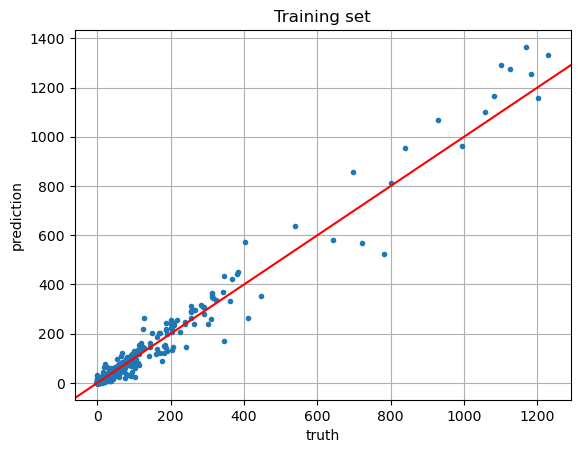

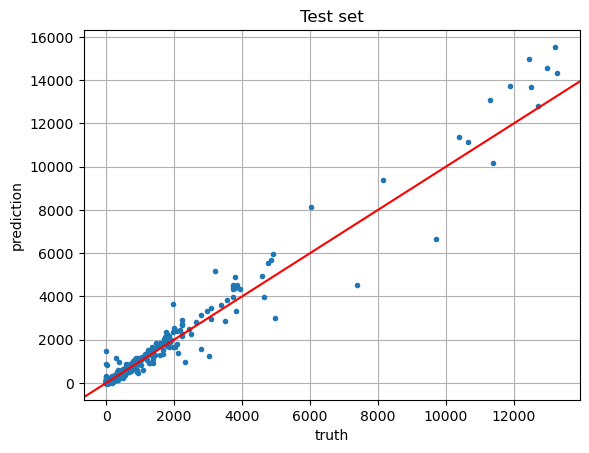

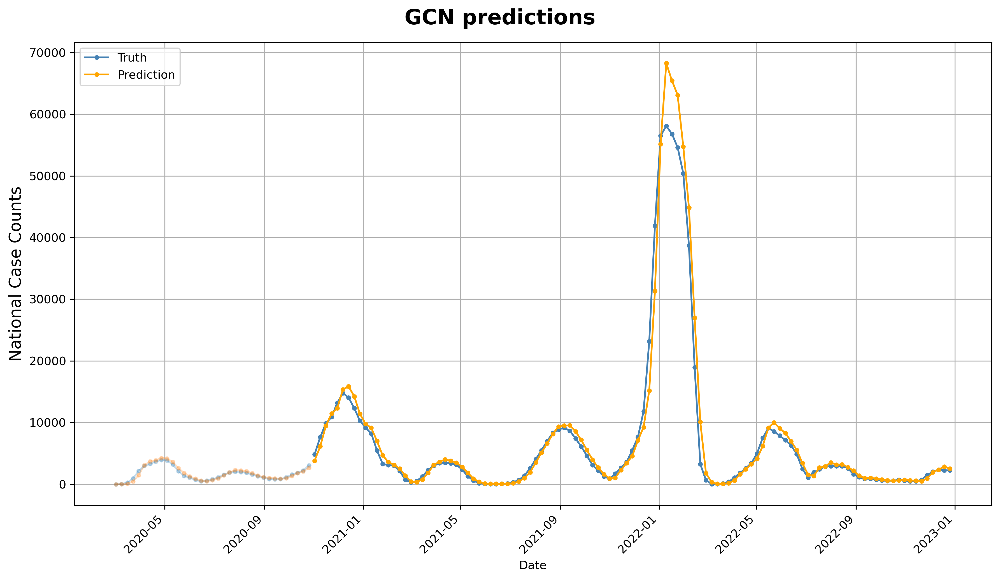

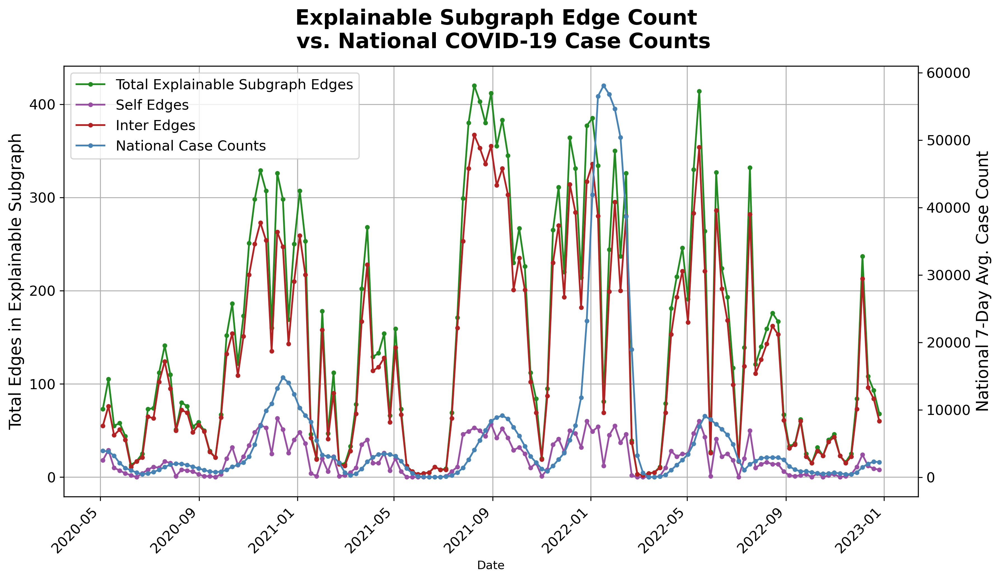

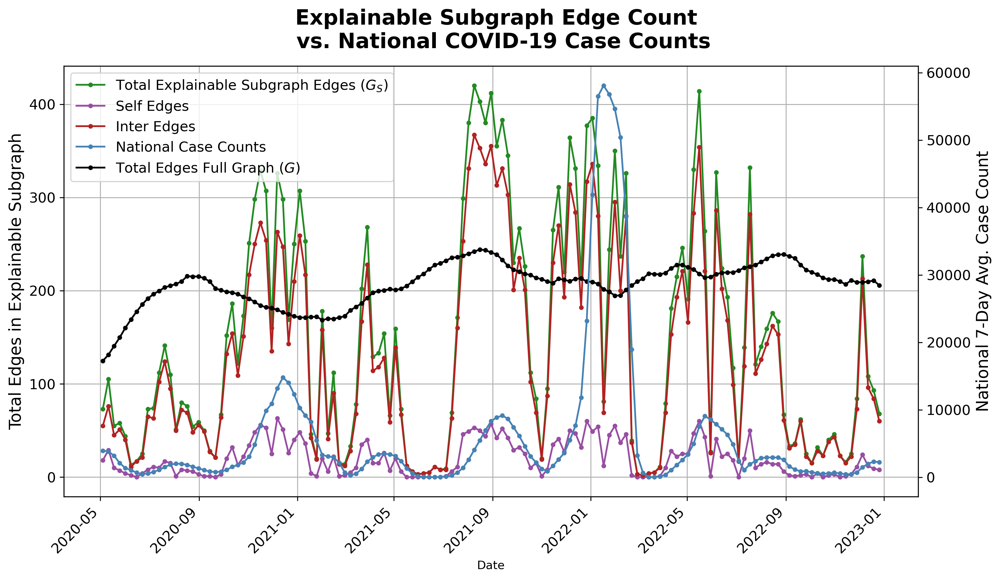

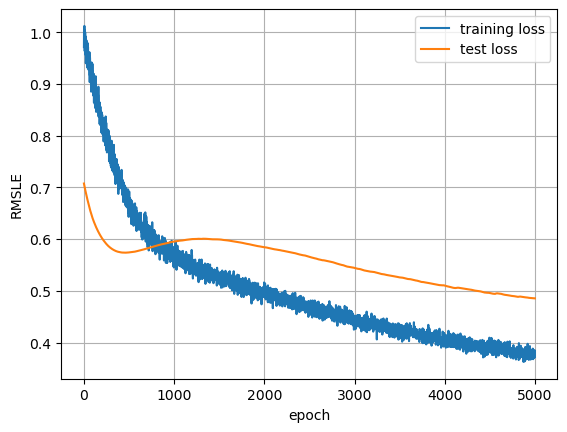


  0%|          | 0/139 [00:00<?, ?it/s]

2020-05-04
average explainable edge mask: tensor(0.0861)
number of edges in edge mask: 158
number of self edges: tensor(16)
number of inter edges: tensor(142)
date_range_start
2020-04-06    11
2020-04-13    16
2020-04-20    15
2020-04-27    11
2020-05-04    21
dtype: int64



  1%|          | 1/139 [00:06<13:48,  6.00s/it]

2020-05-11
average explainable edge mask: tensor(0.0784)
number of edges in edge mask: 103
number of self edges: tensor(5)
number of inter edges: tensor(98)
date_range_start
2020-04-13    7
2020-04-20    6
2020-04-27    7
2020-05-04    5
2020-05-11    7
dtype: int64



  1%|▏         | 2/139 [00:09<10:13,  4.48s/it]

2020-05-18
average explainable edge mask: tensor(0.0746)
number of edges in edge mask: 75
number of self edges: tensor(5)
number of inter edges: tensor(70)
date_range_start
2020-04-20    5
2020-04-27    2
2020-05-04    4
2020-05-11    3
2020-05-18    5
dtype: int64



  2%|▏         | 3/139 [00:12<08:26,  3.73s/it]

2020-05-25
average explainable edge mask: tensor(0.0812)
number of edges in edge mask: 151
number of self edges: tensor(14)
number of inter edges: tensor(137)
date_range_start
2020-04-27    10
2020-05-04    13
2020-05-11    14
2020-05-18    13
2020-05-25    18
dtype: int64



  3%|▎         | 4/139 [00:15<08:23,  3.73s/it]

2020-06-01
average explainable edge mask: tensor(0.0774)
number of edges in edge mask: 139
number of self edges: tensor(15)
number of inter edges: tensor(124)
date_range_start
2020-05-04    13
2020-05-11    15
2020-05-18    12
2020-05-25    14
2020-06-01    16
dtype: int64



  4%|▎         | 5/139 [00:19<08:18,  3.72s/it]

2020-06-08
average explainable edge mask: tensor(0.0850)
number of edges in edge mask: 244
number of self edges: tensor(15)
number of inter edges: tensor(229)
date_range_start
2020-05-11    31
2020-05-18    29
2020-05-25    30
2020-06-01    36
2020-06-08    39
dtype: int64



  4%|▍         | 6/139 [00:25<10:04,  4.55s/it]

2020-06-15
average explainable edge mask: tensor(0.0995)
number of edges in edge mask: 453
number of self edges: tensor(61)
number of inter edges: tensor(392)
date_range_start
2020-05-18    60
2020-05-25    68
2020-06-01    65
2020-06-08    72
2020-06-15    79
dtype: int64



  5%|▌         | 7/139 [00:35<13:48,  6.28s/it]

2020-06-22
average explainable edge mask: tensor(0.1200)
number of edges in edge mask: 720
number of self edges: tensor(62)
number of inter edges: tensor(658)
date_range_start
2020-05-25     94
2020-06-01    122
2020-06-08    121
2020-06-15    121
2020-06-22    133
dtype: int64



  6%|▌         | 8/139 [00:50<19:24,  8.89s/it]

2020-06-29
average explainable edge mask: tensor(0.1395)
number of edges in edge mask: 1003
number of self edges: tensor(107)
number of inter edges: tensor(896)
date_range_start
2020-06-01    152
2020-06-08    169
2020-06-15    173
2020-06-22    167
2020-06-29    195
dtype: int64



  6%|▋         | 9/139 [01:10<26:54, 12.42s/it]

2020-07-06
average explainable edge mask: tensor(0.1296)
number of edges in edge mask: 918
number of self edges: tensor(86)
number of inter edges: tensor(832)
date_range_start
2020-06-08    145
2020-06-15    147
2020-06-22    153
2020-06-29    165
2020-07-06    161
dtype: int64



  7%|▋         | 10/139 [01:30<31:35, 14.69s/it]

2020-07-13
average explainable edge mask: tensor(0.1263)
number of edges in edge mask: 898
number of self edges: tensor(83)
number of inter edges: tensor(815)
date_range_start
2020-06-15    137
2020-06-22    167
2020-06-29    139
2020-07-06    145
2020-07-13    155
dtype: int64



  8%|▊         | 11/139 [01:47<33:16, 15.59s/it]

2020-07-20
average explainable edge mask: tensor(0.1222)
number of edges in edge mask: 869
number of self edges: tensor(82)
number of inter edges: tensor(787)
date_range_start
2020-06-22    136
2020-06-29    124
2020-07-06    147
2020-07-13    143
2020-07-20    162
dtype: int64



  9%|▊         | 12/139 [02:05<34:09, 16.14s/it]

2020-07-27
average explainable edge mask: tensor(0.1050)
number of edges in edge mask: 628
number of self edges: tensor(56)
number of inter edges: tensor(572)
date_range_start
2020-06-29     91
2020-07-06    108
2020-07-13     97
2020-07-20     92
2020-07-27    101
dtype: int64



  9%|▉         | 13/139 [02:17<31:40, 15.08s/it]

2020-08-03
average explainable edge mask: tensor(0.1036)
number of edges in edge mask: 642
number of self edges: tensor(54)
number of inter edges: tensor(588)
date_range_start
2020-07-06    105
2020-07-13     99
2020-07-20    124
2020-07-27    100
2020-08-03     84
dtype: int64



 10%|█         | 14/139 [02:31<30:27, 14.62s/it]

2020-08-10
average explainable edge mask: tensor(0.1005)
number of edges in edge mask: 617
number of self edges: tensor(57)
number of inter edges: tensor(560)
date_range_start
2020-07-13     97
2020-07-20     99
2020-07-27    102
2020-08-03     84
2020-08-10     97
dtype: int64



 11%|█         | 15/139 [02:44<29:14, 14.15s/it]

2020-08-17
average explainable edge mask: tensor(0.0919)
number of edges in edge mask: 495
number of self edges: tensor(43)
number of inter edges: tensor(452)
date_range_start
2020-07-20    61
2020-07-27    80
2020-08-03    67
2020-08-10    65
2020-08-17    67
dtype: int64



 12%|█▏        | 16/139 [02:54<26:28, 12.91s/it]

2020-08-24
average explainable edge mask: tensor(0.0756)
number of edges in edge mask: 265
number of self edges: tensor(22)
number of inter edges: tensor(243)
date_range_start
2020-07-27    31
2020-08-03    26
2020-08-10    26
2020-08-17    25
2020-08-24    24
dtype: int64



 12%|█▏        | 17/139 [02:59<21:37, 10.63s/it]

2020-08-31
average explainable edge mask: tensor(0.0679)
number of edges in edge mask: 148
number of self edges: tensor(9)
number of inter edges: tensor(139)
date_range_start
2020-08-03     9
2020-08-10    14
2020-08-17    11
2020-08-24     8
2020-08-31    12
dtype: int64



 13%|█▎        | 18/139 [03:03<17:29,  8.67s/it]

2020-09-07
average explainable edge mask: tensor(0.0624)
number of edges in edge mask: 66
number of self edges: tensor(2)
number of inter edges: tensor(64)
date_range_start
2020-08-10    3
2020-08-17    2
2020-08-24    3
2020-08-31    6
2020-09-07    3
dtype: int64



 14%|█▎        | 19/139 [03:06<13:53,  6.95s/it]

2020-09-14
average explainable edge mask: tensor(0.0642)
number of edges in edge mask: 92
number of self edges: tensor(1)
number of inter edges: tensor(91)
date_range_start
2020-08-17    6
2020-08-24    7
2020-08-31    2
2020-09-07    6
2020-09-14    6
dtype: int64



 14%|█▍        | 20/139 [03:09<11:27,  5.78s/it]

2020-09-21
average explainable edge mask: tensor(0.0704)
number of edges in edge mask: 146
number of self edges: tensor(7)
number of inter edges: tensor(139)
date_range_start
2020-08-24     7
2020-08-31    11
2020-09-07    12
2020-09-14    10
2020-09-21     9
dtype: int64



 15%|█▌        | 21/139 [03:13<10:15,  5.21s/it]

2020-09-28
average explainable edge mask: tensor(0.0654)
number of edges in edge mask: 102
number of self edges: tensor(7)
number of inter edges: tensor(95)
date_range_start
2020-08-31    8
2020-09-07    7
2020-09-14    7
2020-09-21    5
2020-09-28    3
dtype: int64



 16%|█▌        | 22/139 [03:16<08:52,  4.55s/it]

2020-10-05
average explainable edge mask: tensor(0.0779)
number of edges in edge mask: 200
number of self edges: tensor(13)
number of inter edges: tensor(187)
date_range_start
2020-09-07    21
2020-09-14    26
2020-09-21    10
2020-09-28    22
2020-10-05    25
dtype: int64



 17%|█▋        | 23/139 [03:21<08:52,  4.59s/it]

2020-10-12
average explainable edge mask: tensor(0.1009)
number of edges in edge mask: 462
number of self edges: tensor(40)
number of inter edges: tensor(422)
date_range_start
2020-09-14    70
2020-09-21    67
2020-09-28    70
2020-10-05    59
2020-10-12    59
dtype: int64



 17%|█▋        | 24/139 [03:31<11:51,  6.19s/it]

2020-10-19
average explainable edge mask: tensor(0.0919)
number of edges in edge mask: 380
number of self edges: tensor(36)
number of inter edges: tensor(344)
date_range_start
2020-09-21    45
2020-09-28    46
2020-10-05    59
2020-10-12    55
2020-10-19    45
dtype: int64



 18%|█▊        | 25/139 [03:39<12:41,  6.68s/it]

2020-10-26
average explainable edge mask: tensor(0.0876)
number of edges in edge mask: 357
number of self edges: tensor(40)
number of inter edges: tensor(317)
date_range_start
2020-09-28    52
2020-10-05    48
2020-10-12    48
2020-10-19    53
2020-10-26    34
dtype: int64



 19%|█▊        | 26/139 [03:46<12:54,  6.86s/it]

2020-11-02
average explainable edge mask: tensor(0.0950)
number of edges in edge mask: 469
number of self edges: tensor(57)
number of inter edges: tensor(412)
date_range_start
2020-10-05    64
2020-10-12    76
2020-10-19    72
2020-10-26    74
2020-11-02    63
dtype: int64



 19%|█▉        | 27/139 [03:56<14:18,  7.67s/it]

2020-11-09
average explainable edge mask: tensor(0.1161)
number of edges in edge mask: 667
number of self edges: tensor(68)
number of inter edges: tensor(599)
date_range_start
2020-10-12    116
2020-10-19    112
2020-10-26     92
2020-11-02     85
2020-11-09    104
dtype: int64



 20%|██        | 28/139 [04:09<17:12,  9.30s/it]

2020-11-16
average explainable edge mask: tensor(0.1493)
number of edges in edge mask: 1012
number of self edges: tensor(121)
number of inter edges: tensor(891)
date_range_start
2020-10-19    183
2020-10-26    153
2020-11-02    174
2020-11-09    169
2020-11-16    148
dtype: int64



 21%|██        | 29/139 [04:28<22:51, 12.46s/it]

2020-11-23
average explainable edge mask: tensor(0.1427)
number of edges in edge mask: 931
number of self edges: tensor(98)
number of inter edges: tensor(833)
date_range_start
2020-10-26    122
2020-11-02    153
2020-11-09    171
2020-11-16    145
2020-11-23    169
dtype: int64



 22%|██▏       | 30/139 [04:47<25:54, 14.27s/it]

2020-11-30
average explainable edge mask: tensor(0.1283)
number of edges in edge mask: 774
number of self edges: tensor(90)
number of inter edges: tensor(684)
date_range_start
2020-11-02    125
2020-11-09    116
2020-11-16    102
2020-11-23    150
2020-11-30    122
dtype: int64



 22%|██▏       | 31/139 [05:01<25:48, 14.34s/it]

2020-12-07
average explainable edge mask: tensor(0.1690)
number of edges in edge mask: 1284
number of self edges: tensor(162)
number of inter edges: tensor(1122)
date_range_start
2020-11-09    208
2020-11-16    181
2020-11-23    256
2020-11-30    228
2020-12-07    216
dtype: int64



 23%|██▎       | 32/139 [05:26<30:53, 17.33s/it]

2020-12-14
average explainable edge mask: tensor(0.1609)
number of edges in edge mask: 1207
number of self edges: tensor(144)
number of inter edges: tensor(1063)
date_range_start
2020-11-16    195
2020-11-23    215
2020-11-30    205
2020-12-07    184
2020-12-14    212
dtype: int64



 24%|██▎       | 33/139 [05:50<34:09, 19.33s/it]

2020-12-21
average explainable edge mask: tensor(0.1215)
number of edges in edge mask: 767
number of self edges: tensor(74)
number of inter edges: tensor(693)
date_range_start
2020-11-23    134
2020-11-30     88
2020-12-07    131
2020-12-14    132
2020-12-21    130
dtype: int64



 24%|██▍       | 34/139 [06:05<31:53, 18.23s/it]

2020-12-28
average explainable edge mask: tensor(0.1350)
number of edges in edge mask: 906
number of self edges: tensor(104)
number of inter edges: tensor(802)
date_range_start
2020-11-30    126
2020-12-07    138
2020-12-14    157
2020-12-21    160
2020-12-28    167
dtype: int64



 25%|██▌       | 35/139 [06:23<31:10, 17.99s/it]

2021-01-04
average explainable edge mask: tensor(0.1588)
number of edges in edge mask: 1182
number of self edges: tensor(161)
number of inter edges: tensor(1021)
date_range_start
2020-12-07    157
2020-12-14    161
2020-12-21    189
2020-12-28    205
2021-01-04    271
dtype: int64



 26%|██▌       | 36/139 [06:44<32:38, 19.01s/it]

2021-01-11
average explainable edge mask: tensor(0.1525)
number of edges in edge mask: 1157
number of self edges: tensor(144)
number of inter edges: tensor(1013)
date_range_start
2020-12-14     76
2020-12-21     86
2020-12-28     93
2021-01-04    358
2021-01-11    347
dtype: int64



 27%|██▋       | 37/139 [07:06<33:28, 19.69s/it]

2021-01-18
average explainable edge mask: tensor(0.1107)
number of edges in edge mask: 651
number of self edges: tensor(72)
number of inter edges: tensor(579)
date_range_start
2020-12-21     32
2020-12-28     36
2021-01-04    140
2021-01-11    153
2021-01-18    152
dtype: int64



 27%|██▋       | 38/139 [07:18<29:40, 17.63s/it]

2021-01-25
average explainable edge mask: tensor(0.0907)
number of edges in edge mask: 383
number of self edges: tensor(36)
number of inter edges: tensor(347)
date_range_start
2020-12-28    14
2021-01-04    58
2021-01-11    66
2021-01-18    56
2021-01-25    70
dtype: int64



 28%|██▊       | 39/139 [07:26<24:21, 14.62s/it]

2021-02-01
average explainable edge mask: tensor(0.1101)
number of edges in edge mask: 596
number of self edges: tensor(47)
number of inter edges: tensor(549)
date_range_start
2021-01-04     75
2021-01-11     92
2021-01-18     84
2021-01-25    100
2021-02-01     96
dtype: int64



 29%|██▉       | 40/139 [07:38<22:52, 13.86s/it]

2021-02-08
average explainable edge mask: tensor(0.1330)
number of edges in edge mask: 857
number of self edges: tensor(112)
number of inter edges: tensor(745)
date_range_start
2021-01-11    143
2021-01-18    125
2021-01-25    154
2021-02-01    138
2021-02-08    141
dtype: int64



 29%|██▉       | 41/139 [07:57<25:18, 15.50s/it]

2021-02-15
average explainable edge mask: tensor(0.0992)
number of edges in edge mask: 497
number of self edges: tensor(44)
number of inter edges: tensor(453)
date_range_start
2021-01-18    69
2021-01-25    75
2021-02-01    74
2021-02-08    69
2021-02-15    81
dtype: int64



 30%|███       | 42/139 [08:10<23:46, 14.71s/it]

2021-02-22
average explainable edge mask: tensor(0.0643)
number of edges in edge mask: 37
number of self edges: tensor(0)
number of inter edges: tensor(37)
date_range_start
2021-02-01    1
2021-02-08    1
2021-02-15    1
dtype: int64



 31%|███       | 43/139 [08:14<18:29, 11.56s/it]

2021-03-01
average explainable edge mask: tensor(0.0630)
number of edges in edge mask: 42
number of self edges: tensor(0)
number of inter edges: tensor(42)
date_range_start
2021-02-01    3
2021-02-08    3
2021-02-15    2
2021-02-22    2
2021-03-01    1
dtype: int64



 32%|███▏      | 44/139 [08:17<14:03,  8.88s/it]

2021-03-08
average explainable edge mask: tensor(0.0604)
number of edges in edge mask: 17
number of self edges: tensor(0)
number of inter edges: tensor(17)
date_range_start
2021-02-15    1
dtype: int64



 32%|███▏      | 45/139 [08:20<10:59,  7.02s/it]

2021-03-15
average explainable edge mask: tensor(0.0662)
number of edges in edge mask: 70
number of self edges: tensor(11)
number of inter edges: tensor(59)
date_range_start
2021-02-15     3
2021-02-22     6
2021-03-01     7
2021-03-08    11
2021-03-15     9
dtype: int64



 33%|███▎      | 46/139 [08:23<09:03,  5.84s/it]

2021-03-22
average explainable edge mask: tensor(0.0644)
number of edges in edge mask: 61
number of self edges: tensor(1)
number of inter edges: tensor(60)
date_range_start
2021-02-22    4
2021-03-01    2
2021-03-08    1
2021-03-15    6
2021-03-22    5
dtype: int64



 34%|███▍      | 47/139 [08:26<07:34,  4.94s/it]

2021-03-29
average explainable edge mask: tensor(0.0702)
number of edges in edge mask: 175
number of self edges: tensor(13)
number of inter edges: tensor(162)
date_range_start
2021-03-01    20
2021-03-08    28
2021-03-15    26
2021-03-22    24
2021-03-29    21
dtype: int64



 35%|███▍      | 48/139 [08:31<07:41,  5.07s/it]

2021-04-05
average explainable edge mask: tensor(0.0749)
number of edges in edge mask: 184
number of self edges: tensor(15)
number of inter edges: tensor(169)
date_range_start
2021-03-08    21
2021-03-15    19
2021-03-22    20
2021-03-29    30
2021-04-05    25
dtype: int64



 35%|███▌      | 49/139 [08:36<07:37,  5.09s/it]

2021-04-12
average explainable edge mask: tensor(0.0711)
number of edges in edge mask: 176
number of self edges: tensor(8)
number of inter edges: tensor(168)
date_range_start
2021-03-15    23
2021-03-22    15
2021-03-29    19
2021-04-05    22
2021-04-12    31
dtype: int64



 36%|███▌      | 50/139 [08:42<07:50,  5.29s/it]

2021-04-19
average explainable edge mask: tensor(0.0674)
number of edges in edge mask: 179
number of self edges: tensor(8)
number of inter edges: tensor(171)
date_range_start
2021-03-22    15
2021-03-29    22
2021-04-05    17
2021-04-12    18
2021-04-19    24
dtype: int64



 37%|███▋      | 51/139 [08:47<07:27,  5.09s/it]

2021-04-26
average explainable edge mask: tensor(0.0629)
number of edges in edge mask: 85
number of self edges: tensor(6)
number of inter edges: tensor(79)
date_range_start
2021-03-29    11
2021-04-05     8
2021-04-12     9
2021-04-19     6
2021-04-26     5
dtype: int64



 37%|███▋      | 52/139 [08:50<06:45,  4.66s/it]

2021-05-03
average explainable edge mask: tensor(0.0660)
number of edges in edge mask: 115
number of self edges: tensor(5)
number of inter edges: tensor(110)
date_range_start
2021-04-05    12
2021-04-12     9
2021-04-19    14
2021-04-26    10
2021-05-03    18
dtype: int64



 38%|███▊      | 53/139 [08:54<06:23,  4.45s/it]

2021-05-10
average explainable edge mask: tensor(0.0676)
number of edges in edge mask: 107
number of self edges: tensor(8)
number of inter edges: tensor(99)
date_range_start
2021-04-12    13
2021-04-19     9
2021-04-26    13
2021-05-03    15
2021-05-10     6
dtype: int64



 39%|███▉      | 54/139 [08:59<06:37,  4.68s/it]

2021-05-17
average explainable edge mask: tensor(0.0669)
number of edges in edge mask: 97
number of self edges: tensor(5)
number of inter edges: tensor(92)
date_range_start
2021-04-19     9
2021-04-26    10
2021-05-03     8
2021-05-10     9
2021-05-17     8
dtype: int64



 40%|███▉      | 55/139 [09:03<05:59,  4.28s/it]

2021-05-24
average explainable edge mask: tensor(0.0652)
number of edges in edge mask: 43
number of self edges: tensor(1)
number of inter edges: tensor(42)
date_range_start
2021-04-26    2
2021-05-03    3
2021-05-17    1
2021-05-24    2
dtype: int64



 40%|████      | 56/139 [09:06<05:25,  3.92s/it]

2021-05-31
average explainable edge mask: tensor(0.0634)
number of edges in edge mask: 10
number of self edges: tensor(0)
number of inter edges: tensor(10)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 41%|████      | 57/139 [09:09<04:56,  3.62s/it]

2021-06-07
average explainable edge mask: tensor(0.0608)
number of edges in edge mask: 20
number of self edges: tensor(0)
number of inter edges: tensor(20)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 42%|████▏     | 58/139 [09:12<04:39,  3.45s/it]

2021-06-14
average explainable edge mask: tensor(0.0573)
number of edges in edge mask: 22
number of self edges: tensor(1)
number of inter edges: tensor(21)
date_range_start
2021-05-24    1
2021-06-14    4
dtype: int64



 42%|████▏     | 59/139 [09:15<04:20,  3.25s/it]

2021-06-21
average explainable edge mask: tensor(0.0571)
number of edges in edge mask: 30
number of self edges: tensor(2)
number of inter edges: tensor(28)
date_range_start
2021-05-24    1
2021-05-31    3
2021-06-07    3
2021-06-14    3
2021-06-21    4
dtype: int64



 43%|████▎     | 60/139 [09:18<04:14,  3.22s/it]

2021-06-28
average explainable edge mask: tensor(0.0625)
number of edges in edge mask: 49
number of self edges: tensor(2)
number of inter edges: tensor(47)
date_range_start
2021-05-31    5
2021-06-07    6
2021-06-14    1
2021-06-21    3
2021-06-28    4
dtype: int64



 44%|████▍     | 61/139 [09:21<04:05,  3.15s/it]

2021-07-05
average explainable edge mask: tensor(0.0824)
number of edges in edge mask: 343
number of self edges: tensor(25)
number of inter edges: tensor(318)
date_range_start
2021-06-07    47
2021-06-14    50
2021-06-21    55
2021-06-28    44
2021-07-05    60
dtype: int64



 45%|████▍     | 62/139 [09:29<05:52,  4.58s/it]

2021-07-12
average explainable edge mask: tensor(0.1186)
number of edges in edge mask: 941
number of self edges: tensor(76)
number of inter edges: tensor(865)
date_range_start
2021-06-14    154
2021-06-21    161
2021-06-28    174
2021-07-05    165
2021-07-12    143
dtype: int64



 45%|████▌     | 63/139 [09:48<11:16,  8.90s/it]

2021-07-19
average explainable edge mask: tensor(0.1552)
number of edges in edge mask: 1551
number of self edges: tensor(135)
number of inter edges: tensor(1416)
date_range_start
2021-06-21    260
2021-06-28    289
2021-07-05    274
2021-07-12    271
2021-07-19    268
dtype: int64



 46%|████▌     | 64/139 [10:20<20:06, 16.09s/it]

2021-07-26
average explainable edge mask: tensor(0.1768)
number of edges in edge mask: 1898
number of self edges: tensor(187)
number of inter edges: tensor(1711)
date_range_start
2021-06-28    325
2021-07-05    353
2021-07-12    337
2021-07-19    342
2021-07-26    336
dtype: int64



 47%|████▋     | 65/139 [10:57<27:34, 22.36s/it]

2021-08-02
average explainable edge mask: tensor(0.1727)
number of edges in edge mask: 1808
number of self edges: tensor(159)
number of inter edges: tensor(1649)
date_range_start
2021-07-05    328
2021-07-12    350
2021-07-19    340
2021-07-26    325
2021-08-02    264
dtype: int64



 47%|████▋     | 66/139 [11:34<32:15, 26.52s/it]

2021-08-09
average explainable edge mask: tensor(0.1696)
number of edges in edge mask: 1730
number of self edges: tensor(165)
number of inter edges: tensor(1565)
date_range_start
2021-07-12    338
2021-07-19    319
2021-07-26    293
2021-08-02    284
2021-08-09    293
dtype: int64



 48%|████▊     | 67/139 [12:07<34:20, 28.62s/it]

2021-08-16
average explainable edge mask: tensor(0.1610)
number of edges in edge mask: 1550
number of self edges: tensor(165)
number of inter edges: tensor(1385)
date_range_start
2021-07-19    302
2021-07-26    275
2021-08-02    277
2021-08-09    251
2021-08-16    248
dtype: int64



 49%|████▉     | 68/139 [12:38<34:46, 29.39s/it]

2021-08-23
average explainable edge mask: tensor(0.1515)
number of edges in edge mask: 1387
number of self edges: tensor(135)
number of inter edges: tensor(1252)
date_range_start
2021-07-26    235
2021-08-02    248
2021-08-09    240
2021-08-16    241
2021-08-23    234
dtype: int64



 50%|████▉     | 69/139 [13:06<33:33, 28.76s/it]

2021-08-30
average explainable edge mask: tensor(0.1668)
number of edges in edge mask: 1562
number of self edges: tensor(201)
number of inter edges: tensor(1361)
date_range_start
2021-08-02    284
2021-08-09    276
2021-08-16    275
2021-08-23    271
2021-08-30    263
dtype: int64



 50%|█████     | 70/139 [13:35<33:22, 29.02s/it]

2021-09-06
average explainable edge mask: tensor(0.1437)
number of edges in edge mask: 1212
number of self edges: tensor(146)
number of inter edges: tensor(1066)
date_range_start
2021-08-09    223
2021-08-16    195
2021-08-23    204
2021-08-30    207
2021-09-06    199
dtype: int64



 51%|█████     | 71/139 [13:58<30:44, 27.12s/it]

2021-09-13
average explainable edge mask: tensor(0.1322)
number of edges in edge mask: 1066
number of self edges: tensor(129)
number of inter edges: tensor(937)
date_range_start
2021-08-16    183
2021-08-23    164
2021-08-30    184
2021-09-06    187
2021-09-13    166
dtype: int64



 52%|█████▏    | 72/139 [14:18<27:46, 24.88s/it]

2021-09-20
average explainable edge mask: tensor(0.1295)
number of edges in edge mask: 1058
number of self edges: tensor(100)
number of inter edges: tensor(958)
date_range_start
2021-08-23    174
2021-08-30    163
2021-09-06    182
2021-09-13    178
2021-09-20    174
dtype: int64



 53%|█████▎    | 73/139 [14:37<25:41, 23.36s/it]

2021-09-27
average explainable edge mask: tensor(0.1126)
number of edges in edge mask: 762
number of self edges: tensor(78)
number of inter edges: tensor(684)
date_range_start
2021-08-30    126
2021-09-06    146
2021-09-13    112
2021-09-20    114
2021-09-27    100
dtype: int64



 53%|█████▎    | 74/139 [14:52<22:19, 20.61s/it]

2021-10-04
average explainable edge mask: tensor(0.1010)
number of edges in edge mask: 587
number of self edges: tensor(54)
number of inter edges: tensor(533)
date_range_start
2021-09-06    87
2021-09-13    83
2021-09-20    86
2021-09-27    86
2021-10-04    99
dtype: int64



 54%|█████▍    | 75/139 [15:03<19:05, 17.90s/it]

2021-10-11
average explainable edge mask: tensor(0.0735)
number of edges in edge mask: 163
number of self edges: tensor(16)
number of inter edges: tensor(147)
date_range_start
2021-09-13    15
2021-09-20    15
2021-09-27    22
2021-10-04    19
2021-10-11    19
dtype: int64



 55%|█████▍    | 76/139 [15:08<14:38, 13.94s/it]

2021-10-18
average explainable edge mask: tensor(0.0591)
number of edges in edge mask: 45
number of self edges: tensor(1)
number of inter edges: tensor(44)
date_range_start
2021-09-27    1
2021-10-04    2
2021-10-11    1
dtype: int64



 55%|█████▌    | 77/139 [15:11<10:56, 10.60s/it]

2021-10-25
average explainable edge mask: tensor(0.0548)
number of edges in edge mask: 27
number of self edges: tensor(1)
number of inter edges: tensor(26)
date_range_start
2021-09-27    3
2021-10-25    1
dtype: int64



 56%|█████▌    | 78/139 [15:13<08:18,  8.17s/it]

2021-11-01
average explainable edge mask: tensor(0.0503)
number of edges in edge mask: 11
number of self edges: tensor(0)
number of inter edges: tensor(11)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 57%|█████▋    | 79/139 [15:17<06:42,  6.72s/it]

2021-11-08
average explainable edge mask: tensor(0.0559)
number of edges in edge mask: 22
number of self edges: tensor(0)
number of inter edges: tensor(22)
date_range_start
2021-10-11    1
2021-10-25    1
dtype: int64



 58%|█████▊    | 80/139 [15:20<05:31,  5.61s/it]

2021-11-15
average explainable edge mask: tensor(0.0676)
number of edges in edge mask: 107
number of self edges: tensor(7)
number of inter edges: tensor(100)
date_range_start
2021-10-18    11
2021-10-25    13
2021-11-01     7
2021-11-08    10
2021-11-15    11
dtype: int64



 58%|█████▊    | 81/139 [15:23<04:46,  4.93s/it]

2021-11-22
average explainable edge mask: tensor(0.0747)
number of edges in edge mask: 147
number of self edges: tensor(14)
number of inter edges: tensor(133)
date_range_start
2021-10-25    15
2021-11-01    15
2021-11-08    19
2021-11-15    14
2021-11-22    18
dtype: int64



 59%|█████▉    | 82/139 [15:28<04:39,  4.90s/it]

2021-11-29
average explainable edge mask: tensor(0.0690)
number of edges in edge mask: 85
number of self edges: tensor(4)
number of inter edges: tensor(81)
date_range_start
2021-11-01    6
2021-11-08    4
2021-11-15    8
2021-11-22    4
2021-11-29    6
dtype: int64



 60%|█████▉    | 83/139 [15:31<04:04,  4.36s/it]

2021-12-06
average explainable edge mask: tensor(0.0980)
number of edges in edge mask: 580
number of self edges: tensor(43)
number of inter edges: tensor(537)
date_range_start
2021-11-08     83
2021-11-15     79
2021-11-22    104
2021-11-29     85
2021-12-06     79
dtype: int64



 60%|██████    | 84/139 [15:43<06:04,  6.62s/it]

2021-12-13
average explainable edge mask: tensor(0.1077)
number of edges in edge mask: 674
number of self edges: tensor(57)
number of inter edges: tensor(617)
date_range_start
2021-11-15     85
2021-11-22    132
2021-11-29     94
2021-12-06     99
2021-12-13    121
dtype: int64



 61%|██████    | 85/139 [15:57<08:00,  8.91s/it]

2021-12-20
average explainable edge mask: tensor(0.1425)
number of edges in edge mask: 1119
number of self edges: tensor(108)
number of inter edges: tensor(1011)
date_range_start
2021-11-22    230
2021-11-29    158
2021-12-06    172
2021-12-13    193
2021-12-20    204
dtype: int64



 62%|██████▏   | 86/139 [16:19<11:18, 12.80s/it]

2021-12-27
average explainable edge mask: tensor(0.2148)
number of edges in edge mask: 2066
number of self edges: tensor(217)
number of inter edges: tensor(1849)
date_range_start
2021-11-29    313
2021-12-06    348
2021-12-13    363
2021-12-20    404
2021-12-27    437
dtype: int64



 63%|██████▎   | 87/139 [17:00<18:24, 21.24s/it]

2022-01-03
average explainable edge mask: tensor(0.1735)
number of edges in edge mask: 1560
number of self edges: tensor(166)
number of inter edges: tensor(1394)
date_range_start
2021-12-06    193
2021-12-13    185
2021-12-20    217
2021-12-27    225
2022-01-03    533
dtype: int64



 63%|██████▎   | 88/139 [17:30<20:26, 24.06s/it]

2022-01-10
average explainable edge mask: tensor(0.1572)
number of edges in edge mask: 1434
number of self edges: tensor(149)
number of inter edges: tensor(1285)
date_range_start
2021-12-13     82
2021-12-20     95
2021-12-27    101
2022-01-03    468
2022-01-10    481
dtype: int64



 64%|██████▍   | 89/139 [17:57<20:47, 24.94s/it]

2022-01-17
average explainable edge mask: tensor(0.1411)
number of edges in edge mask: 1146
number of self edges: tensor(139)
number of inter edges: tensor(1007)
date_range_start
2021-12-20     42
2021-12-27     47
2022-01-03    311
2022-01-10    298
2022-01-17    262
dtype: int64



 65%|██████▍   | 90/139 [18:20<19:42, 24.14s/it]

2022-01-24
average explainable edge mask: tensor(0.1056)
number of edges in edge mask: 593
number of self edges: tensor(68)
number of inter edges: tensor(525)
date_range_start
2021-12-27     22
2022-01-03    136
2022-01-10    126
2022-01-17    102
2022-01-24    121
dtype: int64



 65%|██████▌   | 91/139 [18:32<16:33, 20.70s/it]

2022-01-31
average explainable edge mask: tensor(0.1480)
number of edges in edge mask: 1108
number of self edges: tensor(123)
number of inter edges: tensor(985)
date_range_start
2022-01-03    172
2022-01-10    190
2022-01-17    192
2022-01-24    208
2022-01-31    199
dtype: int64



 66%|██████▌   | 92/139 [18:55<16:35, 21.17s/it]

2022-02-07
average explainable edge mask: tensor(0.1745)
number of edges in edge mask: 1466
number of self edges: tensor(177)
number of inter edges: tensor(1289)
date_range_start
2022-01-10    265
2022-01-17    237
2022-01-24    246
2022-01-31    262
2022-02-07    255
dtype: int64



 67%|██████▋   | 93/139 [19:23<17:51, 23.29s/it]

2022-02-14
average explainable edge mask: tensor(0.1898)
number of edges in edge mask: 1770
number of self edges: tensor(207)
number of inter edges: tensor(1563)
date_range_start
2022-01-17    302
2022-01-24    304
2022-01-31    299
2022-02-07    310
2022-02-14    349
dtype: int64



 68%|██████▊   | 94/139 [19:57<19:52, 26.50s/it]

2022-02-21
average explainable edge mask: tensor(0.1595)
number of edges in edge mask: 1507
number of self edges: tensor(153)
number of inter edges: tensor(1354)
date_range_start
2022-01-24    260
2022-01-31    238
2022-02-07    256
2022-02-14    295
2022-02-21    260
dtype: int64



 68%|██████▊   | 95/139 [20:26<20:06, 27.43s/it]

2022-02-28
average explainable edge mask: tensor(0.0897)
number of edges in edge mask: 417
number of self edges: tensor(36)
number of inter edges: tensor(381)
date_range_start
2022-01-31    49
2022-02-07    38
2022-02-14    64
2022-02-21    66
2022-02-28    66
dtype: int64



 69%|██████▉   | 96/139 [20:35<15:33, 21.71s/it]

2022-03-07
average explainable edge mask: tensor(0.0637)
number of edges in edge mask: 53
number of self edges: tensor(4)
number of inter edges: tensor(49)
date_range_start
2022-02-07    2
2022-02-14    4
2022-02-21    2
2022-02-28    3
2022-03-07    7
dtype: int64



 70%|██████▉   | 97/139 [20:38<11:18, 16.16s/it]

2022-03-14
average explainable edge mask: tensor(0.0569)
number of edges in edge mask: 39
number of self edges: tensor(1)
number of inter edges: tensor(38)
date_range_start
2022-02-14    3
2022-02-21    3
2022-02-28    1
2022-03-07    2
2022-03-14    3
dtype: int64



 71%|███████   | 98/139 [20:41<08:15, 12.09s/it]

2022-03-21
average explainable edge mask: tensor(0.0506)
number of edges in edge mask: 22
number of self edges: tensor(3)
number of inter edges: tensor(19)
date_range_start
2022-02-21    2
2022-02-28    2
2022-03-07    2
2022-03-14    1
2022-03-21    1
dtype: int64



 71%|███████   | 99/139 [20:44<06:17,  9.44s/it]

2022-03-28
average explainable edge mask: tensor(0.0604)
number of edges in edge mask: 49
number of self edges: tensor(2)
number of inter edges: tensor(47)
date_range_start
2022-02-28    8
2022-03-07    3
2022-03-14    5
2022-03-21    1
2022-03-28    6
dtype: int64



 72%|███████▏  | 100/139 [20:47<04:51,  7.48s/it]

2022-04-04
average explainable edge mask: tensor(0.0639)
number of edges in edge mask: 117
number of self edges: tensor(5)
number of inter edges: tensor(112)
date_range_start
2022-03-07    14
2022-03-14     8
2022-03-21    11
2022-03-28    17
2022-04-04    16
dtype: int64



 73%|███████▎  | 101/139 [20:51<04:05,  6.45s/it]

2022-04-11
average explainable edge mask: tensor(0.0626)
number of edges in edge mask: 54
number of self edges: tensor(2)
number of inter edges: tensor(52)
date_range_start
2022-03-14    5
2022-03-21    6
2022-03-28    2
2022-04-04    3
2022-04-11    3
dtype: int64



 73%|███████▎  | 102/139 [20:54<03:21,  5.45s/it]

2022-04-18
average explainable edge mask: tensor(0.0750)
number of edges in edge mask: 248
number of self edges: tensor(19)
number of inter edges: tensor(229)
date_range_start
2022-03-21    40
2022-03-28    34
2022-04-04    34
2022-04-11    46
2022-04-18    28
dtype: int64



 74%|███████▍  | 103/139 [21:00<03:22,  5.62s/it]

2022-04-25
average explainable edge mask: tensor(0.0817)
number of edges in edge mask: 368
number of self edges: tensor(26)
number of inter edges: tensor(342)
date_range_start
2022-03-28    65
2022-04-04    61
2022-04-11    64
2022-04-18    53
2022-04-25    44
dtype: int64



 75%|███████▍  | 104/139 [21:10<03:59,  6.85s/it]

2022-05-02
average explainable edge mask: tensor(0.0903)
number of edges in edge mask: 517
number of self edges: tensor(49)
number of inter edges: tensor(468)
date_range_start
2022-04-04    106
2022-04-11     85
2022-04-18     81
2022-04-25     69
2022-05-02     69
dtype: int64



 76%|███████▌  | 105/139 [21:23<04:57,  8.76s/it]

2022-05-09
average explainable edge mask: tensor(0.1032)
number of edges in edge mask: 668
number of self edges: tensor(70)
number of inter edges: tensor(598)
date_range_start
2022-04-11    105
2022-04-18    128
2022-04-25    116
2022-05-02     85
2022-05-09    105
dtype: int64



 76%|███████▋  | 106/139 [21:37<05:38, 10.25s/it]

2022-05-16
average explainable edge mask: tensor(0.1200)
number of edges in edge mask: 840
number of self edges: tensor(71)
number of inter edges: tensor(769)
date_range_start
2022-04-18    157
2022-04-25    137
2022-05-02    119
2022-05-09    157
2022-05-16    127
dtype: int64



 77%|███████▋  | 107/139 [21:55<06:45, 12.67s/it]

2022-05-23
average explainable edge mask: tensor(0.1418)
number of edges in edge mask: 1096
number of self edges: tensor(107)
number of inter edges: tensor(989)
date_range_start
2022-04-25    187
2022-05-02    189
2022-05-09    184
2022-05-16    184
2022-05-23    191
dtype: int64



 78%|███████▊  | 108/139 [22:17<08:02, 15.57s/it]

2022-05-30
average explainable edge mask: tensor(0.1203)
number of edges in edge mask: 777
number of self edges: tensor(79)
number of inter edges: tensor(698)
date_range_start
2022-05-02    132
2022-05-09    124
2022-05-16    114
2022-05-23    152
2022-05-30    123
dtype: int64



 78%|███████▊  | 109/139 [22:33<07:50, 15.68s/it]

2022-06-06
average explainable edge mask: tensor(0.1367)
number of edges in edge mask: 1074
number of self edges: tensor(134)
number of inter edges: tensor(940)
date_range_start
2022-05-09    185
2022-05-16    195
2022-05-23    180
2022-05-30    166
2022-06-06    176
dtype: int64



 79%|███████▉  | 110/139 [22:53<08:13, 17.02s/it]

2022-06-13
average explainable edge mask: tensor(0.1254)
number of edges in edge mask: 938
number of self edges: tensor(81)
number of inter edges: tensor(857)
date_range_start
2022-05-16    155
2022-05-23    157
2022-05-30    150
2022-06-06    161
2022-06-13    156
dtype: int64



 80%|███████▉  | 111/139 [23:12<08:11, 17.56s/it]

2022-06-20
average explainable edge mask: tensor(0.1120)
number of edges in edge mask: 806
number of self edges: tensor(74)
number of inter edges: tensor(732)
date_range_start
2022-05-23    141
2022-05-30    142
2022-06-06    116
2022-06-13    122
2022-06-20    137
dtype: int64



 81%|████████  | 112/139 [23:31<08:07, 18.04s/it]

2022-06-27
average explainable edge mask: tensor(0.1215)
number of edges in edge mask: 973
number of self edges: tensor(83)
number of inter edges: tensor(890)
date_range_start
2022-05-30    150
2022-06-06    171
2022-06-13    159
2022-06-20    142
2022-06-27    175
dtype: int64



 81%|████████▏ | 113/139 [23:50<07:57, 18.35s/it]

2022-07-04
average explainable edge mask: tensor(0.1030)
number of edges in edge mask: 653
number of self edges: tensor(42)
number of inter edges: tensor(611)
date_range_start
2022-06-06    115
2022-06-13     96
2022-06-20     83
2022-06-27     78
2022-07-04    120
dtype: int64



 82%|████████▏ | 114/139 [24:03<06:58, 16.75s/it]

2022-07-11
average explainable edge mask: tensor(0.1206)
number of edges in edge mask: 931
number of self edges: tensor(81)
number of inter edges: tensor(850)
date_range_start
2022-06-13    148
2022-06-20    144
2022-06-27    173
2022-07-04    140
2022-07-11    150
dtype: int64



 83%|████████▎ | 115/139 [24:21<06:49, 17.08s/it]

2022-07-18
average explainable edge mask: tensor(0.1081)
number of edges in edge mask: 731
number of self edges: tensor(62)
number of inter edges: tensor(669)
date_range_start
2022-06-20     92
2022-06-27    105
2022-07-04    125
2022-07-11    129
2022-07-18    107
dtype: int64



 83%|████████▎ | 116/139 [24:35<06:11, 16.13s/it]

2022-07-25
average explainable edge mask: tensor(0.0961)
number of edges in edge mask: 582
number of self edges: tensor(53)
number of inter edges: tensor(529)
date_range_start
2022-06-27     80
2022-07-04     82
2022-07-11     91
2022-07-18    112
2022-07-25     72
dtype: int64



 84%|████████▍ | 117/139 [24:47<05:27, 14.89s/it]

2022-08-01
average explainable edge mask: tensor(0.0876)
number of edges in edge mask: 437
number of self edges: tensor(31)
number of inter edges: tensor(406)
date_range_start
2022-07-04    63
2022-07-11    58
2022-07-18    50
2022-07-25    55
2022-08-01    61
dtype: int64



 85%|████████▍ | 118/139 [24:56<04:32, 12.97s/it]

2022-08-08
average explainable edge mask: tensor(0.0801)
number of edges in edge mask: 344
number of self edges: tensor(27)
number of inter edges: tensor(317)
date_range_start
2022-07-11    39
2022-07-18    46
2022-07-25    44
2022-08-01    44
2022-08-08    33
dtype: int64



 86%|████████▌ | 119/139 [25:03<03:43, 11.15s/it]

2022-08-15
average explainable edge mask: tensor(0.0976)
number of edges in edge mask: 597
number of self edges: tensor(46)
number of inter edges: tensor(551)
date_range_start
2022-07-18     85
2022-07-25    102
2022-08-01     91
2022-08-08     78
2022-08-15     83
dtype: int64



 86%|████████▋ | 120/139 [25:14<03:34, 11.27s/it]

2022-08-22
average explainable edge mask: tensor(0.0868)
number of edges in edge mask: 432
number of self edges: tensor(42)
number of inter edges: tensor(390)
date_range_start
2022-07-25    47
2022-08-01    54
2022-08-08    56
2022-08-15    52
2022-08-22    54
dtype: int64



 87%|████████▋ | 121/139 [25:22<03:05, 10.28s/it]

2022-08-29
average explainable edge mask: tensor(0.0772)
number of edges in edge mask: 272
number of self edges: tensor(15)
number of inter edges: tensor(257)
date_range_start
2022-08-01    35
2022-08-08    28
2022-08-15    20
2022-08-22    29
2022-08-29    45
dtype: int64



 88%|████████▊ | 122/139 [25:28<02:32,  8.99s/it]

2022-09-05
average explainable edge mask: tensor(0.0714)
number of edges in edge mask: 168
number of self edges: tensor(10)
number of inter edges: tensor(158)
date_range_start
2022-08-08    19
2022-08-15    15
2022-08-22    14
2022-08-29    17
2022-09-05    19
dtype: int64



 88%|████████▊ | 123/139 [25:32<02:01,  7.60s/it]

2022-09-12
average explainable edge mask: tensor(0.0665)
number of edges in edge mask: 103
number of self edges: tensor(6)
number of inter edges: tensor(97)
date_range_start
2022-08-15    5
2022-08-22    8
2022-08-29    9
2022-09-05    6
2022-09-12    7
dtype: int64



 89%|████████▉ | 124/139 [25:35<01:33,  6.21s/it]

2022-09-19
average explainable edge mask: tensor(0.0674)
number of edges in edge mask: 139
number of self edges: tensor(5)
number of inter edges: tensor(134)
date_range_start
2022-08-22    11
2022-08-29    12
2022-09-05     6
2022-09-12    15
2022-09-19    10
dtype: int64



 90%|████████▉ | 125/139 [25:39<01:16,  5.46s/it]

2022-09-26
average explainable edge mask: tensor(0.0539)
number of edges in edge mask: 54
number of self edges: tensor(1)
number of inter edges: tensor(53)
date_range_start
2022-08-29    1
2022-09-05    3
2022-09-12    3
2022-09-19    2
2022-09-26    2
dtype: int64



 91%|█████████ | 126/139 [25:42<01:02,  4.79s/it]

2022-10-03
average explainable edge mask: tensor(0.0603)
number of edges in edge mask: 44
number of self edges: tensor(1)
number of inter edges: tensor(43)
date_range_start
2022-09-05    2
2022-09-12    2
2022-09-26    1
2022-10-03    1
dtype: int64



 91%|█████████▏| 127/139 [25:45<00:49,  4.11s/it]

2022-10-10
average explainable edge mask: tensor(0.0589)
number of edges in edge mask: 28
number of self edges: tensor(1)
number of inter edges: tensor(27)
date_range_start
2022-09-26    2
2022-10-03    1
dtype: int64



 92%|█████████▏| 128/139 [25:47<00:39,  3.62s/it]

2022-10-17
average explainable edge mask: tensor(0.0607)
number of edges in edge mask: 24
number of self edges: tensor(0)
number of inter edges: tensor(24)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 93%|█████████▎| 129/139 [25:50<00:33,  3.36s/it]

2022-10-24
average explainable edge mask: tensor(0.0582)
number of edges in edge mask: 52
number of self edges: tensor(1)
number of inter edges: tensor(51)
date_range_start
2022-09-26    2
2022-10-03    1
2022-10-24    3
dtype: int64



 94%|█████████▎| 130/139 [25:53<00:29,  3.31s/it]

2022-10-31
average explainable edge mask: tensor(0.0601)
number of edges in edge mask: 90
number of self edges: tensor(4)
number of inter edges: tensor(86)
date_range_start
2022-10-03    8
2022-10-10    4
2022-10-17    6
2022-10-24    4
2022-10-31    8
dtype: int64



 94%|█████████▍| 131/139 [25:57<00:27,  3.49s/it]

2022-11-07
average explainable edge mask: tensor(0.0641)
number of edges in edge mask: 92
number of self edges: tensor(4)
number of inter edges: tensor(88)
date_range_start
2022-10-10    6
2022-10-17    7
2022-10-24    6
2022-10-31    5
2022-11-07    9
dtype: int64



 95%|█████████▍| 132/139 [26:00<00:23,  3.35s/it]

2022-11-14
average explainable edge mask: tensor(0.0633)
number of edges in edge mask: 42
number of self edges: tensor(2)
number of inter edges: tensor(40)
date_range_start
2022-10-24    4
2022-10-31    3
2022-11-07    4
2022-11-14    4
dtype: int64



 96%|█████████▌| 133/139 [26:03<00:19,  3.21s/it]

2022-11-21
average explainable edge mask: tensor(0.0659)
number of edges in edge mask: 42
number of self edges: tensor(2)
number of inter edges: tensor(40)
date_range_start
2022-10-24    4
2022-10-31    2
2022-11-07    1
2022-11-14    1
2022-11-21    1
dtype: int64



 96%|█████████▋| 134/139 [26:06<00:15,  3.05s/it]

2022-11-28
average explainable edge mask: tensor(0.0808)
number of edges in edge mask: 245
number of self edges: tensor(14)
number of inter edges: tensor(231)
date_range_start
2022-10-31    28
2022-11-07    25
2022-11-14    27
2022-11-21    36
2022-11-28    31
dtype: int64



 97%|█████████▋| 135/139 [26:13<00:17,  4.26s/it]

2022-12-05
average explainable edge mask: tensor(0.1030)
number of edges in edge mask: 610
number of self edges: tensor(46)
number of inter edges: tensor(564)
date_range_start
2022-11-07     97
2022-11-14     80
2022-11-21    113
2022-11-28     74
2022-12-05     94
dtype: int64



 98%|█████████▊| 136/139 [26:24<00:19,  6.47s/it]

2022-12-12
average explainable edge mask: tensor(0.1002)
number of edges in edge mask: 553
number of self edges: tensor(49)
number of inter edges: tensor(504)
date_range_start
2022-11-14    72
2022-11-21    96
2022-11-28    94
2022-12-05    71
2022-12-12    90
dtype: int64



 99%|█████████▊| 137/139 [26:35<00:15,  7.78s/it]

2022-12-19
average explainable edge mask: tensor(0.1034)
number of edges in edge mask: 574
number of self edges: tensor(55)
number of inter edges: tensor(519)
date_range_start
2022-11-21    98
2022-11-28    86
2022-12-05    82
2022-12-12    92
2022-12-19    92
dtype: int64



 99%|█████████▉| 138/139 [26:47<00:08,  8.81s/it]

2022-12-26
average explainable edge mask: tensor(0.0809)
number of edges in edge mask: 220
number of self edges: tensor(20)
number of inter edges: tensor(200)
date_range_start
2022-11-28    21
2022-12-05    33
2022-12-12    30
2022-12-19    31
2022-12-26    30
dtype: int64



100%|██████████| 139/139 [26:52<00:00, 11.60s/it]


unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


 40%|████      | 4/10 [1:15:26<2:13:46, 1337.67s/it]

============= HHS REGION: 5 ============= 
processing data on device: cuda
unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350
unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
imputing using columns ['retail_and_recreation_percent_change_from_baseline', 'grocery_and_pharmacy_percent_change_from_baseline', 'transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline', 'residential_percent_change_from_baseline']
Percent of variation explained with first component: 76.10792683627832 %
[0.76107927 0.10546504 0.09323786 0.03661961 0.00359822]
Reading population data from https://www2.census.gov/programs-surveys/popest/datasets/2020-2023/counties/totals/co-est2023-alldata.csv
creating coo_df
Creating


Spatial Edges: 100%|██████████| 165888/165888 [00:07<00:00, 23676.02it/s]


165888 spatial edges
Creating temporal edges...
29106 temporal edges
processing safegraph data
Processing edge weights...



100%|██████████| 194994/194994 [00:00<00:00, 1500134.11it/s]


Processed data saved to ../data/processed/gcn-usa-2020-22-hhs-5/



100%|██████████| 5000/5000 [00:29<00:00, 171.24it/s]


final test loss: 0.42842569947242737
train loss tensor(0.2696, device='cuda:0', grad_fn=<SqrtBackward0>)
test loss tensor(0.4284, device='cuda:0', grad_fn=<SqrtBackward0>)
train corr tensor(0.9806, device='cuda:0', grad_fn=<SelectBackward0>)
test corr tensor(0.9895, device='cuda:0', grad_fn=<SelectBackward0>)


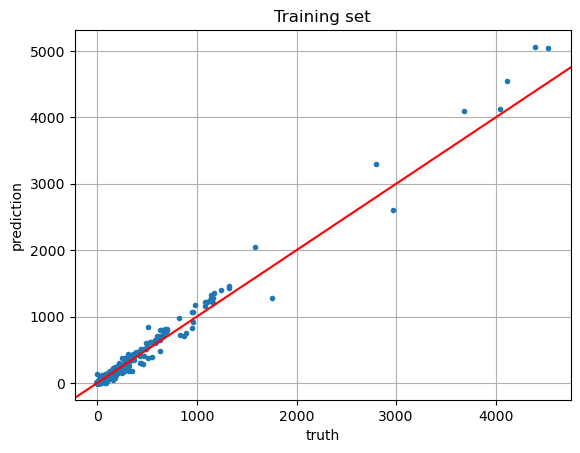

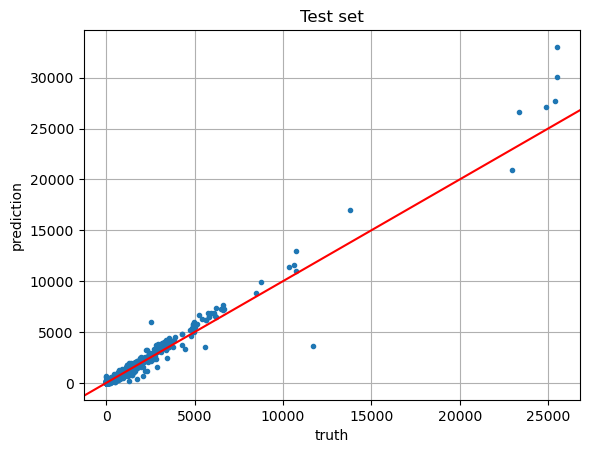

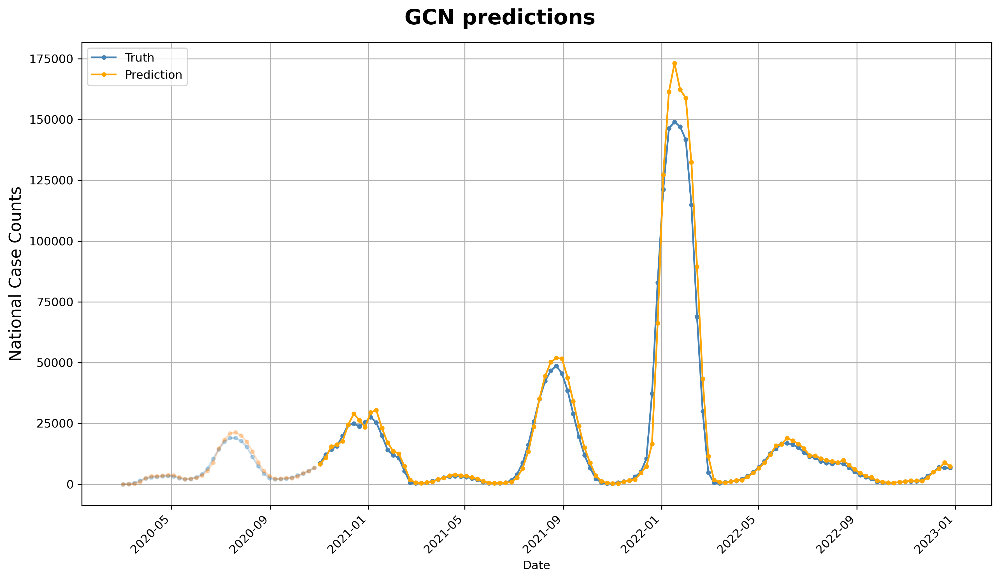

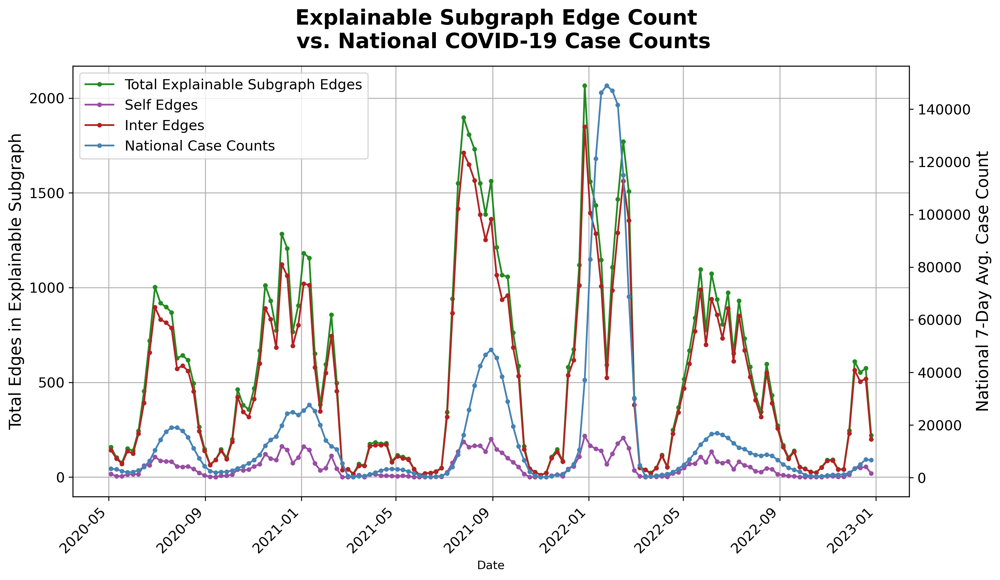

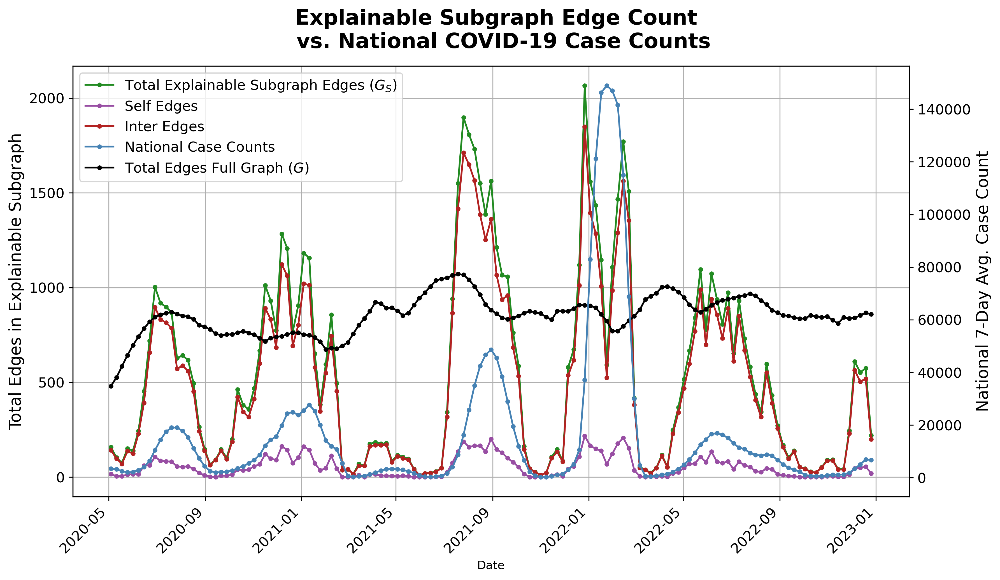

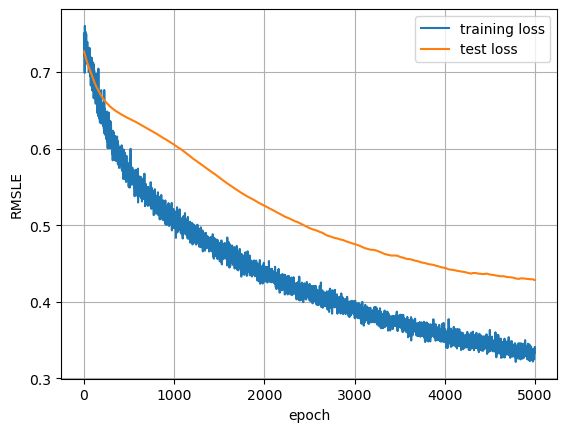


  0%|          | 0/139 [00:00<?, ?it/s]

2020-05-04
average explainable edge mask: tensor(0.0908)
number of edges in edge mask: 163
number of self edges: tensor(33)
number of inter edges: tensor(130)
date_range_start
2020-04-06    23
2020-04-13    18
2020-04-20    15
2020-04-27    25
2020-05-04    24
dtype: int64



  1%|          | 1/139 [00:04<09:25,  4.10s/it]

2020-05-11
average explainable edge mask: tensor(0.0817)
number of edges in edge mask: 110
number of self edges: tensor(19)
number of inter edges: tensor(91)
date_range_start
2020-04-13     9
2020-04-20    13
2020-04-27    11
2020-05-04    14
2020-05-11    16
dtype: int64



  1%|▏         | 2/139 [00:07<08:04,  3.54s/it]

2020-05-18
average explainable edge mask: tensor(0.0771)
number of edges in edge mask: 85
number of self edges: tensor(9)
number of inter edges: tensor(76)
date_range_start
2020-04-20    9
2020-04-27    7
2020-05-04    9
2020-05-11    7
2020-05-18    9
dtype: int64



  2%|▏         | 3/139 [00:11<08:32,  3.77s/it]

2020-05-25
average explainable edge mask: tensor(0.0779)
number of edges in edge mask: 95
number of self edges: tensor(18)
number of inter edges: tensor(77)
date_range_start
2020-04-27     8
2020-05-04    12
2020-05-11    11
2020-05-18    14
2020-05-25    11
dtype: int64



  3%|▎         | 4/139 [00:14<08:21,  3.71s/it]

2020-06-01
average explainable edge mask: tensor(0.0750)
number of edges in edge mask: 87
number of self edges: tensor(11)
number of inter edges: tensor(76)
date_range_start
2020-05-04    10
2020-05-11    11
2020-05-18     8
2020-05-25    12
2020-06-01     4
dtype: int64



  4%|▎         | 5/139 [00:18<07:59,  3.58s/it]

2020-06-08
average explainable edge mask: tensor(0.0699)
number of edges in edge mask: 49
number of self edges: tensor(3)
number of inter edges: tensor(46)
date_range_start
2020-05-11    2
2020-05-18    3
2020-05-25    4
2020-06-01    6
2020-06-08    3
dtype: int64



  4%|▍         | 6/139 [00:20<07:12,  3.25s/it]

2020-06-15
average explainable edge mask: tensor(0.0652)
number of edges in edge mask: 36
number of self edges: tensor(2)
number of inter edges: tensor(34)
date_range_start
2020-05-18    5
2020-05-25    1
2020-06-01    1
2020-06-08    1
2020-06-15    3
dtype: int64



  5%|▌         | 7/139 [00:23<06:56,  3.15s/it]

2020-06-22
average explainable edge mask: tensor(0.0678)
number of edges in edge mask: 56
number of self edges: tensor(6)
number of inter edges: tensor(50)
date_range_start
2020-05-25    10
2020-06-01     2
2020-06-08     3
2020-06-15     7
2020-06-22     3
dtype: int64



  6%|▌         | 8/139 [00:27<07:05,  3.25s/it]

2020-06-29
average explainable edge mask: tensor(0.0741)
number of edges in edge mask: 104
number of self edges: tensor(13)
number of inter edges: tensor(91)
date_range_start
2020-06-01    12
2020-06-08     8
2020-06-15    10
2020-06-22    13
2020-06-29     7
dtype: int64



  6%|▋         | 9/139 [00:30<07:07,  3.29s/it]

2020-07-06
average explainable edge mask: tensor(0.0745)
number of edges in edge mask: 116
number of self edges: tensor(12)
number of inter edges: tensor(104)
date_range_start
2020-06-08    13
2020-06-15    11
2020-06-22    13
2020-06-29    15
2020-07-06    10
dtype: int64



  7%|▋         | 10/139 [00:34<07:35,  3.53s/it]

2020-07-13
average explainable edge mask: tensor(0.0803)
number of edges in edge mask: 182
number of self edges: tensor(18)
number of inter edges: tensor(164)
date_range_start
2020-06-15    21
2020-06-22    24
2020-06-29    17
2020-07-06    27
2020-07-13    28
dtype: int64



  8%|▊         | 11/139 [00:39<08:23,  3.94s/it]

2020-07-20
average explainable edge mask: tensor(0.0837)
number of edges in edge mask: 212
number of self edges: tensor(20)
number of inter edges: tensor(192)
date_range_start
2020-06-22    23
2020-06-29    32
2020-07-06    25
2020-07-13    31
2020-07-20    25
dtype: int64



  9%|▊         | 12/139 [00:45<09:31,  4.50s/it]

2020-07-27
average explainable edge mask: tensor(0.0812)
number of edges in edge mask: 189
number of self edges: tensor(26)
number of inter edges: tensor(163)
date_range_start
2020-06-29    25
2020-07-06    28
2020-07-13    25
2020-07-20    15
2020-07-27    29
dtype: int64



  9%|▉         | 13/139 [00:49<09:20,  4.45s/it]

2020-08-03
average explainable edge mask: tensor(0.0770)
number of edges in edge mask: 152
number of self edges: tensor(19)
number of inter edges: tensor(133)
date_range_start
2020-07-06    19
2020-07-13    21
2020-07-20    12
2020-07-27    15
2020-08-03    21
dtype: int64



 10%|█         | 14/139 [00:56<10:38,  5.11s/it]

2020-08-10
average explainable edge mask: tensor(0.0797)
number of edges in edge mask: 177
number of self edges: tensor(16)
number of inter edges: tensor(161)
date_range_start
2020-07-13    25
2020-07-20    23
2020-07-27    23
2020-08-03    19
2020-08-10    17
dtype: int64



 11%|█         | 15/139 [01:00<10:00,  4.84s/it]

2020-08-17
average explainable edge mask: tensor(0.0763)
number of edges in edge mask: 141
number of self edges: tensor(13)
number of inter edges: tensor(128)
date_range_start
2020-07-20    16
2020-07-27    15
2020-08-03    12
2020-08-10    19
2020-08-17    11
dtype: int64



 12%|█▏        | 16/139 [01:04<09:23,  4.58s/it]

2020-08-24
average explainable edge mask: tensor(0.0734)
number of edges in edge mask: 121
number of self edges: tensor(9)
number of inter edges: tensor(112)
date_range_start
2020-07-27    12
2020-08-03     7
2020-08-10    11
2020-08-17    15
2020-08-24     9
dtype: int64



 12%|█▏        | 17/139 [01:09<09:19,  4.59s/it]

2020-08-31
average explainable edge mask: tensor(0.0710)
number of edges in edge mask: 115
number of self edges: tensor(7)
number of inter edges: tensor(108)
date_range_start
2020-08-03    14
2020-08-10     7
2020-08-17    10
2020-08-24     4
2020-08-31     7
dtype: int64



 13%|█▎        | 18/139 [01:12<08:15,  4.10s/it]

2020-09-07
average explainable edge mask: tensor(0.0688)
number of edges in edge mask: 94
number of self edges: tensor(7)
number of inter edges: tensor(87)
date_range_start
2020-08-10     6
2020-08-17     4
2020-08-24     7
2020-08-31    10
2020-09-07     9
dtype: int64



 14%|█▎        | 19/139 [01:15<07:34,  3.78s/it]

2020-09-14
average explainable edge mask: tensor(0.0716)
number of edges in edge mask: 132
number of self edges: tensor(12)
number of inter edges: tensor(120)
date_range_start
2020-08-17    15
2020-08-24     9
2020-08-31    21
2020-09-07    10
2020-09-14    14
dtype: int64



 14%|█▍        | 20/139 [01:18<07:22,  3.71s/it]

2020-09-21
average explainable edge mask: tensor(0.0799)
number of edges in edge mask: 204
number of self edges: tensor(19)
number of inter edges: tensor(185)
date_range_start
2020-08-24    23
2020-08-31    18
2020-09-07    27
2020-09-14    18
2020-09-21    23
dtype: int64



 15%|█▌        | 21/139 [01:24<08:36,  4.37s/it]

2020-09-28
average explainable edge mask: tensor(0.0843)
number of edges in edge mask: 237
number of self edges: tensor(32)
number of inter edges: tensor(205)
date_range_start
2020-08-31    30
2020-09-07    29
2020-09-14    24
2020-09-21    23
2020-09-28    31
dtype: int64



 16%|█▌        | 22/139 [01:29<08:49,  4.53s/it]

2020-10-05
average explainable edge mask: tensor(0.0909)
number of edges in edge mask: 283
number of self edges: tensor(29)
number of inter edges: tensor(254)
date_range_start
2020-09-07    33
2020-09-14    33
2020-09-21    36
2020-09-28    35
2020-10-05    34
dtype: int64



 17%|█▋        | 23/139 [01:35<09:22,  4.85s/it]

2020-10-12
average explainable edge mask: tensor(0.1083)
number of edges in edge mask: 420
number of self edges: tensor(54)
number of inter edges: tensor(366)
date_range_start
2020-09-14    69
2020-09-21    47
2020-09-28    48
2020-10-05    66
2020-10-12    63
dtype: int64



 17%|█▋        | 24/139 [01:42<10:59,  5.73s/it]

2020-10-19
average explainable edge mask: tensor(0.1279)
number of edges in edge mask: 612
number of self edges: tensor(78)
number of inter edges: tensor(534)
date_range_start
2020-09-21    97
2020-09-28    99
2020-10-05    89
2020-10-12    92
2020-10-19    78
dtype: int64



 18%|█▊        | 25/139 [01:54<14:06,  7.42s/it]

2020-10-26
average explainable edge mask: tensor(0.1312)
number of edges in edge mask: 637
number of self edges: tensor(79)
number of inter edges: tensor(558)
date_range_start
2020-09-28     80
2020-10-05    111
2020-10-12     99
2020-10-19     93
2020-10-26     81
dtype: int64



 19%|█▊        | 26/139 [02:05<16:14,  8.63s/it]

2020-11-02
average explainable edge mask: tensor(0.1499)
number of edges in edge mask: 802
number of self edges: tensor(109)
number of inter edges: tensor(693)
date_range_start
2020-10-05    133
2020-10-12    132
2020-10-19    117
2020-10-26    132
2020-11-02    107
dtype: int64



 19%|█▉        | 27/139 [02:21<20:20, 10.90s/it]

2020-11-09
average explainable edge mask: tensor(0.1611)
number of edges in edge mask: 863
number of self edges: tensor(161)
number of inter edges: tensor(702)
date_range_start
2020-10-12    150
2020-10-19    128
2020-10-26    119
2020-11-02    139
2020-11-09    143
dtype: int64



 20%|██        | 28/139 [02:36<22:11, 11.99s/it]

2020-11-16
average explainable edge mask: tensor(0.1577)
number of edges in edge mask: 788
number of self edges: tensor(119)
number of inter edges: tensor(669)
date_range_start
2020-10-19    118
2020-10-26    134
2020-11-02    119
2020-11-09    111
2020-11-16    132
dtype: int64



 21%|██        | 29/139 [02:50<23:02, 12.57s/it]

2020-11-23
average explainable edge mask: tensor(0.1277)
number of edges in edge mask: 532
number of self edges: tensor(95)
number of inter edges: tensor(437)
date_range_start
2020-10-26    76
2020-11-02    77
2020-11-09    76
2020-11-16    82
2020-11-23    94
dtype: int64



 22%|██▏       | 30/139 [03:00<21:30, 11.84s/it]

2020-11-30
average explainable edge mask: tensor(0.1166)
number of edges in edge mask: 436
number of self edges: tensor(66)
number of inter edges: tensor(370)
date_range_start
2020-11-02    57
2020-11-09    76
2020-11-16    59
2020-11-23    74
2020-11-30    63
dtype: int64



 22%|██▏       | 31/139 [03:08<19:21, 10.75s/it]

2020-12-07
average explainable edge mask: tensor(0.1486)
number of edges in edge mask: 701
number of self edges: tensor(121)
number of inter edges: tensor(580)
date_range_start
2020-11-09    121
2020-11-16    108
2020-11-23    107
2020-11-30    104
2020-12-07    112
dtype: int64



 23%|██▎       | 32/139 [03:21<20:13, 11.34s/it]

2020-12-14
average explainable edge mask: tensor(0.1359)
number of edges in edge mask: 612
number of self edges: tensor(99)
number of inter edges: tensor(513)
date_range_start
2020-11-16    108
2020-11-23     90
2020-11-30     92
2020-12-07     91
2020-12-14     80
dtype: int64



 24%|██▎       | 33/139 [03:32<19:54, 11.26s/it]

2020-12-21
average explainable edge mask: tensor(0.0942)
number of edges in edge mask: 253
number of self edges: tensor(34)
number of inter edges: tensor(219)
date_range_start
2020-11-23    38
2020-11-30    37
2020-12-07    32
2020-12-14    40
2020-12-21    37
dtype: int64



 24%|██▍       | 34/139 [03:38<16:58,  9.70s/it]

2020-12-28
average explainable edge mask: tensor(0.0785)
number of edges in edge mask: 93
number of self edges: tensor(9)
number of inter edges: tensor(84)
date_range_start
2020-11-30    12
2020-12-07     9
2020-12-14    12
2020-12-21    18
2020-12-28    11
dtype: int64



 25%|██▌       | 35/139 [03:42<13:48,  7.97s/it]

2021-01-04
average explainable edge mask: tensor(0.0824)
number of edges in edge mask: 166
number of self edges: tensor(16)
number of inter edges: tensor(150)
date_range_start
2020-12-07    24
2020-12-14    23
2020-12-21    18
2020-12-28    23
dtype: int64



 26%|██▌       | 36/139 [03:46<11:33,  6.74s/it]

2021-01-11
average explainable edge mask: tensor(0.0996)
number of edges in edge mask: 324
number of self edges: tensor(41)
number of inter edges: tensor(283)
date_range_start
2020-12-14    30
2020-12-21    29
2020-12-28    34
2021-01-04    60
2021-01-11    63
dtype: int64



 27%|██▋       | 37/139 [03:53<11:36,  6.83s/it]

2021-01-18
average explainable edge mask: tensor(0.0742)
number of edges in edge mask: 114
number of self edges: tensor(17)
number of inter edges: tensor(97)
date_range_start
2020-12-21     5
2020-12-28    10
2021-01-04    22
2021-01-11    18
2021-01-18    15
dtype: int64



 27%|██▋       | 38/139 [03:57<09:58,  5.93s/it]

2021-01-25
average explainable edge mask: tensor(0.0655)
number of edges in edge mask: 36
number of self edges: tensor(1)
number of inter edges: tensor(35)
date_range_start
2021-01-04    2
2021-01-11    1
2021-01-18    3
dtype: int64



 28%|██▊       | 39/139 [03:59<08:02,  4.83s/it]

2021-02-01
average explainable edge mask: tensor(0.0790)
number of edges in edge mask: 173
number of self edges: tensor(24)
number of inter edges: tensor(149)
date_range_start
2021-01-04    16
2021-01-11    24
2021-01-18    13
2021-01-25    22
2021-02-01    15
dtype: int64



 29%|██▉       | 40/139 [04:04<07:58,  4.83s/it]

2021-02-08
average explainable edge mask: tensor(0.0906)
number of edges in edge mask: 262
number of self edges: tensor(44)
number of inter edges: tensor(218)
date_range_start
2021-01-11    30
2021-01-18    37
2021-01-25    42
2021-02-01    37
2021-02-08    34
dtype: int64



 29%|██▉       | 41/139 [04:09<08:09,  4.99s/it]

2021-02-15
average explainable edge mask: tensor(0.0630)
number of edges in edge mask: 4
number of self edges: tensor(0)
number of inter edges: tensor(4)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 30%|███       | 42/139 [04:11<06:46,  4.19s/it]

2021-02-22
average explainable edge mask: tensor(0.0614)
number of edges in edge mask: 4
number of self edges: tensor(0)
number of inter edges: tensor(4)
Series([], dtype: int64)
No non-self-loop data to plot lines for.



 31%|███       | 43/139 [04:14<05:41,  3.55s/it]

2021-03-01
average explainable edge mask: tensor(0.0656)
number of edges in edge mask: 45
number of self edges: tensor(3)
number of inter edges: tensor(42)
date_range_start
2021-02-01    5
2021-02-08    5
2021-02-15    3
2021-02-22    1
2021-03-01    2
dtype: int64



 32%|███▏      | 44/139 [04:16<05:05,  3.22s/it]

2021-03-08
average explainable edge mask: tensor(0.0654)
number of edges in edge mask: 62
number of self edges: tensor(4)
number of inter edges: tensor(58)
date_range_start
2021-02-08    6
2021-02-15    3
2021-02-22    8
2021-03-01    6
2021-03-08    5
dtype: int64



 32%|███▏      | 45/139 [04:19<04:53,  3.12s/it]

2021-03-15
average explainable edge mask: tensor(0.0742)
number of edges in edge mask: 110
number of self edges: tensor(10)
number of inter edges: tensor(100)
date_range_start
2021-02-15    12
2021-02-22     7
2021-03-01    17
2021-03-08    16
2021-03-15    10
dtype: int64



 33%|███▎      | 46/139 [04:23<05:05,  3.28s/it]

2021-03-22
average explainable edge mask: tensor(0.0875)
number of edges in edge mask: 231
number of self edges: tensor(26)
number of inter edges: tensor(205)
date_range_start
2021-02-22    25
2021-03-01    32
2021-03-08    28
2021-03-15    27
2021-03-22    41
dtype: int64



 34%|███▍      | 47/139 [04:28<06:08,  4.01s/it]

2021-03-29
average explainable edge mask: tensor(0.0999)
number of edges in edge mask: 358
number of self edges: tensor(44)
number of inter edges: tensor(314)
date_range_start
2021-03-01    56
2021-03-08    57
2021-03-15    59
2021-03-22    44
2021-03-29    54
dtype: int64



 35%|███▍      | 48/139 [04:36<07:35,  5.00s/it]

2021-04-05
average explainable edge mask: tensor(0.1000)
number of edges in edge mask: 358
number of self edges: tensor(46)
number of inter edges: tensor(312)
date_range_start
2021-03-08    39
2021-03-15    66
2021-03-22    55
2021-03-29    45
2021-04-05    60
dtype: int64



 35%|███▌      | 49/139 [04:43<08:36,  5.74s/it]

2021-04-12
average explainable edge mask: tensor(0.0892)
number of edges in edge mask: 259
number of self edges: tensor(27)
number of inter edges: tensor(232)
date_range_start
2021-03-15    34
2021-03-22    37
2021-03-29    30
2021-04-05    34
2021-04-12    33
dtype: int64



 36%|███▌      | 50/139 [04:50<08:55,  6.02s/it]

2021-04-19
average explainable edge mask: tensor(0.0765)
number of edges in edge mask: 137
number of self edges: tensor(11)
number of inter edges: tensor(126)
date_range_start
2021-03-22    20
2021-03-29    20
2021-04-05    12
2021-04-12    14
2021-04-19    14
dtype: int64



 37%|███▋      | 51/139 [04:55<08:31,  5.81s/it]

2021-04-26
average explainable edge mask: tensor(0.0874)
number of edges in edge mask: 268
number of self edges: tensor(30)
number of inter edges: tensor(238)
date_range_start
2021-03-29    43
2021-04-05    44
2021-04-12    43
2021-04-19    35
2021-04-26    34
dtype: int64



 37%|███▋      | 52/139 [05:02<08:55,  6.16s/it]

2021-05-03
average explainable edge mask: tensor(0.0900)
number of edges in edge mask: 291
number of self edges: tensor(36)
number of inter edges: tensor(255)
date_range_start
2021-04-05    36
2021-04-12    45
2021-04-19    43
2021-04-26    50
2021-05-03    33
dtype: int64


In [ ]:
for hhs in tqdm(REGIONS):
    print(f"============= HHS REGION: {hhs} ============= ")
    hhs = str(hhs)
    cbsa_list = get_cbsa_list(hhs_region=hhs)

    # process data
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("processing data on device:", device)
    data = process_data.create_torch_geometric_data(VERSION(hhs), device, cbsa_list=cbsa_list)

    # train model
    graph = data.to(device)
    
    model     = GCN().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-5, weight_decay=5e-4)
    criterion = RMSLELoss()
    
    def train():
    	model.train()
    	optimizer.zero_grad()
    	out = model(graph.x.to(device), graph.edge_index.to(device), graph.edge_weight.to(device))
    	loss = criterion(out[graph.train_mask].squeeze(), graph.y[graph.train_mask])
    	loss.backward()
    	optimizer.step()
    	return loss
    
    def test():
    	model.eval()
    	out = model(graph.x, graph.edge_index, graph.edge_weight)
    	loss = criterion(out[graph.test_mask].squeeze(), graph.y[graph.test_mask])
    
    	return loss
    
    train_loss = []
    test_loss = []
    for epoch in tqdm(range(5_000)):
    	loss = train()
    	train_loss.append(loss.cpu().detach().numpy())
    	loss = test()
    	test_loss.append(loss.cpu().detach().numpy())
    
    print("final test loss: {}".format(test_loss[-1]))

    model.eval()
    out = model(graph.x, graph.edge_index, graph.edge_weight)
    print("train loss", criterion(out[graph.train_mask].squeeze(), graph.y[graph.train_mask]))
    print("test loss", criterion(out[graph.test_mask].squeeze(), graph.y[graph.test_mask]))
    print("train corr", torch.corrcoef(torch.stack((out[graph.train_mask].squeeze(), graph.y[graph.train_mask])))[0,1])
    print("test corr", torch.corrcoef(torch.stack((out[graph.test_mask].squeeze(), graph.y[graph.test_mask])))[0,1])
    y_test = graph.y[graph.test_mask].cpu().numpy()
    out_test = out[graph.test_mask].detach().cpu().numpy()
    
    y_train = graph.y[graph.train_mask].cpu().numpy()
    out_train = out[graph.train_mask].detach().cpu().numpy()

    fig, ax = plt.subplots()

    ax.plot(train_loss, label='training loss')
    ax.plot(test_loss, label='test loss')
    ax.set_xlabel('epoch')
    ax.set_ylabel('RMSLE')
    ax.grid()
    ax.legend()

    plt.show()

    fig, ax = plt.subplots()
    ax.plot(y_train, out_train, '.')
    ax.axline((0, 0), slope=1., color='red')
    ax.grid()
    ax.set_xlabel('truth')
    ax.set_ylabel('prediction')
    ax.set_title('Training set')

    fig, ax = plt.subplots()
    ax.plot(y_test, out_test, '.')
    ax.axline((0, 0), slope=1., color='red')
    ax.grid()
    ax.set_xlabel('truth')
    ax.set_ylabel('prediction')
    ax.set_title('Test set')

    node_dict = process_data.create_node_key(cbsa_list)

    pred_df = pd.DataFrame()
    pred_df['key'] = np.array(list(node_dict.keys()))[np.where(np.array(graph.test_mask.cpu().numpy())==1)]
    pred_df['truth'] = y_test
    pred_df['pred'] = out_test
    
    pred_df[['fips','date']] = pred_df['key'].str.split('-',n=1, expand=True)
    pred_df['date'] = pd.to_datetime(pred_df['date'])
    
    train_df = pd.DataFrame()
    train_df['key'] = np.array(list(node_dict.keys()))[np.where(np.array(graph.train_mask.cpu().numpy())==1)]
    train_df['truth'] = y_train
    train_df['pred'] = out_train
    
    train_df[['cbsa','date']] = train_df['key'].str.split('-',n=1, expand=True)
    train_df['date'] = pd.to_datetime(train_df['date'])

    fig, ax = plt.subplots(figsize=(12, 7), dpi=300)

    ax.plot(train_df.groupby('date')[['truth', 'pred']].sum(), '.-', alpha = 0.25)
    
    ax.plot(pred_df.groupby('date')[['truth']].sum(), '.-', color='steelblue', label='Truth')
    ax.plot(pred_df.groupby('date')[['pred']].sum(), '.-', color='orange', label='Prediction')
    ax.legend(loc='upper left', fontsize=10)
    
    ax.set_ylabel('National Case Counts', fontsize=14)
    ax.set_xlabel('Date')
    ax.grid('dashed')
    
    fig.suptitle('GCN predictions',
                 fontsize=18,
                 fontweight='bold')
    
    fig.autofmt_xdate(rotation=45)
    plt.tight_layout()

    with open(f"../data/processed/{VERSION(hhs)}/node_dict.pkl", "rb") as file:
        node_dict = pickle.load(file)

    mobility_df = process_data.get_safegraph_mobility_data(cbsa_list)

    mobility_df['key'] = mobility_df['cbsa_orig'] + "-" + mobility_df['date_range_start'].dt.strftime('%Y-%m-%d') + "-" + \
        mobility_df['cbsa_dest'] + "-" + pd.to_datetime(mobility_df['date_range_start']).dt.strftime('%Y-%m-%d')
    
    # merge lat and long into to mobility df
    cbsa_lat_long_df = pd.read_csv('../data/raw/2024_Gaz_cbsa_national.csv', dtype={
            "GEOID": "str",
    })
    
    mobility_df = mobility_df.merge(cbsa_lat_long_df[["GEOID", "INTPTLAT", "INTPTLONG"]], left_on="cbsa_orig", right_on="GEOID", how="left").drop("GEOID", axis=1).rename(
        columns={"INTPTLAT":"LATITUDE_orig", "INTPTLONG":"LONGITUDE_orig"}
    )
    
    mobility_df = mobility_df.merge(cbsa_lat_long_df[["GEOID", "INTPTLAT", "INTPTLONG"]], left_on="cbsa_dest", right_on="GEOID", how="left").drop("GEOID", axis=1).rename(
        columns={"INTPTLAT":"LATITUDE_dest", "INTPTLONG":"LONGITUDE_dest"}
    )
    
    mobility_df["log_visitor_home_aggregation"] = np.log(mobility_df["visitor_home_aggregation"])


    self_edge_count = []
    inter_edge_count = []
    PREV_WEEKS = 4
    
    explain_dates = pd.date_range(start="2020-05-04", end="2022-12-31", freq='W-MON')
    
    explaination_dict = {}
    
    with PdfPages(f'explainable_subgraph_{VERSION(hhs)}.pdf') as pdf:
        for target_date in tqdm(explain_dates):
            target_date = target_date.strftime('%Y-%m-%d')
            print(target_date)
            explanation, subgraph_edges = get_explaination(target_date, prev_weeks=PREV_WEEKS)
            explaination_dict[target_date] = subgraph_edges
            
            # count types of edges
            if subgraph_edges.shape[1] > 0:
                self_edge_count.append(sum(subgraph_edges[0,:] == subgraph_edges[1,:]).cpu().numpy())
                inter_edge_count.append(sum(subgraph_edges[0,:] != subgraph_edges[1,:]).cpu().numpy())
            else:
                self_edge_count.append(np.array(0))
                inter_edge_count.append(np.array(0))
    
        
            # create key
            swapped_dict = {value: key for key, value in node_dict.items()}
            node_idx_start = [swapped_dict[item] for item in subgraph_edges[0,:].cpu().numpy()]
            node_idx_end = [swapped_dict[item] for item in subgraph_edges[1,:].cpu().numpy()]
            explainable_keys = [node_idx_start[i] + "-" + node_idx_end[i] for i in range(len(node_idx_end))]
            explainable_mobility_df = mobility_df[mobility_df["key"].isin(explainable_keys)]
        
            print(explainable_mobility_df.groupby("date_range_start").size())
        
            # plot
            fig = plot_safegraph(explainable_mobility_df, target_date)
            pdf.savefig(fig)
            plt.close(fig)

    explain_count_df = pd.DataFrame({
        'date': explain_dates,
        'self_edge_count': self_edge_count,
        'inter_edge_count': inter_edge_count,
    })
    
    explain_count_df['total_edge_count'] = explain_count_df['self_edge_count'] + explain_count_df['inter_edge_count']
    explain_count_df['prop_self'] = explain_count_df['self_edge_count'] / explain_count_df['total_edge_count']

    _, case_df = process_data.process_case_death_data(cbsa_list)
    fig, ax = plt.subplots(figsize=(12, 7), dpi=300)
    
    sub_case_df = case_df.loc[case_df['date'].isin(explain_dates)].groupby('date')[['CASE_COUNT_7DAY_AVG']].sum().reset_index()
    
    line1, = ax.plot(explain_count_df['date'], explain_count_df['total_edge_count'], '.-', label='Total Explainable Subgraph Edges', color='forestgreen')
    line2, = ax.plot(explain_count_df['date'], explain_count_df['self_edge_count'], '.-', label='Self Edges', color='#984ea3')
    line3, = ax.plot(explain_count_df['date'], explain_count_df['inter_edge_count'], '.-', label='Inter Edges', color='firebrick')
    
    ax.set_ylabel('Total Edges in Explainable Subgraph', fontsize=14)
    ax.set_xlabel('Date')
    ax.grid('dashed')
    
    ax2 = ax.twinx()
    line4, = ax2.plot(
        sub_case_df['date'],
        sub_case_df['CASE_COUNT_7DAY_AVG'],
        ".-",
        color='steelblue',
        label='National Case Counts' # More descriptive label
    )
    ax2.set_ylabel('National 7-Day Avg. Case Count', fontsize=14)
    
    ax.tick_params(axis='y', labelsize=12)
    ax.tick_params(axis='x', labelsize=12, rotation=45)
    ax2.tick_params(axis='y', labelsize=12)
    
    ax.legend(handles=[line1, line2, line3, line4], loc='upper left', fontsize=12)
    
    
    fig.autofmt_xdate(rotation=45)
    fig.suptitle('Explainable Subgraph Edge Count \n vs. National COVID-19 Case Counts',
                 fontsize=18,
                 fontweight='bold')
    
    plt.tight_layout()
    
    plt.savefig(f"explain_edge_count_{VERSION(hhs)}.png")

    weekly_counts_df = mobility_df.groupby('date_range_start').size().to_frame('weekly_count')
    weekly_counts_df['5_week_rolling_sum'] = weekly_counts_df['weekly_count'].rolling(window=5).sum()
    
    start_date = '2020-05-04'
    weekly_counts_df = weekly_counts_df.loc[start_date:].copy()

    fig, ax = plt.subplots(figsize=(12, 7), dpi=300)
    sub_case_df = case_df.loc[case_df['date'].isin(explain_dates)].groupby('date')[['CASE_COUNT_7DAY_AVG']].sum().reset_index()
    
    line1, = ax.plot(explain_count_df['date'], explain_count_df['total_edge_count'], '.-', label=r'Total Explainable Subgraph Edges ($G_S$)', color='forestgreen')
    line2, = ax.plot(explain_count_df['date'], explain_count_df['self_edge_count'], '.-', label='Self Edges', color='#984ea3')
    line3, = ax.plot(explain_count_df['date'], explain_count_df['inter_edge_count'], '.-', label='Inter Edges', color='firebrick')
    
    line5, = ax.plot(weekly_counts_df['5_week_rolling_sum'] / 10, '.-', label=r'Total Edges Full Graph ($G$)', color='black')
    
    ax.set_ylabel('Total Edges in Explainable Subgraph', fontsize=14)
    ax.set_xlabel('Date')
    ax.grid('dashed')
    
    ax2 = ax.twinx()
    line4, = ax2.plot(
        sub_case_df['date'],
        sub_case_df['CASE_COUNT_7DAY_AVG'],
        ".-",
        color='steelblue',
        label='National Case Counts' # More descriptive label
    )
    ax2.set_ylabel('National 7-Day Avg. Case Count', fontsize=14)
    
    ax.tick_params(axis='y', labelsize=12)
    ax.tick_params(axis='x', labelsize=12, rotation=45)
    ax2.tick_params(axis='y', labelsize=12)
    
    ax.legend(handles=[line1, line2, line3, line4, line5], loc='upper left', fontsize=12)
    
    
    fig.autofmt_xdate(rotation=45)
    fig.suptitle('Explainable Subgraph Edge Count \n vs. National COVID-19 Case Counts',
                 fontsize=18,
                 fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(f"explain_edge_count_with_full_{VERSION(hhs)}.png")



In [5]:
def get_mask(target_date, node_dict, prev_weeks=None):
    # get node_dict
    def get_values_by_date(data_dict, target_date):
        filtered_values = []
        for key, value in data_dict.items():
            if target_date in key:
                filtered_values.append(value)
        return filtered_values
    
    target_idxs = get_values_by_date(node_dict, target_date)
    assert len(target_idxs) > 0, f"target_idxs empty for {target_date}"
    
    target_idxs = torch.tensor(target_idxs).to(device)
    
    # historical_nodes = torch.arange(max(target_idxs), device=device)
    historical_nodes = []
    for node_key, node_idx in node_dict.items():
        date_parts = node_key.split('-')[1:]
        node_date_str = "-".join(date_parts)
        node_date = datetime.strptime(node_date_str, "%Y-%m-%d")
    
        if node_date <= datetime.strptime(target_date, "%Y-%m-%d"):
            if prev_weeks:
                # check that node is within certain number of weeks of target date
                diff = datetime.strptime(target_date, "%Y-%m-%d") - node_date
                if diff.days // 7 <= prev_weeks:
                    historical_nodes.append(node_idx)
            else:
                historical_nodes.append(node_idx)
    historical_nodes = torch.tensor(historical_nodes, dtype=torch.long).to(device)
    
    sub_edge_index, sub_edge_weight  = subgraph(
        subset=historical_nodes,
        edge_index=data.edge_index,
        edge_attr=data.edge_weight,
        relabel_nodes=True,
        return_edge_mask=False
    )
    sub_x = data.x[historical_nodes]

    target_node_map = {original_idx.item(): new_idx for new_idx, original_idx in enumerate(historical_nodes)}
    relabeled_target_idxs = torch.tensor([target_node_map[idx.item()] for idx in target_idxs]).to(device)

    return sub_x, sub_edge_index, sub_edge_weight, relabeled_target_idxs, historical_nodes


def get_explaination(target_date, prev_weeks=None):
    explainer = Explainer(
        model=model.cpu(),
        algorithm=GNNExplainer(epochs=200),
        explanation_type='model',
        node_mask_type='attributes',
        edge_mask_type='object',
        model_config=dict(
            mode='regression',
            task_level='node',
            return_type='raw',
        ),
    )
    # sub_x: data x historical_nodes_idx
    
    sub_x, sub_edge_index, sub_edge_weight, target_idxs, historical_nodes = get_mask(target_date, node_dict, prev_weeks)
    assert all(idx <= sub_x.shape[0] for idx in target_idxs), f"Some target idx out of bounds: {target_idxs}, sub_x.shape={sub_x.shape}"

    explanation = explainer(
        x=sub_x.to("cpu"),
        edge_index=sub_edge_index.to("cpu"),
        edge_weight=sub_edge_weight.to("cpu"),
        index=target_idxs.to("cpu"),
    )
    
    print("average explainable edge mask:", explanation.edge_mask.mean())
    
    subgraph_edges = sub_edge_index[:,explanation.edge_mask > 0.5]
    original_subgraph_edges = historical_nodes.cpu()[subgraph_edges.cpu()]
    
    print("number of edges in edge mask:", original_subgraph_edges.shape[1])
    print("number of self edges:", sum(original_subgraph_edges[0,:] == original_subgraph_edges[1,:]))
    print("number of inter edges:", sum(original_subgraph_edges[0,:] != original_subgraph_edges[1,:]))

    return explanation, original_subgraph_edges

In [4]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader
from shapely.geometry import MultiPolygon, Polygon

def plot_safegraph(subset_df, target_date, land_color='white', tristate_color='#ccebc5', other_state_color='#f0f0f0'):
    """
    Generates a plot of mobility data

    Args:
        subset_df (pd.DataFrame): DataFrame containing mobility data with columns:
                                   'LATITUDE_orig', 'LONGITUDE_orig',
                                   'LATITUDE_dest', 'LONGITUDE_dest',
                                   'log_visitor_home_aggregation'.
        land_color (str): Color for the land masses.
        tristate_color (str): Fill color for NY, NJ, and PA.
        other_state_color (str): Fill color for other states.

    Returns:
        matplotlib.figure.Figure: The generated Matplotlib figure object.
    """
    # Ensure data is sorted for consistent plotting (optional, but can help if overlap matters)
    subset_df = subset_df.sort_values('log_visitor_home_aggregation')

    # --- Figure Setup ---
    fig = plt.figure(figsize=(10, 8), dpi=300)
    platecarree = ccrs.PlateCarree() # Projection for lat/lon data
    geodetic = ccrs.Geodetic()       # Projection for distance calculations (if needed)

    ax = fig.add_subplot(1, 1, 1, projection=platecarree)
    ax.set_extent([-135, -60, 20, 55], platecarree)

    # --- Add Geographic Features ---

    # Add Land with specified color
    ax.add_feature(cfeature.LAND, facecolor=land_color, edgecolor='black', linewidth=0.3, zorder=0)
    ax.add_feature(cfeature.STATES, linewidth=0.8, edgecolor='gray', zorder=5)

    # Add Ocean and Lakes
    ax.add_feature(cfeature.OCEAN, facecolor=cfeature.COLORS['water'], zorder=1)
    # ax.add_feature(cfeature.LAKES, facecolor=cfeature.COLORS['water'], edgecolor='black', linewidth=0.3, zorder=1)

    # Add Coastline
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, edgecolor='black', zorder=3)

    # --- Plot Mobility Data ---
    def _plot_row_movement(row, platecarree, geodetic, sm):
        """Plots the movement for a single row of the DataFrame."""
        lat_orig = row['LATITUDE_orig']
        lon_orig = row['LONGITUDE_orig']
        lat_dest = row['LATITUDE_dest']
        lon_dest = row['LONGITUDE_dest']

        # Transform points only if necessary (already in PlateCarree for plotting)
        # lon_orig_proj, lat_orig_proj = platecarree.transform_point(lon_orig, lat_orig, geodetic)
        # lon_dest_proj, lat_dest_proj = platecarree.transform_point(lon_dest, lat_dest, geodetic)

        mob = row['log_visitor_home_aggregation']

        # Check for self-loops (origin == destination)
        # Use a small tolerance for floating point comparison
        if abs(lon_orig - lon_dest) < 1e-6 and abs(lat_orig - lat_dest) < 1e-6:
            ax.plot(lon_orig, lat_orig, marker='o',
                    markerfacecolor='blue', # Color by magnitude
                    markeredgecolor='none', # No edge for cleaner look
                    markersize=np.sqrt(mob), # Scale size non-linearly? Adjust as needed
                    transform=platecarree,
                    alpha=0.7, zorder=5)
        else:
            # Plot movement lines
            color = sm.to_rgba(mob)
            # Scale linewidth (tanh saturates, consider linear or sqrt scaling)
            linewidth = np.sqrt(max(0, mob - subset_df['log_visitor_home_aggregation'].min() + 1)) * 0.5 # Example scaling
            linewidth = max(0.1, linewidth) # Ensure minimum linewidth

            # ax.plot([lon_orig, lon_dest], [lat_orig, lat_dest],
            #          color=color,
            #          linewidth=linewidth,
            #          transform=platecarree,
            #          solid_capstyle='round',
            #          alpha=0.8,
            #          zorder=4)

            ax.annotate(
                '',
                xy=(lon_dest, lat_dest),
                xycoords=platecarree,
                xytext=(lon_orig, lat_orig),
                textcoords=platecarree,
                arrowprops=dict(
                    arrowstyle="->",
                    color=color,
                    lw=linewidth,
                    alpha=0.8,
                    shrinkA=1, shrinkB=5
                ),
                zorder=7,
            )

    # --- Color Mapping for Lines ---
    # Filter out self-loops for normalization if they exist and are handled differently
    non_self_loops = subset_df[
        (abs(subset_df['LATITUDE_orig'] - subset_df['LATITUDE_dest']) > 1e-6) |
        (abs(subset_df['LONGITUDE_orig'] - subset_df['LONGITUDE_dest']) > 1e-6)
    ]

    if not non_self_loops.empty:
        min_val = non_self_loops['log_visitor_home_aggregation'].min()
        max_val = non_self_loops['log_visitor_home_aggregation'].max()
        # Handle case where min and max are the same
        if min_val == max_val:
             norm = plt.Normalize(vmin=min_val - 1, vmax=max_val + 1) # Adjust range slightly
        else:
             norm = plt.Normalize(vmin=min_val, vmax=max_val)

        custom_cmap = plt.cm.viridis # Or choose another perceptually uniform colormap like 'plasma', 'cividis'
        sm = plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm)
        sm.set_array([]) # Important for standalone colorbar

        # Iterate and plot each movement line
        for index, row in subset_df.iterrows():
            _plot_row_movement(row, platecarree, geodetic, sm)

        # Add Colorbar
        cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.03, pad=0.04, shrink=0.8)
        cbar.set_label(r'$\log_{10}$ Visitor Home Aggregation', fontsize=10)
        cbar.ax.tick_params(labelsize=8)

    else:
        print("No non-self-loop data to plot lines for.")


    # --- Final Touches ---
    ax.set_title(f"Explainable Subgraph, target_date:{target_date}", fontsize=14, pad=10)

    plt.tight_layout()

    return fig


In [14]:
from scipy import signal

time_series_to_analyze = {
    'Total Explainable Subgraph Edges': explain_count_df['total_edge_count'],
    'Self Edges': explain_count_df['self_edge_count'],
    'Inter Edges': explain_count_df['inter_edge_count'],
}

y = sub_case_df['CASE_COUNT_7DAY_AVG']

for name, x in time_series_to_analyze.items():
    
    correlation = signal.correlate(x-np.mean(x), y - np.mean(y), mode="full")
    lags = signal.correlation_lags(len(x), len(y), mode="full")
    lag = lags[np.argmax(abs(correlation))]
    print(lag)

-3
-3
-3


/local/ipykernel_844321/2202164374.py:13: DeprecationWarning: dtype=object is not supported by correlate and will raise an error in SciPy 1.17.0. Supported dtypes are: boolean, integer, `np.float16`,`np.float32`, `np.float64`, `np.complex64`, `np.complex128`.
  correlation = signal.correlate(x-np.mean(x), y - np.mean(y), mode="full")


# Train all regions together, GNNExplainer separately

In [28]:
# load data
version = "gcn-usa-2020-22"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

data = torch.load(f"../data/processed/{version}/data.pt")
data = data.to(device)

In [29]:
# load model
from model import GCN 

model = GCN().to(device)

model_path = "models/gcn_checkpoints/gcn_final_model.pt"
checkpoint = torch.load(model_path)

model.load_state_dict(checkpoint['model_state_dict'])

model.eval()

print("Model loaded successfully!")

Model loaded successfully!


In [30]:
with open("../data/processed/gcn-usa-2020-22/node_dict.pkl", "rb") as file:
    node_dict = pickle.load(file)

In [31]:
%%time
mobility_df = process_data.get_safegraph_mobility_data()

mobility_df['key'] = mobility_df['cbsa_orig'] + "-" + mobility_df['date_range_start'].dt.strftime('%Y-%m-%d') + "-" + \
    mobility_df['cbsa_dest'] + "-" + pd.to_datetime(mobility_df['date_range_start']).dt.strftime('%Y-%m-%d')

# merge lat and long into to mobility df
cbsa_lat_long_df = pd.read_csv('../data/raw/2024_Gaz_cbsa_national.csv', dtype={
        "GEOID": "str",
})

mobility_df = mobility_df.merge(cbsa_lat_long_df[["GEOID", "INTPTLAT", "INTPTLONG"]], left_on="cbsa_orig", right_on="GEOID", how="left").drop("GEOID", axis=1).rename(
    columns={"INTPTLAT":"LATITUDE_orig", "INTPTLONG":"LONGITUDE_orig"}
)

mobility_df = mobility_df.merge(cbsa_lat_long_df[["GEOID", "INTPTLAT", "INTPTLONG"]], left_on="cbsa_dest", right_on="GEOID", how="left").drop("GEOID", axis=1).rename(
    columns={"INTPTLAT":"LATITUDE_dest", "INTPTLONG":"LONGITUDE_dest"}
)

mobility_df["log_visitor_home_aggregation"] = np.log(mobility_df["visitor_home_aggregation"])

CPU times: user 27.1 s, sys: 6.03 s, total: 33.1 s
Wall time: 40.2 s


In [ ]:
from explain import get_explaination
from geopy.distance import distance

REGIONS = list(range(1,11))
PREV_WEEKS = 4

explain_dates = pd.date_range(start="2020-05-04", end="2022-12-31", freq='W-MON')
# explain_dates = pd.date_range(start="2020-05-04", end="2029-12-31", freq='W-MON')


hhs_explain_count_df_list = []
for hhs in tqdm(REGIONS):
    print(f"============= HHS REGION: {hhs} ============= ")
    hhs = str(hhs)
    cbsa_list = get_cbsa_list(hhs_region=hhs)

    self_edge_count = []
    inter_edge_count = []
    avg_distance_list = []
    explaination_dict = {}
    
    for target_date in tqdm(explain_dates):
        target_date = target_date.strftime('%Y-%m-%d')
        print(target_date)
        explanation, subgraph_edges = get_explaination(model, target_date, node_dict, data, cbsa_list=cbsa_list, prev_weeks=PREV_WEEKS)
        explaination_dict[target_date] = subgraph_edges
        
        # count types of edges
        if subgraph_edges.shape[1] > 0:
            self_edge_count.append(sum(subgraph_edges[0,:] == subgraph_edges[1,:]).cpu().numpy())
            inter_edge_count.append(sum(subgraph_edges[0,:] != subgraph_edges[1,:]).cpu().numpy())
        else:
            print("NO EDGES")
            self_edge_count.append(np.array(0))
            inter_edge_count.append(np.array(0))    
    
        def calculate_geodesic_distance(row):
            orig_coords = (row['LATITUDE_orig'], row['LONGITUDE_orig'])
            dest_coords = (row['LATITUDE_dest'], row['LONGITUDE_dest'])
            
            return distance(orig_coords, dest_coords).km

        swapped_dict = {value: key for key, value in node_dict.items()}
        node_idx_start = [swapped_dict[item] for item in subgraph_edges[0,:].cpu().numpy()]
        node_idx_end = [swapped_dict[item] for item in subgraph_edges[1,:].cpu().numpy()]
        explainable_keys = [node_idx_start[i] + "-" + node_idx_end[i] for i in range(len(node_idx_end))]
        explainable_mobility_df = mobility_df[mobility_df["key"].isin(explainable_keys)]
        # print(explainable_mobility_df.groupby("date_range_start").size())
        filtered_df = explainable_mobility_df.loc[explainable_mobility_df['cbsa_orig'] != explainable_mobility_df['cbsa_dest'], ['LATITUDE_orig', 'LONGITUDE_orig', 'LATITUDE_dest', 'LONGITUDE_dest']]
        if filtered_df.shape[0] > 0:
            avg_distance = filtered_df.apply(calculate_geodesic_distance, axis=1).mean()
            avg_distance_list.append(avg_distance)
        else:
            avg_distance_list.append(0)
    
    explain_count_df = pd.DataFrame({
        'date': explain_dates,
        'self_edge_count': self_edge_count,
        'inter_edge_count': inter_edge_count,
        'avg_distance': avg_distance_list,
    })
    explain_count_df['hhs_region'] = hhs
    explain_count_df['total_edge_count'] = explain_count_df['self_edge_count'] + explain_count_df['inter_edge_count']
    explain_count_df['prop_self'] = explain_count_df['self_edge_count'] / explain_count_df['total_edge_count']
    
    hhs_explain_count_df_list.append(explain_count_df)


  0%|          | 0/10 [00:00<?, ?it/s]

============= HHS REGION: 1 ============= 



  0%|          | 0/139 [00:00<?, ?it/s]

2020-05-04
24



  1%|          | 1/139 [00:02<04:45,  2.07s/it]

2020-05-11
24



  1%|▏         | 2/139 [00:04<04:40,  2.05s/it]

2020-05-18
24



  2%|▏         | 3/139 [00:06<04:37,  2.04s/it]

2020-05-25
24



  3%|▎         | 4/139 [00:08<04:35,  2.04s/it]

2020-06-01
24



  4%|▎         | 5/139 [00:10<04:34,  2.05s/it]

2020-06-08
24



  4%|▍         | 6/139 [00:12<04:31,  2.04s/it]

2020-06-15
24



  5%|▌         | 7/139 [00:14<04:29,  2.04s/it]

2020-06-22
24



  6%|▌         | 8/139 [00:16<04:27,  2.05s/it]

2020-06-29
24



  6%|▋         | 9/139 [00:18<04:27,  2.06s/it]

2020-07-06
24



  7%|▋         | 10/139 [00:20<04:25,  2.06s/it]

2020-07-13
24



  8%|▊         | 11/139 [00:22<04:23,  2.06s/it]

2020-07-20
24



  9%|▊         | 12/139 [00:24<04:21,  2.06s/it]

2020-07-27
24



  9%|▉         | 13/139 [00:26<04:23,  2.09s/it]

2020-08-03
24



 10%|█         | 14/139 [00:28<04:22,  2.10s/it]

2020-08-10
24



 11%|█         | 15/139 [00:31<04:20,  2.10s/it]

2020-08-17
24



 12%|█▏        | 16/139 [00:33<04:17,  2.10s/it]

2020-08-24
24



 12%|█▏        | 17/139 [00:35<04:15,  2.09s/it]

2020-08-31
24



 13%|█▎        | 18/139 [00:37<04:13,  2.10s/it]

2020-09-07
24



 14%|█▎        | 19/139 [00:39<04:11,  2.10s/it]

2020-09-14
24



 14%|█▍        | 20/139 [00:41<04:09,  2.10s/it]

2020-09-21
24



 15%|█▌        | 21/139 [00:43<04:07,  2.10s/it]

2020-09-28
24



 16%|█▌        | 22/139 [00:45<04:05,  2.10s/it]

2020-10-05
24



 17%|█▋        | 23/139 [00:47<04:04,  2.10s/it]

2020-10-12
24



 17%|█▋        | 24/139 [00:49<04:02,  2.11s/it]

2020-10-19
24



 18%|█▊        | 25/139 [00:52<04:00,  2.11s/it]

2020-10-26
24



 19%|█▊        | 26/139 [00:54<03:58,  2.11s/it]

2020-11-02
24



 19%|█▉        | 27/139 [00:56<03:56,  2.11s/it]

2020-11-09
24



 20%|██        | 28/139 [00:58<03:56,  2.13s/it]

2020-11-16
24



 21%|██        | 29/139 [01:00<03:54,  2.13s/it]

2020-11-23
24



 22%|██▏       | 30/139 [01:02<03:52,  2.13s/it]

2020-11-30
24



 22%|██▏       | 31/139 [01:04<03:50,  2.14s/it]

2020-12-07
24



 23%|██▎       | 32/139 [01:06<03:48,  2.14s/it]

2020-12-14
24



 24%|██▎       | 33/139 [01:09<03:46,  2.13s/it]

2020-12-21
24



 24%|██▍       | 34/139 [01:11<03:43,  2.13s/it]

2020-12-28
24



 25%|██▌       | 35/139 [01:13<03:42,  2.14s/it]

2021-01-04
24



 26%|██▌       | 36/139 [01:15<03:41,  2.15s/it]

2021-01-11
24



 27%|██▋       | 37/139 [01:17<03:39,  2.15s/it]

2021-01-18
24



 27%|██▋       | 38/139 [01:19<03:38,  2.16s/it]

2021-01-25
24



 28%|██▊       | 39/139 [01:22<03:35,  2.16s/it]

2021-02-01
24



 29%|██▉       | 40/139 [01:24<03:34,  2.17s/it]

2021-02-08
24



 29%|██▉       | 41/139 [01:26<03:32,  2.16s/it]

2021-02-15
24



 30%|███       | 42/139 [01:28<03:29,  2.16s/it]

2021-02-22
24



 31%|███       | 43/139 [01:30<03:27,  2.17s/it]

2021-03-01
24



 32%|███▏      | 44/139 [01:32<03:26,  2.17s/it]

2021-03-08
24



 32%|███▏      | 45/139 [01:35<03:23,  2.17s/it]

2021-03-15
24



 33%|███▎      | 46/139 [01:37<03:22,  2.18s/it]

2021-03-22
24



 34%|███▍      | 47/139 [01:39<03:21,  2.19s/it]

2021-03-29
24



 35%|███▍      | 48/139 [01:41<03:19,  2.19s/it]

2021-04-05
24



 35%|███▌      | 49/139 [01:43<03:17,  2.19s/it]

2021-04-12
24



 36%|███▌      | 50/139 [01:46<03:14,  2.19s/it]

2021-04-19
24



 37%|███▋      | 51/139 [01:48<03:12,  2.19s/it]

2021-04-26
24



 37%|███▋      | 52/139 [01:50<03:11,  2.20s/it]

2021-05-03
24



 38%|███▊      | 53/139 [01:52<03:09,  2.20s/it]

2021-05-10
24



 39%|███▉      | 54/139 [01:54<03:06,  2.20s/it]

2021-05-17
24



 40%|███▉      | 55/139 [01:57<03:05,  2.21s/it]

2021-05-24
24



 40%|████      | 56/139 [01:59<03:03,  2.21s/it]

2021-05-31
24



 41%|████      | 57/139 [02:01<03:00,  2.20s/it]

NO EDGES
2021-06-07
24



 42%|████▏     | 58/139 [02:03<02:57,  2.20s/it]

2021-06-14
24



 42%|████▏     | 59/139 [02:05<02:55,  2.20s/it]

2021-06-21
24



 43%|████▎     | 60/139 [02:08<02:54,  2.21s/it]

2021-06-28
24



 44%|████▍     | 61/139 [02:10<02:52,  2.21s/it]

NO EDGES
2021-07-05
24



 45%|████▍     | 62/139 [02:12<02:50,  2.21s/it]

2021-07-12
24



 45%|████▌     | 63/139 [02:14<02:48,  2.22s/it]

2021-07-19
24



 46%|████▌     | 64/139 [02:17<02:47,  2.23s/it]

2021-07-26
24



 47%|████▋     | 65/139 [02:19<02:46,  2.25s/it]

2021-08-02
24



 47%|████▋     | 66/139 [02:21<02:45,  2.27s/it]

2021-08-09
24



 48%|████▊     | 67/139 [02:23<02:43,  2.27s/it]

2021-08-16
24



 49%|████▉     | 68/139 [02:26<02:41,  2.28s/it]

2021-08-23
24



 50%|████▉     | 69/139 [02:28<02:40,  2.30s/it]

2021-08-30
24



 50%|█████     | 70/139 [02:30<02:39,  2.31s/it]

2021-09-06
24



 51%|█████     | 71/139 [02:33<02:39,  2.35s/it]

2021-09-13
24



 52%|█████▏    | 72/139 [02:35<02:39,  2.38s/it]

2021-09-20
24



 53%|█████▎    | 73/139 [02:38<02:39,  2.41s/it]

2021-09-27
24



 53%|█████▎    | 74/139 [02:40<02:38,  2.44s/it]

2021-10-04
24



 54%|█████▍    | 75/139 [02:43<02:37,  2.46s/it]

2021-10-11
24



 55%|█████▍    | 76/139 [02:45<02:35,  2.47s/it]

2021-10-18
24



 55%|█████▌    | 77/139 [02:48<02:33,  2.48s/it]

2021-10-25
24



 56%|█████▌    | 78/139 [02:50<02:31,  2.48s/it]

2021-11-01
24



 57%|█████▋    | 79/139 [02:53<02:28,  2.48s/it]

2021-11-08
24



 58%|█████▊    | 80/139 [02:55<02:26,  2.48s/it]

2021-11-15
24



 58%|█████▊    | 81/139 [02:58<02:24,  2.48s/it]

2021-11-22
24



 59%|█████▉    | 82/139 [03:00<02:22,  2.49s/it]

2021-11-29
24



 60%|█████▉    | 83/139 [03:03<02:20,  2.51s/it]

2021-12-06
24



 60%|██████    | 84/139 [03:05<02:18,  2.52s/it]

2021-12-13
24



 61%|██████    | 85/139 [03:08<02:15,  2.51s/it]

2021-12-20
24



 62%|██████▏   | 86/139 [03:10<02:13,  2.52s/it]

2021-12-27
24



 63%|██████▎   | 87/139 [03:13<02:12,  2.54s/it]

2022-01-03
24



 63%|██████▎   | 88/139 [03:15<02:09,  2.54s/it]

2022-01-10
24



 64%|██████▍   | 89/139 [03:18<02:06,  2.54s/it]

2022-01-17
24



 65%|██████▍   | 90/139 [03:21<02:04,  2.53s/it]

2022-01-24
24



 65%|██████▌   | 91/139 [03:23<02:02,  2.55s/it]

2022-01-31
24



 66%|██████▌   | 92/139 [03:26<02:00,  2.56s/it]

2022-02-07
24



 67%|██████▋   | 93/139 [03:28<01:57,  2.55s/it]

2022-02-14
24



 68%|██████▊   | 94/139 [03:31<01:55,  2.56s/it]

2022-02-21
24



 68%|██████▊   | 95/139 [03:33<01:52,  2.55s/it]

2022-02-28
24



 69%|██████▉   | 96/139 [03:36<01:49,  2.55s/it]

2022-03-07
24



 70%|██████▉   | 97/139 [03:38<01:46,  2.54s/it]

2022-03-14
24



 71%|███████   | 98/139 [03:41<01:44,  2.54s/it]

2022-03-21
24



 71%|███████   | 99/139 [03:44<01:41,  2.54s/it]

2022-03-28
24



 72%|███████▏  | 100/139 [03:46<01:39,  2.55s/it]

2022-04-04
24



 73%|███████▎  | 101/139 [03:49<01:36,  2.55s/it]

2022-04-11
24



 73%|███████▎  | 102/139 [03:51<01:34,  2.56s/it]

2022-04-18
24



 74%|███████▍  | 103/139 [03:54<01:32,  2.56s/it]

2022-04-25
24



 75%|███████▍  | 104/139 [03:56<01:30,  2.57s/it]

2022-05-02
24



 76%|███████▌  | 105/139 [03:59<01:27,  2.57s/it]

2022-05-09
24



 76%|███████▋  | 106/139 [04:01<01:24,  2.57s/it]

2022-05-16
24



 77%|███████▋  | 107/139 [04:04<01:22,  2.57s/it]

2022-05-23
24



 78%|███████▊  | 108/139 [04:07<01:19,  2.58s/it]

2022-05-30
24



 78%|███████▊  | 109/139 [04:09<01:17,  2.59s/it]

2022-06-06
24



 79%|███████▉  | 110/139 [04:12<01:15,  2.60s/it]

2022-06-13
24



 80%|███████▉  | 111/139 [04:15<01:12,  2.60s/it]

2022-06-20
24



 81%|████████  | 112/139 [04:17<01:10,  2.60s/it]

2022-06-27
24



 81%|████████▏ | 113/139 [04:20<01:07,  2.60s/it]

2022-07-04
24



 82%|████████▏ | 114/139 [04:22<01:05,  2.60s/it]

2022-07-11
24



 83%|████████▎ | 115/139 [04:25<01:02,  2.60s/it]

2022-07-18
24



 83%|████████▎ | 116/139 [04:28<01:00,  2.61s/it]

2022-07-25
24



 84%|████████▍ | 117/139 [04:30<00:57,  2.62s/it]

2022-08-01
24



 85%|████████▍ | 118/139 [04:33<00:55,  2.62s/it]

2022-08-08
24



 86%|████████▌ | 119/139 [04:36<00:53,  2.66s/it]

2022-08-15
24



 86%|████████▋ | 120/139 [04:38<00:50,  2.66s/it]

2022-08-22
24



 87%|████████▋ | 121/139 [04:41<00:47,  2.66s/it]

2022-08-29
24



 88%|████████▊ | 122/139 [04:44<00:45,  2.66s/it]

2022-09-05
24



 88%|████████▊ | 123/139 [04:46<00:42,  2.66s/it]

2022-09-12
24



 89%|████████▉ | 124/139 [04:49<00:39,  2.66s/it]

2022-09-19
24



 90%|████████▉ | 125/139 [04:52<00:37,  2.66s/it]

2022-09-26
24



 91%|█████████ | 126/139 [04:54<00:34,  2.66s/it]

2022-10-03
24



 91%|█████████▏| 127/139 [04:57<00:31,  2.65s/it]

2022-10-10
24



 92%|█████████▏| 128/139 [05:00<00:29,  2.66s/it]

2022-10-17
24



 93%|█████████▎| 129/139 [05:02<00:26,  2.66s/it]

2022-10-24
24



 94%|█████████▎| 130/139 [05:05<00:23,  2.66s/it]

2022-10-31
24



 94%|█████████▍| 131/139 [05:07<00:21,  2.66s/it]

2022-11-07
24



 95%|█████████▍| 132/139 [05:10<00:18,  2.67s/it]

2022-11-14
24



 96%|█████████▌| 133/139 [05:13<00:16,  2.67s/it]

2022-11-21
24



 96%|█████████▋| 134/139 [05:16<00:13,  2.68s/it]

2022-11-28
24



 97%|█████████▋| 135/139 [05:18<00:10,  2.69s/it]

2022-12-05
24



 98%|█████████▊| 136/139 [05:21<00:08,  2.69s/it]

2022-12-12
24



 99%|█████████▊| 137/139 [05:24<00:05,  2.69s/it]

2022-12-19
24



 99%|█████████▉| 138/139 [05:26<00:02,  2.70s/it]

2022-12-26
24



 10%|█         | 1/10 [05:29<49:26, 329.62s/it]

============= HHS REGION: 2 ============= 



  0%|          | 0/139 [00:00<?, ?it/s]

2020-05-04
30



  1%|          | 1/139 [00:02<05:01,  2.19s/it]

2020-05-11
30



  1%|▏         | 2/139 [00:04<04:59,  2.19s/it]

2020-05-18
30



  2%|▏         | 3/139 [00:06<04:57,  2.19s/it]

2020-05-25
30



  3%|▎         | 4/139 [00:08<04:56,  2.20s/it]

2020-06-01
30



  4%|▎         | 5/139 [00:10<04:54,  2.20s/it]

2020-06-08
30



  4%|▍         | 6/139 [00:13<04:51,  2.19s/it]

2020-06-15
30



  5%|▌         | 7/139 [00:15<04:50,  2.20s/it]

2020-06-22
30



  6%|▌         | 8/139 [00:17<04:48,  2.20s/it]

2020-06-29
30



  6%|▋         | 9/139 [00:19<04:46,  2.20s/it]

2020-07-06
30



  7%|▋         | 10/139 [00:22<04:45,  2.21s/it]

2020-07-13
30



  8%|▊         | 11/139 [00:24<04:43,  2.22s/it]

2020-07-20
30



  9%|▊         | 12/139 [00:26<04:42,  2.23s/it]

2020-07-27
30



  9%|▉         | 13/139 [00:28<04:42,  2.24s/it]

2020-08-03
30



 10%|█         | 14/139 [00:30<04:39,  2.24s/it]

2020-08-10
30



 11%|█         | 15/139 [00:33<04:38,  2.25s/it]

2020-08-17
30



 12%|█▏        | 16/139 [00:35<04:36,  2.25s/it]

2020-08-24
30



 12%|█▏        | 17/139 [00:37<04:33,  2.24s/it]

2020-08-31
30



 13%|█▎        | 18/139 [00:39<04:31,  2.24s/it]

2020-09-07
30



 14%|█▎        | 19/139 [00:42<04:29,  2.25s/it]

2020-09-14
30



 14%|█▍        | 20/139 [00:44<04:27,  2.25s/it]

2020-09-21
30



 15%|█▌        | 21/139 [00:46<04:26,  2.26s/it]

2020-09-28
30



 16%|█▌        | 22/139 [00:49<04:23,  2.26s/it]

2020-10-05
30



 17%|█▋        | 23/139 [00:51<04:21,  2.26s/it]

2020-10-12
30



 17%|█▋        | 24/139 [00:53<04:20,  2.27s/it]

2020-10-19
30



 18%|█▊        | 25/139 [00:55<04:18,  2.27s/it]

2020-10-26
30



 19%|█▊        | 26/139 [00:58<04:17,  2.27s/it]

2020-11-02
30



 19%|█▉        | 27/139 [01:00<04:15,  2.28s/it]

2020-11-09
30



 20%|██        | 28/139 [01:02<04:13,  2.29s/it]

2020-11-16
30



 21%|██        | 29/139 [01:05<04:11,  2.29s/it]

2020-11-23
30



 22%|██▏       | 30/139 [01:07<04:11,  2.31s/it]

2020-11-30
30



 22%|██▏       | 31/139 [01:09<04:10,  2.32s/it]

2020-12-07
30



 23%|██▎       | 32/139 [01:12<04:09,  2.33s/it]

2020-12-14
30



 24%|██▎       | 33/139 [01:14<04:07,  2.33s/it]

2020-12-21
30



 24%|██▍       | 34/139 [01:16<04:05,  2.34s/it]

2020-12-28
30



 25%|██▌       | 35/139 [01:19<04:03,  2.34s/it]

2021-01-04
30



 26%|██▌       | 36/139 [01:21<04:00,  2.33s/it]

2021-01-11
30



 27%|██▋       | 37/139 [01:23<03:58,  2.34s/it]

2021-01-18
30



 27%|██▋       | 38/139 [01:26<03:56,  2.34s/it]

2021-01-25
30



 28%|██▊       | 39/139 [01:28<03:54,  2.34s/it]

2021-02-01
30



 29%|██▉       | 40/139 [01:30<03:53,  2.35s/it]

2021-02-08
30



 29%|██▉       | 41/139 [01:33<03:51,  2.36s/it]

2021-02-15
30



 30%|███       | 42/139 [01:35<03:49,  2.37s/it]

2021-02-22
30



 31%|███       | 43/139 [01:37<03:46,  2.36s/it]

2021-03-01
30



 32%|███▏      | 44/139 [01:40<03:43,  2.35s/it]

2021-03-08
30



 32%|███▏      | 45/139 [01:42<03:40,  2.34s/it]

2021-03-15
30



 33%|███▎      | 46/139 [01:44<03:38,  2.35s/it]

2021-03-22
30



 34%|███▍      | 47/139 [01:47<03:37,  2.36s/it]

2021-03-29
30



 35%|███▍      | 48/139 [01:49<03:35,  2.37s/it]

2021-04-05
30



 35%|███▌      | 49/139 [01:52<03:32,  2.36s/it]

2021-04-12
30



 36%|███▌      | 50/139 [01:55<03:46,  2.54s/it]

2021-04-19
30



 37%|███▋      | 51/139 [01:57<03:38,  2.48s/it]

2021-04-26
30



 37%|███▋      | 52/139 [01:59<03:33,  2.45s/it]

2021-05-03
30



 38%|███▊      | 53/139 [02:02<03:28,  2.43s/it]

2021-05-10
30



 39%|███▉      | 54/139 [02:04<03:24,  2.41s/it]

2021-05-17
30



 40%|███▉      | 55/139 [02:06<03:21,  2.40s/it]

2021-05-24
30



 40%|████      | 56/139 [02:09<03:19,  2.40s/it]

2021-05-31
30



 41%|████      | 57/139 [02:11<03:15,  2.38s/it]

2021-06-07
30



 42%|████▏     | 58/139 [02:14<03:13,  2.39s/it]

2021-06-14
30



 42%|████▏     | 59/139 [02:16<03:10,  2.38s/it]

2021-06-21
30



 43%|████▎     | 60/139 [02:18<03:08,  2.38s/it]

2021-06-28
30



 44%|████▍     | 61/139 [02:21<03:06,  2.39s/it]

2021-07-05
30



 45%|████▍     | 62/139 [02:23<03:04,  2.40s/it]

2021-07-12
30



 45%|████▌     | 63/139 [02:26<03:03,  2.41s/it]

2021-07-19
30



 46%|████▌     | 64/139 [02:28<03:01,  2.42s/it]

2021-07-26
30



 47%|████▋     | 65/139 [02:30<03:00,  2.43s/it]

2021-08-02
30



 47%|████▋     | 66/139 [02:33<02:57,  2.44s/it]

2021-08-09
30



 48%|████▊     | 67/139 [02:35<02:56,  2.45s/it]

2021-08-16
30



 49%|████▉     | 68/139 [02:38<02:52,  2.43s/it]

2021-08-23
30



 50%|████▉     | 69/139 [02:40<02:50,  2.44s/it]

2021-08-30
30



 50%|█████     | 70/139 [02:43<02:48,  2.45s/it]

2021-09-06
30



 51%|█████     | 71/139 [02:45<02:47,  2.46s/it]

2021-09-13
30



 52%|█████▏    | 72/139 [02:48<02:44,  2.46s/it]

2021-09-20
30



 53%|█████▎    | 73/139 [02:50<02:42,  2.46s/it]

2021-09-27
30



 53%|█████▎    | 74/139 [02:53<02:40,  2.46s/it]

2021-10-04
30



 54%|█████▍    | 75/139 [02:55<02:37,  2.47s/it]

2021-10-11
30



 55%|█████▍    | 76/139 [02:58<02:35,  2.47s/it]

2021-10-18
30



 55%|█████▌    | 77/139 [03:00<02:33,  2.47s/it]

2021-10-25
30



 56%|█████▌    | 78/139 [03:02<02:30,  2.46s/it]

2021-11-01
30



 57%|█████▋    | 79/139 [03:05<02:28,  2.48s/it]

2021-11-08
30



 58%|█████▊    | 80/139 [03:07<02:26,  2.49s/it]

2021-11-15
30



 58%|█████▊    | 81/139 [03:10<02:24,  2.49s/it]

2021-11-22
30



 59%|█████▉    | 82/139 [03:13<02:22,  2.51s/it]

2021-11-29
30



 60%|█████▉    | 83/139 [03:15<02:20,  2.51s/it]

2021-12-06
30



 60%|██████    | 84/139 [03:18<02:18,  2.52s/it]

2021-12-13
30



 61%|██████    | 85/139 [03:20<02:16,  2.52s/it]

2021-12-20
30



 62%|██████▏   | 86/139 [03:23<02:16,  2.57s/it]

2021-12-27
30



 63%|██████▎   | 87/139 [03:26<02:23,  2.75s/it]

2022-01-03
30



 63%|██████▎   | 88/139 [03:29<02:21,  2.77s/it]

2022-01-10
30



 64%|██████▍   | 89/139 [03:31<02:14,  2.69s/it]

2022-01-17
30



 65%|██████▍   | 90/139 [03:34<02:10,  2.66s/it]

2022-01-24
30



 65%|██████▌   | 91/139 [03:37<02:07,  2.65s/it]

2022-01-31
30



 66%|██████▌   | 92/139 [03:39<02:07,  2.71s/it]

2022-02-07
30



 67%|██████▋   | 93/139 [03:42<02:03,  2.70s/it]

2022-02-14
30



 68%|██████▊   | 94/139 [03:45<01:59,  2.65s/it]

2022-02-21
30



 68%|██████▊   | 95/139 [03:47<01:55,  2.62s/it]

2022-02-28
30



 69%|██████▉   | 96/139 [03:50<01:50,  2.58s/it]

NO EDGES
2022-03-07
30



 70%|██████▉   | 97/139 [03:52<01:47,  2.57s/it]

2022-03-14
30



 71%|███████   | 98/139 [03:55<01:44,  2.56s/it]

2022-03-21
30



 71%|███████   | 99/139 [03:57<01:41,  2.55s/it]

2022-03-28
30



 72%|███████▏  | 100/139 [04:00<01:39,  2.54s/it]

2022-04-04
30



 73%|███████▎  | 101/139 [04:02<01:36,  2.55s/it]

2022-04-11
30



 73%|███████▎  | 102/139 [04:05<01:34,  2.55s/it]

2022-04-18
30



 74%|███████▍  | 103/139 [04:07<01:31,  2.55s/it]

2022-04-25
30



 75%|███████▍  | 104/139 [04:10<01:29,  2.55s/it]

2022-05-02
30



 76%|███████▌  | 105/139 [04:13<01:26,  2.55s/it]

2022-05-09
30



 76%|███████▋  | 106/139 [04:15<01:24,  2.55s/it]

2022-05-16
30



 77%|███████▋  | 107/139 [04:18<01:21,  2.56s/it]

2022-05-23
30



 78%|███████▊  | 108/139 [04:20<01:19,  2.58s/it]

2022-05-30
30



 78%|███████▊  | 109/139 [04:23<01:17,  2.58s/it]

2022-06-06
30



 79%|███████▉  | 110/139 [04:25<01:14,  2.58s/it]

2022-06-13
30



 80%|███████▉  | 111/139 [04:28<01:12,  2.59s/it]

2022-06-20
30



 81%|████████  | 112/139 [04:31<01:10,  2.60s/it]

2022-06-27
30



 81%|████████▏ | 113/139 [04:33<01:07,  2.59s/it]

2022-07-04
30



 82%|████████▏ | 114/139 [04:36<01:05,  2.61s/it]

2022-07-11
30



 83%|████████▎ | 115/139 [04:39<01:02,  2.61s/it]

2022-07-18
30



 83%|████████▎ | 116/139 [04:41<00:59,  2.61s/it]

2022-07-25
30



 84%|████████▍ | 117/139 [04:44<00:57,  2.60s/it]

2022-08-01
30



 85%|████████▍ | 118/139 [04:46<00:54,  2.60s/it]

2022-08-08
30



 86%|████████▌ | 119/139 [04:49<00:52,  2.61s/it]

2022-08-15
30



 86%|████████▋ | 120/139 [04:52<00:49,  2.62s/it]

2022-08-22
30



 87%|████████▋ | 121/139 [04:54<00:47,  2.63s/it]

2022-08-29
30



 88%|████████▊ | 122/139 [04:57<00:44,  2.64s/it]

2022-09-05
30



 88%|████████▊ | 123/139 [05:00<00:42,  2.64s/it]

2022-09-12
30



 89%|████████▉ | 124/139 [05:02<00:39,  2.63s/it]

2022-09-19
30



 90%|████████▉ | 125/139 [05:05<00:37,  2.64s/it]

2022-09-26
30



 91%|█████████ | 126/139 [05:07<00:34,  2.65s/it]

2022-10-03
30



 91%|█████████▏| 127/139 [05:10<00:31,  2.65s/it]

2022-10-10
30



 92%|█████████▏| 128/139 [05:13<00:29,  2.67s/it]

2022-10-17
30



 93%|█████████▎| 129/139 [05:16<00:26,  2.69s/it]

2022-10-24
30



 94%|█████████▎| 130/139 [05:18<00:24,  2.70s/it]

2022-10-31
30



 94%|█████████▍| 131/139 [05:21<00:21,  2.69s/it]

2022-11-07
30



 95%|█████████▍| 132/139 [05:24<00:18,  2.69s/it]

2022-11-14
30



 96%|█████████▌| 133/139 [05:26<00:16,  2.69s/it]

2022-11-21
30



 96%|█████████▋| 134/139 [05:29<00:13,  2.71s/it]

2022-11-28
30



 97%|█████████▋| 135/139 [05:32<00:10,  2.70s/it]

2022-12-05
30



 98%|█████████▊| 136/139 [05:34<00:08,  2.70s/it]

2022-12-12
30



 99%|█████████▊| 137/139 [05:37<00:05,  2.69s/it]

2022-12-19
30



 99%|█████████▉| 138/139 [05:40<00:02,  2.70s/it]

2022-12-26
30



 20%|██        | 2/10 [11:12<45:00, 337.55s/it]

============= HHS REGION: 3 ============= 



  0%|          | 0/139 [00:00<?, ?it/s]

2020-05-04
71



  1%|          | 1/139 [00:02<05:03,  2.20s/it]

2020-05-11
71



  1%|▏         | 2/139 [00:04<04:58,  2.18s/it]

2020-05-18
71



  2%|▏         | 3/139 [00:06<04:57,  2.18s/it]

2020-05-25
71



  3%|▎         | 4/139 [00:08<04:55,  2.19s/it]

2020-06-01
71



  4%|▎         | 5/139 [00:10<04:53,  2.19s/it]

2020-06-08
71



  4%|▍         | 6/139 [00:13<04:51,  2.19s/it]

2020-06-15
71



  5%|▌         | 7/139 [00:15<04:50,  2.20s/it]

2020-06-22
71



  6%|▌         | 8/139 [00:17<04:48,  2.20s/it]

2020-06-29
71



  6%|▋         | 9/139 [00:19<04:46,  2.20s/it]

2020-07-06
71



  7%|▋         | 10/139 [00:21<04:44,  2.21s/it]

2020-07-13
71



  8%|▊         | 11/139 [00:24<04:42,  2.21s/it]

2020-07-20
71



  9%|▊         | 12/139 [00:26<04:41,  2.22s/it]

2020-07-27
71



  9%|▉         | 13/139 [00:28<04:38,  2.21s/it]

2020-08-03
71



 10%|█         | 14/139 [00:30<04:36,  2.22s/it]

2020-08-10
71



 11%|█         | 15/139 [00:33<04:36,  2.23s/it]

2020-08-17
71



 12%|█▏        | 16/139 [00:35<04:35,  2.24s/it]

2020-08-24
71



 12%|█▏        | 17/139 [00:37<04:34,  2.25s/it]

2020-08-31
71



 13%|█▎        | 18/139 [00:39<04:32,  2.25s/it]

2020-09-07
71



 14%|█▎        | 19/139 [00:42<04:30,  2.25s/it]

2020-09-14
71



 14%|█▍        | 20/139 [00:44<04:28,  2.26s/it]

2020-09-21
71



 15%|█▌        | 21/139 [00:46<04:26,  2.26s/it]

2020-09-28
71



 16%|█▌        | 22/139 [00:48<04:24,  2.26s/it]

2020-10-05
71



 17%|█▋        | 23/139 [00:51<04:23,  2.27s/it]

2020-10-12
71



 17%|█▋        | 24/139 [00:53<04:21,  2.28s/it]

2020-10-19
71



 18%|█▊        | 25/139 [00:55<04:19,  2.28s/it]

2020-10-26
71



 19%|█▊        | 26/139 [00:58<04:18,  2.29s/it]

2020-11-02
71



 19%|█▉        | 27/139 [01:00<04:17,  2.29s/it]

2020-11-09
71



 20%|██        | 28/139 [01:02<04:15,  2.30s/it]

2020-11-16
71



 21%|██        | 29/139 [01:05<04:14,  2.31s/it]

2020-11-23
71



 22%|██▏       | 30/139 [01:07<04:12,  2.32s/it]

2020-11-30
71



 22%|██▏       | 31/139 [01:09<04:10,  2.32s/it]

2020-12-07
71



 23%|██▎       | 32/139 [01:12<04:08,  2.33s/it]

2020-12-14
71



 24%|██▎       | 33/139 [01:14<04:06,  2.32s/it]

2020-12-21
71



 24%|██▍       | 34/139 [01:16<04:03,  2.32s/it]

2020-12-28
71



 25%|██▌       | 35/139 [01:19<04:01,  2.32s/it]

2021-01-04
71



 26%|██▌       | 36/139 [01:21<03:59,  2.32s/it]

2021-01-11
71



 27%|██▋       | 37/139 [01:23<03:57,  2.33s/it]

2021-01-18
71



 27%|██▋       | 38/139 [01:26<03:55,  2.33s/it]

2021-01-25
71



 28%|██▊       | 39/139 [01:28<03:53,  2.33s/it]

2021-02-01
71



 29%|██▉       | 40/139 [01:30<03:51,  2.34s/it]

2021-02-08
71


In [ ]:
hhs_explain_count_df = pd.concat(hhs_explain_count_df_list)
hhs_explain_count_df.head()

## Plot edge counts and compute cross-correlation

In [ ]:
from scipy import signal

hhs_region_names = {
    '1': 'Boston',
    '2': 'New York',
    '3': 'Philadelphia',
    '4': 'Atlanta',
    '5': 'Chicago',
    '6': 'Dallas',
    '7': 'Kansas City',
    '8': 'Denver',
    '9': 'San Francisco',
    '10': 'Seattle',
}

lags_dict = {}

for hhs in tqdm(REGIONS):
    print(f"============= HHS REGION: {hhs} ============= ")
    hhs = str(hhs)
    cbsa_list = get_cbsa_list(hhs_region=hhs)

    _, case_df = process_data.process_case_death_data(cbsa_list)
    explain_count_df = hhs_explain_count_df.loc[hhs_explain_count_df['hhs_region'] == hhs]
    
    ##### 
    # PLOT edge counts
    fig, ax = plt.subplots(figsize=(12, 7), dpi=300)
    
    sub_case_df = case_df.loc[case_df['date'].isin(explain_dates)].groupby('date')[['CASE_COUNT_7DAY_AVG']].sum().reset_index()
    
    line1, = ax.plot(explain_count_df['date'], explain_count_df['total_edge_count'], '.-', label='Total Explainable Subgraph Edges', color='forestgreen')
    line2, = ax.plot(explain_count_df['date'], explain_count_df['self_edge_count'], '.-', label='Self Edges', color='#984ea3')
    line3, = ax.plot(explain_count_df['date'], explain_count_df['inter_edge_count'], '.-', label='Inter Edges', color='firebrick')
    
    ax.set_ylabel('Total Edges in Explainable Subgraph', fontsize=14)
    ax.set_xlabel('Date')
    ax.grid('dashed')
    
    ax2 = ax.twinx()
    line4, = ax2.plot(
        sub_case_df['date'],
        sub_case_df['CASE_COUNT_7DAY_AVG'],
        ".-",
        color='steelblue',
        label='HHS Case Counts' # More descriptive label
    )
    ax2.set_ylabel('HHS 7-Day Avg. Case Count', fontsize=14)
    
    ax.tick_params(axis='y', labelsize=12)
    ax.tick_params(axis='x', labelsize=12, rotation=45)
    ax2.tick_params(axis='y', labelsize=12)
    
    ax.legend(handles=[line1, line2, line3, line4], loc='upper left', fontsize=12)
    
    
    fig.autofmt_xdate(rotation=45)
    fig.suptitle(f'Explainable Subgraph Edge Count \n vs. HHS-{hhs}({hhs_region_names[hhs]}) COVID-19 Case Counts',
                 fontsize=18,
                 fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(f"full_explain_edge_count_hhs_{hhs}.png")

    ##### 
    # plot avg distance
    fig, ax = plt.subplots(figsize=(12, 7), dpi=300)
    
    ax.plot(explain_count_df['date'], explain_count_df['avg_distance'], '.-', label='Avg edge distance (km)', color='black')
    ax.set_ylabel('Average edge distance (km)', fontsize=14)
    ax.set_xlabel('Date')
    ax.grid('dashed')
    
    ax2 = ax.twinx()
    line4, = ax2.plot(
        sub_case_df['date'],
        sub_case_df['CASE_COUNT_7DAY_AVG'],
        ".-",
        color='steelblue',
        label='HHS Case Counts'
    )
    ax2.set_ylabel('HHS 7-Day Avg. Case Count', fontsize=14)
    
    ax.tick_params(axis='y', labelsize=12)
    ax.tick_params(axis='x', labelsize=12, rotation=45)
    ax2.tick_params(axis='y', labelsize=12)
    
    ax.legend(handles=[line4], loc='upper left', fontsize=12)
    
    
    fig.autofmt_xdate(rotation=45)
    fig.suptitle(f'Explainable Subgraph Edge Distance (km) \n vs. HHS-{hhs}({hhs_region_names[hhs]}) COVID-19 Case Counts',
                 fontsize=18,
                 fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(f"full_explain_edge_distance_hhs_{hhs}.png")
    
    ##### 
    # compute cross-correlation
    time_series_to_analyze = {
        'Total Explainable Subgraph Edges': explain_count_df['total_edge_count'],
        'Self Edges': explain_count_df['self_edge_count'],
        'Inter Edges': explain_count_df['inter_edge_count'],
        'Avg distance': explain_count_df['avg_distance'],
    }
    y = sub_case_df['CASE_COUNT_7DAY_AVG']

    lag_list = []
    for name, x in time_series_to_analyze.items():
        correlation = signal.correlate(x-np.mean(x), y-np.mean(y), mode="full")
        lags = signal.correlation_lags(len(x), len(y), mode="full")
        lag = lags[np.argmax(abs(correlation))]
        lag_list.append(lag)
    lags_dict[hhs] = lag_list

In [ ]:
lags_dict

In [ ]:
time_series_column_names = list(time_series_to_analyze.keys())
pd.DataFrame.from_dict(lags_dict, orient='index', columns=time_series_column_names).to_csv('lag_dict.csv', index=False)

# Train all regions together, GNNExplainer together

In [3]:
# load data
version = "gcn-usa-2020-22"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

data = torch.load(f"../data/processed/{version}/data.pt")
data = data.to(device)

# load model
from model import GCN 

model = GCN().to(device)

model_path = "models/gcn_checkpoints/gcn_final_model.pt"
checkpoint = torch.load(model_path)

model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

# load node_dict
with open("../data/processed/gcn-usa-2020-22/node_dict.pkl", "rb") as file:
    node_dict = pickle.load(file)

# load mobility data
mobility_df = process_data.get_safegraph_mobility_data()

mobility_df['key'] = mobility_df['cbsa_orig'] + "-" + mobility_df['date_range_start'].dt.strftime('%Y-%m-%d') + "-" + \
    mobility_df['cbsa_dest'] + "-" + pd.to_datetime(mobility_df['date_range_start']).dt.strftime('%Y-%m-%d')

# merge lat and long into to mobility df
cbsa_lat_long_df = pd.read_csv('../data/raw/2024_Gaz_cbsa_national.csv', dtype={
        "GEOID": "str",
})

mobility_df = mobility_df.merge(cbsa_lat_long_df[["GEOID", "INTPTLAT", "INTPTLONG"]], left_on="cbsa_orig", right_on="GEOID", how="left").drop("GEOID", axis=1).rename(
    columns={"INTPTLAT":"LATITUDE_orig", "INTPTLONG":"LONGITUDE_orig"}
)

mobility_df = mobility_df.merge(cbsa_lat_long_df[["GEOID", "INTPTLAT", "INTPTLONG"]], left_on="cbsa_dest", right_on="GEOID", how="left").drop("GEOID", axis=1).rename(
    columns={"INTPTLAT":"LATITUDE_dest", "INTPTLONG":"LONGITUDE_dest"}
)

mobility_df["log_visitor_home_aggregation"] = np.log(mobility_df["visitor_home_aggregation"])

In [4]:
import re

def parse_explainable_keys(explainable_keys):
    pattern = r'(\d{5})-(\d{4}-\d{2}-\d{2})-(\d{5})-(\d{4}-\d{2}-\d{2})'
    
    parsed_data = []
    for item_string in explainable_keys:
        match = re.match(pattern, item_string)
        if match:
            cbsa_orig, date_orig, cbsa_dest, date_dest = match.groups()
            parsed_data.append({
                'cbsa_orig': cbsa_orig,
                'date_orig': date_orig,
                'cbsa_dest': cbsa_dest,
                'date_dest': date_dest
            })
        else:
            print(f"Warning: Could not parse string: {item_string}")
    
    df = pd.DataFrame(parsed_data)
    df['date_orig'] = pd.to_datetime(df['date_orig'])
    df['date_dest'] = pd.to_datetime(df['date_dest'])
    
    return df

In [6]:
from explain import get_explaination
from geopy.distance import distance

REGIONS = list(range(1,11))

PREV_WEEKS = 4

explain_dates = pd.date_range(start="2020-05-04", end="2020-12-31", freq='W-MON')
# explain_dates = pd.date_range(start="2020-05-04", end="2022-12-31", freq='W-MON')

explaination_dict = {} # Keep this if you still need the subgraph_edges dictionary
all_explain_df_list = [] # This is the list to store DataFrames for concatenation


for target_date in tqdm(explain_dates):
    target_date = target_date.strftime('%Y-%m-%d')
    print(target_date)
    explanation, subgraph_edges = get_explaination(model, target_date, node_dict, data, prev_weeks=PREV_WEEKS)
    explaination_dict[target_date] = subgraph_edges

    swapped_dict = {value: key for key, value in node_dict.items()}
    node_idx_start = [swapped_dict[item] for item in subgraph_edges[0,:].cpu().numpy()]
    node_idx_end = [swapped_dict[item] for item in subgraph_edges[1,:].cpu().numpy()]
    explainable_keys = [node_idx_start[i] + "-" + node_idx_end[i] for i in range(len(node_idx_end))]
    explainable_mobility_df = mobility_df[mobility_df["key"].isin(explainable_keys)]

    self_edge_count = {}
    inter_edge_count = {}
    temporal_hhs_count = {}
    
    within_hhs_count = {}
    out_hhs_count = {}
    into_hhs_count = {}
    
    # avg_distance_list = []
    for hhs in REGIONS:
        # print(f"============= HHS REGION: {hhs} ============= ")
        hhs = str(hhs)
        cbsa_list = get_cbsa_list(hhs_region=hhs)
    
        hhs_explainable_mobility_df = explainable_mobility_df.loc[(explainable_mobility_df["cbsa_orig"].isin(cbsa_list)) | (explainable_mobility_df["cbsa_dest"].isin(cbsa_list))]
        hhs_self_edge_count = hhs_explainable_mobility_df.loc[hhs_explainable_mobility_df['cbsa_orig'] == hhs_explainable_mobility_df['cbsa_dest']].shape[0]
        hhs_inter_edge_count = hhs_explainable_mobility_df.loc[hhs_explainable_mobility_df['cbsa_orig'] != hhs_explainable_mobility_df['cbsa_dest']].shape[0]
        hhs_within_edge_count = hhs_explainable_mobility_df.loc[(hhs_explainable_mobility_df['cbsa_orig'].isin(cbsa_list)) & (hhs_explainable_mobility_df['cbsa_dest'].isin(cbsa_list))].shape[0]
        hhs_out_edge_count = hhs_explainable_mobility_df.loc[(hhs_explainable_mobility_df['cbsa_orig'].isin(cbsa_list)) & ~(hhs_explainable_mobility_df['cbsa_dest'].isin(cbsa_list))].shape[0]
        hhs_into_edge_count = hhs_explainable_mobility_df.loc[~(hhs_explainable_mobility_df['cbsa_orig'].isin(cbsa_list)) & (hhs_explainable_mobility_df['cbsa_dest'].isin(cbsa_list))].shape[0]        
        
        self_edge_count[hhs] = hhs_self_edge_count
        inter_edge_count[hhs] = hhs_inter_edge_count
        within_hhs_count[hhs] = hhs_within_edge_count
        out_hhs_count[hhs] = hhs_out_edge_count
        into_hhs_count[hhs] = hhs_into_edge_count
        # temporal_hhs_count[hhs] = hhs_temporal_edge_count

    current_date_data = {
        'hhs_region': REGIONS, # Use the list of regions directly
        'self_edge_count': [self_edge_count.get(str(r), 0) for r in REGIONS],
        'inter_edge_count': [inter_edge_count.get(str(r), 0) for r in REGIONS],
        'within_hhs_edge_count': [within_hhs_count.get(str(r), 0) for r in REGIONS],
        'out_hhs_edge_count': [out_hhs_count.get(str(r), 0) for r in REGIONS],
        'into_hhs_edge_count': [into_hhs_count.get(str(r), 0) for r in REGIONS],
    }
    
    current_date_df = pd.DataFrame(current_date_data)
    current_date_df['date'] = target_date
    
    all_explain_df_list.append(current_date_df)

final_explain_summary_df = pd.concat(all_explain_df_list, ignore_index=True)
final_explain_summary_df['total_edge_count'] = final_explain_summary_df['self_edge_count'] + final_explain_summary_df['inter_edge_count']
final_explain_summary_df['date'] = pd.to_datetime(final_explain_summary_df['date'])

print("\nFinal Explain Summary DataFrame created!")
print(final_explain_summary_df.head())
print(final_explain_summary_df.info())

  0%|          | 0/35 [00:00<?, ?it/s]

2020-05-04
918


  3%|▎         | 1/35 [00:02<01:21,  2.38s/it]

2020-05-11
918


  6%|▌         | 2/35 [00:04<01:18,  2.38s/it]

2020-05-18
918


  9%|▊         | 3/35 [00:07<01:16,  2.39s/it]

2020-05-25
918


 11%|█▏        | 4/35 [00:09<01:14,  2.39s/it]

2020-06-01
918


 14%|█▍        | 5/35 [00:12<01:12,  2.41s/it]

2020-06-08
918


 17%|█▋        | 6/35 [00:14<01:09,  2.41s/it]

2020-06-15
918


 20%|██        | 7/35 [00:16<01:07,  2.41s/it]

2020-06-22
918


 23%|██▎       | 8/35 [00:19<01:07,  2.51s/it]

2020-06-29
918


 26%|██▌       | 9/35 [00:21<01:04,  2.48s/it]

2020-07-06
918


 29%|██▊       | 10/35 [00:24<01:01,  2.47s/it]

2020-07-13
918


 31%|███▏      | 11/35 [00:26<00:58,  2.46s/it]

2020-07-20
918


 34%|███▍      | 12/35 [00:29<00:56,  2.45s/it]

2020-07-27
918


 37%|███▋      | 13/35 [00:31<00:53,  2.43s/it]

2020-08-03
918


 40%|████      | 14/35 [00:34<00:51,  2.43s/it]

2020-08-10
918


 43%|████▎     | 15/35 [00:36<00:48,  2.44s/it]

2020-08-17
918


 46%|████▌     | 16/35 [00:38<00:46,  2.43s/it]

2020-08-24
918


 49%|████▊     | 17/35 [00:41<00:43,  2.44s/it]

2020-08-31
918


 51%|█████▏    | 18/35 [00:43<00:41,  2.44s/it]

2020-09-07
918


 54%|█████▍    | 19/35 [00:46<00:39,  2.44s/it]

2020-09-14
918


 57%|█████▋    | 20/35 [00:48<00:36,  2.44s/it]

2020-09-21
918


 60%|██████    | 21/35 [00:51<00:34,  2.45s/it]

2020-09-28
918


 63%|██████▎   | 22/35 [00:53<00:31,  2.45s/it]

2020-10-05
918


 66%|██████▌   | 23/35 [00:56<00:29,  2.46s/it]

2020-10-12
918


 69%|██████▊   | 24/35 [00:58<00:27,  2.46s/it]

2020-10-19
918


 71%|███████▏  | 25/35 [01:01<00:24,  2.47s/it]

2020-10-26
918


 74%|███████▍  | 26/35 [01:03<00:22,  2.48s/it]

2020-11-02
918


 77%|███████▋  | 27/35 [01:06<00:19,  2.48s/it]

2020-11-09
918


 80%|████████  | 28/35 [01:08<00:17,  2.50s/it]

2020-11-16
918


 83%|████████▎ | 29/35 [01:11<00:15,  2.54s/it]

2020-11-23
918


 86%|████████▌ | 30/35 [01:14<00:13,  2.65s/it]

2020-11-30
918


 89%|████████▊ | 31/35 [01:16<00:10,  2.60s/it]

2020-12-07
918


 91%|█████████▏| 32/35 [01:19<00:07,  2.63s/it]

2020-12-14
918


 94%|█████████▍| 33/35 [01:21<00:05,  2.60s/it]

2020-12-21
918


 97%|█████████▋| 34/35 [01:24<00:02,  2.57s/it]

2020-12-28
918


100%|██████████| 35/35 [01:26<00:00,  2.48s/it]



Final Explain Summary DataFrame created!
   hhs_region  self_edge_count  inter_edge_count  within_hhs_edge_count  \
0           1                0                 1                      1   
1           2                1                 3                      4   
2           3                1                 5                      6   
3           4                4                26                     29   
4           5                7                18                     19   

   out_hhs_edge_count  into_hhs_edge_count       date  total_edge_count  
0                   0                    0 2020-05-04                 1  
1                   0                    0 2020-05-04                 4  
2                   0                    0 2020-05-04                 6  
3                   0                    1 2020-05-04                30  
4                   2                    4 2020-05-04                25  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 

ipdb>  exit


In [15]:
_, case_df = process_data.process_case_death_data()

unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


In [16]:
case_df.head()

,date,CBSA,node_key,CASE_DELTA,CASE_COUNT_7DAY_AVG,CASE_COUNT,CASE_COUNT_PREV_0,CASE_COUNT_PREV_1,CASE_COUNT_PREV_2,CASE_COUNT_PREV_3,CASE_COUNT_PREV_4,CASE_COUNT_PREV_5
0,2020-03-02,10100,10100-2020-03-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2020-03-02,10140,10140-2020-03-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2020-03-02,10180,10180-2020-03-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2020-03-02,10220,10220-2020-03-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2020-03-02,10300,10300-2020-03-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [29]:
from scipy import signal

correlations = {}
for hhs in REGIONS:
    # print(f"============= HHS REGION: {hhs} ============= ")
    explain_count_df = final_explain_summary_df.loc[final_explain_summary_df['hhs_region'] == hhs]
    hhs = str(hhs)
    cbsa_list = get_cbsa_list(hhs_region=str(hhs))
    
    sub_case_df = case_df.loc[
        (case_df['date'].isin(explain_dates)) & (case_df['CBSA'].isin(cbsa_list))
    ].groupby('date')[['CASE_COUNT_7DAY_AVG']].sum().reset_index()

    y = sub_case_df['CASE_COUNT_7DAY_AVG']

    time_series_to_analyze = {
        'Total Explainable Subgraph Edges': explain_count_df['total_edge_count'],
        'Self Edges': explain_count_df['self_edge_count'],
        'Inter Edges': explain_count_df['inter_edge_count'],
        'Within Edges': explain_count_df['within_hhs_edge_count'],
        'Out Edges': explain_count_df['out_hhs_edge_count'],
        'Into Edges': explain_count_df['into_hhs_edge_count'],
    }

    correlations[hhs] = {}
    
    for name, x in time_series_to_analyze.items():
        raw_correlation = signal.correlate(x-np.mean(x), y - np.mean(y), mode="full")
        lags = signal.correlation_lags(len(x), len(y), mode="full")
        lag = lags[np.argmax(abs(raw_correlation))]
        print(f"HHS {hhs} - {name}: Lag = {lag}")

        sum_sq_x = np.sum((x-np.mean(x))**2)
        sum_sq_y = np.sum((y-np.mean(y))**2)
        norm_factor = np.sqrt(sum_sq_x * sum_sq_y)
        normalized_correlation = raw_correlation / norm_factor

        correlations[hhs][name] = {
                    'correlation': normalized_correlation, # The full array of correlation values
                    'lag': lag                  # The lag corresponding to the maximum absolute correlation
                }

HHS 1 - Total Explainable Subgraph Edges: Lag = -2
HHS 1 - Self Edges: Lag = -4
HHS 1 - Inter Edges: Lag = -2
HHS 1 - Within Edges: Lag = -2
HHS 1 - Out Edges: Lag = -1
HHS 1 - Into Edges: Lag = -4
HHS 2 - Total Explainable Subgraph Edges: Lag = -2
HHS 2 - Self Edges: Lag = -2
HHS 2 - Inter Edges: Lag = -2
HHS 2 - Within Edges: Lag = -2
HHS 2 - Out Edges: Lag = -2
HHS 2 - Into Edges: Lag = -3
HHS 3 - Total Explainable Subgraph Edges: Lag = -2
HHS 3 - Self Edges: Lag = -2
HHS 3 - Inter Edges: Lag = -3
HHS 3 - Within Edges: Lag = -3
HHS 3 - Out Edges: Lag = -2
HHS 3 - Into Edges: Lag = -4
HHS 4 - Total Explainable Subgraph Edges: Lag = -2
HHS 4 - Self Edges: Lag = -2
HHS 4 - Inter Edges: Lag = -2
HHS 4 - Within Edges: Lag = -2
HHS 4 - Out Edges: Lag = -2
HHS 4 - Into Edges: Lag = -2
HHS 5 - Total Explainable Subgraph Edges: Lag = -1
HHS 5 - Self Edges: Lag = -1
HHS 5 - Inter Edges: Lag = -1
HHS 5 - Within Edges: Lag = -1
HHS 5 - Out Edges: Lag = -1
HHS 5 - Into Edges: Lag = 0
HHS 6 - Tot

Assuming lag range from -34 to 34, totaling 69 lags.

Detected 6 distinct edge types to process: Total Explainable Subgraph Edges, Self Edges, Inter Edges, Within Edges, Out Edges, Into Edges

--- Building DataFrame for Edge Type: 'Total Explainable Subgraph Edges' ---

DataFrame for 'Total Explainable Subgraph Edges' (first 5 rows):
                 -34       -33       -32       -31       -30       -29  \
HHS Region                                                               
1          -0.046270 -0.105773 -0.171258 -0.226023 -0.257416 -0.264444   
2          -0.033172 -0.075735 -0.125953 -0.175435 -0.212033 -0.235204   
3          -0.048103 -0.095110 -0.159583 -0.214900 -0.253085 -0.281749   
4          -0.039185 -0.081385 -0.131395 -0.167642 -0.188884 -0.196003   
5          -0.006929 -0.031684 -0.069071 -0.115843 -0.168808 -0.222326   

                 -28       -27       -26       -25  ...        25        26  \
HHS Region                                          ...           

/local/ipykernel_3947066/1294567730.py:111: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot_df_with_values = df_for_edge_type.applymap(lambda x: f"{x:.2f}" if pd.notna(x) else "")


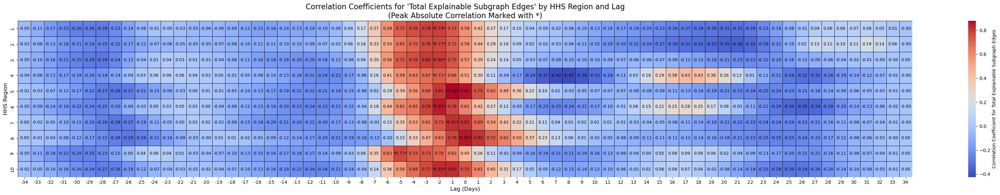


--- Building DataFrame for Edge Type: 'Self Edges' ---

DataFrame for 'Self Edges' (first 5 rows):
                 -34       -33       -32       -31       -30       -29  \
HHS Region                                                               
1          -0.042157 -0.091760 -0.145999 -0.189964 -0.195668 -0.214214   
2          -0.017100 -0.053105 -0.094500 -0.135800 -0.170369 -0.182006   
3          -0.043350 -0.082823 -0.144661 -0.199182 -0.245864 -0.274738   
4          -0.034473 -0.068248 -0.117238 -0.146665 -0.165415 -0.166800   
5          -0.004976 -0.024094 -0.057146 -0.102702 -0.155699 -0.207861   

                 -28       -27       -26       -25  ...        25        26  \
HHS Region                                          ...                       
1          -0.206303 -0.169965 -0.077216 -0.037403  ... -0.086703 -0.023999   
2          -0.183857 -0.175588 -0.159541 -0.141852  ... -0.077092  0.019262   
3          -0.286518 -0.242740 -0.078378  0.014115  ... -0.160143

/local/ipykernel_3947066/1294567730.py:111: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot_df_with_values = df_for_edge_type.applymap(lambda x: f"{x:.2f}" if pd.notna(x) else "")


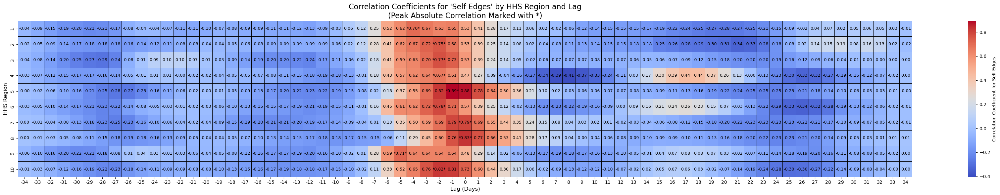


--- Building DataFrame for Edge Type: 'Inter Edges' ---

DataFrame for 'Inter Edges' (first 5 rows):
                 -34       -33       -32       -31       -30       -29  \
HHS Region                                                               
1          -0.045283 -0.104778 -0.170351 -0.225572 -0.262564 -0.266118   
2          -0.034786 -0.077592 -0.128237 -0.178074 -0.214411 -0.238749   
3          -0.048323 -0.095992 -0.160183 -0.215033 -0.251500 -0.279826   
4          -0.039618 -0.082667 -0.132661 -0.169589 -0.191059 -0.198812   
5          -0.007253 -0.032916 -0.070901 -0.117643 -0.170314 -0.223792   

                 -28       -27       -26       -25  ...        25        26  \
HHS Region                                          ...                       
1          -0.283619 -0.235594 -0.152288 -0.067583  ... -0.078282 -0.011075   
2          -0.253628 -0.224751 -0.164388 -0.114136  ... -0.103219  0.022976   
3          -0.285847 -0.241389 -0.137264 -0.049030  ... -0.1582

/local/ipykernel_3947066/1294567730.py:111: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot_df_with_values = df_for_edge_type.applymap(lambda x: f"{x:.2f}" if pd.notna(x) else "")


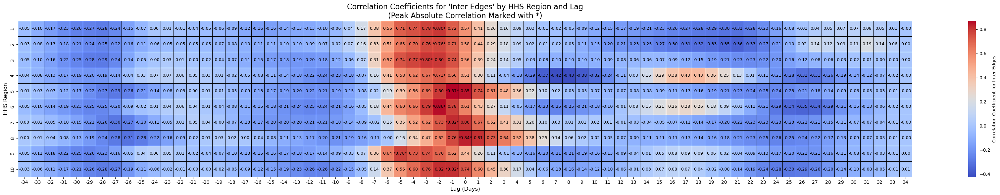


--- Building DataFrame for Edge Type: 'Within Edges' ---

DataFrame for 'Within Edges' (first 5 rows):
                 -34       -33       -32       -31       -30       -29  \
HHS Region                                                               
1          -0.042455 -0.098925 -0.161216 -0.213877 -0.242761 -0.262198   
2          -0.023979 -0.069101 -0.120544 -0.171245 -0.209165 -0.236630   
3          -0.039900 -0.079477 -0.140244 -0.192294 -0.233844 -0.260879   
4          -0.035844 -0.075354 -0.124933 -0.160819 -0.183639 -0.190025   
5          -0.006590 -0.030127 -0.065859 -0.110844 -0.161746 -0.213216   

                 -28       -27       -26       -25  ...        25        26  \
HHS Region                                          ...                       
1          -0.274707 -0.232554 -0.143254 -0.057512  ... -0.070839 -0.000410   
2          -0.248044 -0.223878 -0.155903 -0.108491  ... -0.117753 -0.008133   
3          -0.270463 -0.228847 -0.118677 -0.047734  ... -0.15

/local/ipykernel_3947066/1294567730.py:111: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot_df_with_values = df_for_edge_type.applymap(lambda x: f"{x:.2f}" if pd.notna(x) else "")


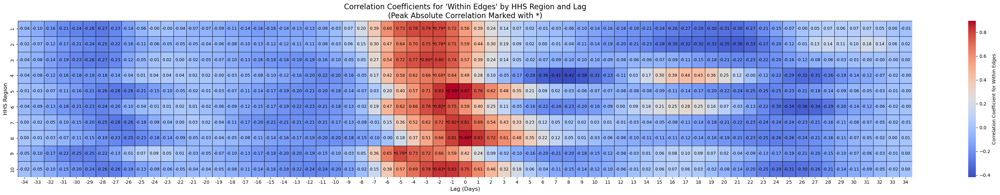


--- Building DataFrame for Edge Type: 'Out Edges' ---

DataFrame for 'Out Edges' (first 5 rows):
                 -34       -33       -32       -31       -30       -29  \
HHS Region                                                               
1          -0.040071 -0.087218 -0.138773 -0.180562 -0.207560 -0.141344   
2          -0.040103 -0.089452 -0.137225 -0.185506 -0.222400 -0.240274   
3          -0.059917 -0.115757 -0.186661 -0.245010 -0.264265 -0.293034   
4          -0.048956 -0.093068 -0.143304 -0.179012 -0.202442 -0.220926   
5          -0.008993 -0.040255 -0.084745 -0.137791 -0.196844 -0.255375   

                 -28       -27       -26       -25  ...        25        26  \
HHS Region                                          ...                       
1          -0.142293 -0.110600 -0.010107 -0.014079  ... -0.136267 -0.068573   
2          -0.248758 -0.223900 -0.173188 -0.110748  ... -0.048849  0.054923   
3          -0.292676 -0.228473 -0.107633  0.021652  ... -0.163878 -

/local/ipykernel_3947066/1294567730.py:111: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot_df_with_values = df_for_edge_type.applymap(lambda x: f"{x:.2f}" if pd.notna(x) else "")


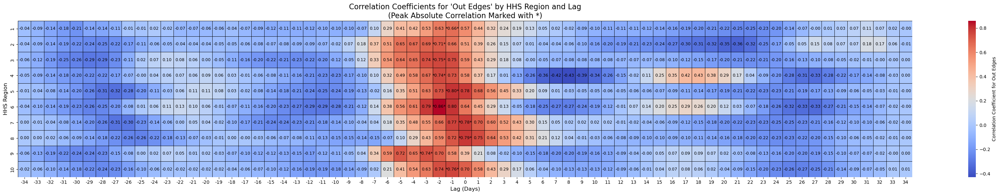


--- Building DataFrame for Edge Type: 'Into Edges' ---

DataFrame for 'Into Edges' (first 5 rows):
                 -34       -33       -32       -31       -30       -29  \
HHS Region                                                               
1          -0.051338 -0.111742 -0.177792 -0.231331 -0.265920 -0.293387   
2          -0.036984 -0.065002 -0.110678 -0.154521 -0.185191 -0.204661   
3          -0.059191 -0.118301 -0.179591 -0.236004 -0.280181 -0.311177   
4          -0.048048 -0.099793 -0.149749 -0.186506 -0.198875 -0.203652   
5          -0.005200 -0.025468 -0.059575 -0.104688 -0.158033 -0.213755   

                 -28       -27       -26       -25  ...        25        26  \
HHS Region                                          ...                       
1          -0.314436 -0.241943 -0.227748 -0.131288  ... -0.035993 -0.017529   
2          -0.224872 -0.194821 -0.157377 -0.130048  ... -0.117132  0.036288   
3          -0.315332 -0.291029 -0.193040 -0.092745  ... -0.131989

/local/ipykernel_3947066/1294567730.py:111: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot_df_with_values = df_for_edge_type.applymap(lambda x: f"{x:.2f}" if pd.notna(x) else "")


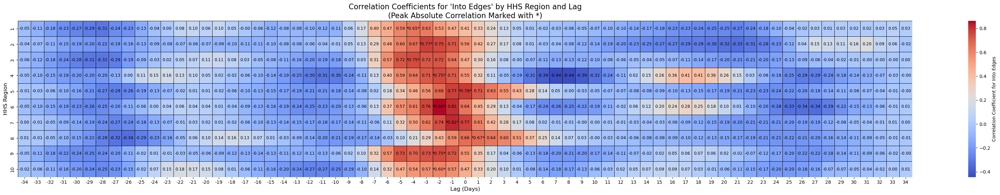


--- All DataFrames and Heatmaps generated! ---
You can access individual DataFrames from the 'correlation_dfs_by_edge_type' dictionary.


In [44]:
import pandas as pd
import numpy as np           # Needed for array manipulation and np.nan
import seaborn as sns        # For creating the heatmaps
import matplotlib.pyplot as plt # For displaying the plots

# --- Configuration for Lags (Assuming this was set in previous steps) ---
# Based on the common range for cross-correlation analysis,
# we'll assume the maximum absolute lag considered was 34.
max_lag = 34
lag_range = list(range(-max_lag, max_lag + 1)) # This creates a list of lags from -34 to 34.
                                               # The length of this list is (34 - (-34) + 1) = 69.
print(f"Assuming lag range from {lag_range[0]} to {lag_range[-1]}, totaling {len(lag_range)} lags.")


# --- Prepare to store our new DataFrames ---
# This dictionary will hold one DataFrame for each unique edge type.
# Key: Edge Type (string), Value: pandas DataFrame
correlation_dfs_by_edge_type = {}

# --- Identify all unique edge types (dimensions) ---
# We can get these from the keys of the inner dictionary of any HHS region.
# We'll pick the first HHS region found in 'correlations' to extract the names.
all_edge_types = []
if 'correlations' in locals() and correlations: # Check if the correlations dictionary is not empty and exists
    # Get the first HHS region key to access its inner dictionary
    first_hhs_key = next(iter(correlations))
    all_edge_types = list(correlations[first_hhs_key].keys())
    print(f"\nDetected {len(all_edge_types)} distinct edge types to process: {', '.join(all_edge_types)}")
else:
    print("The 'correlations' dictionary is empty or not defined. No DataFrames or heatmaps can be generated.")
    # Jupyternaut will add a placeholder if 'correlations' is missing for demonstration.
    if 'correlations' not in locals():
        print("Creating a mock 'correlations' dictionary for demonstration purposes.")
        correlations = {
            'HHS1': {
                'Total Explainable Subgraph Edges': {'correlation': np.random.uniform(-1, 1, len(lag_range)), 'lag': 5},
                'Self Edges': {'correlation': np.random.uniform(-1, 1, len(lag_range)), 'lag': -10},
            },
            'HHS2': {
                'Total Explainable Subgraph Edges': {'correlation': np.random.uniform(-1, 1, len(lag_range)), 'lag': 15},
                'Self Edges': {'correlation': np.random.uniform(-1, 1, len(lag_range)), 'lag': 20},
            }
        }
        all_edge_types = [name for hhs_data in correlations.values() for name in hhs_data.keys()]
        all_edge_types = sorted(list(set(all_edge_types))) # Get unique sorted names
        print(f"\n(Mock data) Detected {len(all_edge_types)} distinct edge types to process: {', '.join(all_edge_types)}")


# --- Loop through each unique edge type to build its specific DataFrame ---
for edge_type in all_edge_types:
    print(f"\n--- Building DataFrame for Edge Type: \'{edge_type}\' ---")
    current_edge_type_rows = [] # List to hold row data for the current edge type's DataFrame

    # Iterate through each HHS region to gather its correlation data for this edge type
    for hhs_key, series_data in correlations.items():
        # Initialize a dictionary for the current row, starting with the HHS region
        row_data = {'HHS Region': hhs_key}

        # Check if the current edge_type exists for this HHS region's data
        if edge_type in series_data:
            correlation_array = series_data[edge_type]['correlation']

            # Verify that the length of the correlation array matches our expected lag range.
            # This is crucial for correctly mapping correlation values to lags.
            if len(correlation_array) == len(lag_range):
                # Populate the row_data dictionary with correlation values, using lags as keys
                for i, lag in enumerate(lag_range):
                    row_data[lag] = correlation_array[i]
            else:
                print(f"  Warning: Correlation array length ({len(correlation_array)}) for HHS {hhs_key}, "
                      f"edge type \'{edge_type}\' does not match expected lag range length ({len(lag_range)}). "
                      f"Filling this row with NaN values.")
                # If lengths don't match, fill with NaN to avoid errors and indicate missing data
                for lag in lag_range:
                    row_data[lag] = np.nan
        else:
            print(f"  Warning: Edge type \'{edge_type}\' not found for HHS {hhs_key}. "
                  f"Filling this row with NaN values.")
            # If the edge type is completely missing for an HHS region, fill with NaN
            for lag in lag_range:
                row_data[lag] = np.nan

        current_edge_type_rows.append(row_data)

    # Create the pandas DataFrame for the current edge type
    df_for_edge_type = pd.DataFrame(current_edge_type_rows)

    # Set 'HHS Region' as the index for cleaner DataFrame representation and heatmap visualization
    if 'HHS Region' in df_for_edge_type.columns:
        df_for_edge_type = df_for_edge_type.set_index('HHS Region')

    # Store the newly created DataFrame in our dictionary
    correlation_dfs_by_edge_type[edge_type] = df_for_edge_type

    # Print the head of the DataFrame for inspection
    print(f"\nDataFrame for \'{edge_type}\' (first 5 rows):")
    print(df_for_edge_type.head())

    # --- Generate a Heatmap for the current edge type's DataFrame ---
    if not df_for_edge_type.empty:
        # Determine appropriate figure size based on number of lags and HHS regions
        num_lags = len(lag_range)
        num_hhs = len(df_for_edge_type)
        # A heuristic for figsize: (lags * 0.3, HHS * 0.5) with minimums and maximums
        fig_width = max(12, num_lags * 0.5)
        fig_height = max(6, min(15, num_hhs * 0.5))

        # --- Jupyternaut's Enhanced Annotation Logic ---
        # Create an annotation DataFrame by formatting the numerical values first
        # Use a lambda function with applymap to format each cell
        annot_df_with_values = df_for_edge_type.applymap(lambda x: f"{x:.2f}" if pd.notna(x) else "")

        # Now, iterate through each row (HHS Region) to find the lag with the maximum absolute correlation
        for index, row in df_for_edge_type.iterrows():
            # Drop NaN values before finding the max absolute to ensure valid comparison
            numeric_row = row.dropna()
            if not numeric_row.empty:
                # Find the column name (which is the lag value) of the maximum absolute correlation
                max_abs_lag_col = numeric_row.abs().idxmax()
                # Append a star to the existing formatted string in the annotation DataFrame at this position
                current_value_str = annot_df_with_values.loc[index, max_abs_lag_col]
                annot_df_with_values.loc[index, max_abs_lag_col] = f"*{current_value_str}*"
        # --- End Enhanced Annotation Logic ---

        plt.figure(figsize=(fig_width, fig_height))
        sns.heatmap(
            df_for_edge_type,
            annot=annot_df_with_values, # Pass our custom annotation DataFrame with values and stars
            fmt="",                     # Set fmt to empty string, as annot_df provides pre-formatted strings
            cmap='coolwarm',            # 'coolwarm' is excellent for showing positive (warm) and negative (cool) correlations
            linewidths=.5,              # Add lines between cells for better visual separation
            linecolor='black',          # Color of the separating lines
            cbar_kws={'label': f'Correlation Coefficient for {edge_type}'}, # Label for the color bar
            # Customize annotation appearance (e.g., color, font size for the '*, values')
            annot_kws={"size": 9, "color": "black", "fontweight": "normal", "va": "center", "ha": "center"}
            # Reduced font size for annotations to accommodate both number and star, and changed fontweight
        )

        plt.title(f'Correlation Coefficients for \'{edge_type}\' by HHS Region and Lag\n(Peak Absolute Correlation Marked with *)', fontsize=16)
        plt.xlabel('Lag (Days)', fontsize=12)
        plt.ylabel('HHS Region', fontsize=12)
        plt.tight_layout() # Adjust layout to prevent labels from overlapping
        plt.show()
    else:
        print(f"  No data in DataFrame for \'{edge_type}\', skipping heatmap generation.")

print("\n--- All DataFrames and Heatmaps generated! ---")
print("You can access individual DataFrames from the \'correlation_dfs_by_edge_type\' dictionary.")
# Example: Accessing the DataFrame for 'Total Explainable Subgraph Edges'
# total_edges_df = correlation_dfs_by_edge_type['Total Explainable Subgraph Edges']
# print("\nExample access for 'Total Explainable Subgraph Edges' DataFrame:")
# print(total_edges_df.head())


In [41]:
fig_width = max(12, num_lags * 0.9)
fig_width

62.1

In [40]:
fig_width

24

In [30]:
hhs_region_names = {
    '1': 'Boston',
    '2': 'New York',
    '3': 'Philadelphia',
    '4': 'Atlanta',
    '5': 'Chicago',
    '6': 'Dallas',
    '7': 'Kansas City',
    '8': 'Denver',
    '9': 'San Francisco',
    '10': 'Seattle',
}

output_pdf_filename = 'TMP_hhs_edge_count.pdf'

with PdfPages(output_pdf_filename) as pdf:

    for hhs in tqdm(REGIONS):
        plot_df = final_explain_summary_df.loc[final_explain_summary_df['hhs_region'] == hhs]
        hhs = str(hhs)
        cbsa_list = get_cbsa_list(hhs_region=str(hhs))
        _, case_df = process_data.process_case_death_data(cbsa_list)
        sub_case_df = case_df.loc[case_df['date'].isin(explain_dates)].groupby('date')[['CASE_COUNT_7DAY_AVG']].sum().reset_index()
        
        ##### 
        # PLOT edge counts (self and inter)
        fig, ax = plt.subplots(figsize=(12,7), dpi=300)
        
        
        line1, = ax.plot(plot_df['date'], plot_df['total_edge_count'], '.-', label='Total Explainable Subgraph Edges', color='forestgreen')
        line2, = ax.plot(plot_df['date'], plot_df['self_edge_count'], '.-', label='Self Edges', color='#984ea3')
        line3, = ax.plot(plot_df['date'], plot_df['inter_edge_count'], '.-', label='Inter Edges', color='firebrick')
        
        ax.set_ylabel('Explainable Subgraph Edge Count', fontsize=14)
        ax.set_xlabel('Date')
        ax.grid('dashed')
        
        ax2 = ax.twinx()
        line4, = ax2.plot(
            sub_case_df['date'],
            sub_case_df['CASE_COUNT_7DAY_AVG'],
            ".-",
            color='steelblue',
            label='HHS Case Counts' # More descriptive label
        )
        ax2.set_ylabel('HHS 7-Day Avg. Case Count', fontsize=14)
        
        ax.tick_params(axis='y', labelsize=12)
        ax.tick_params(axis='x', labelsize=12, rotation=45)
        ax2.tick_params(axis='y', labelsize=12)
        
        ax.legend(handles=[line1, line2, line3, line4], loc='upper left', fontsize=12)
        
        
        fig.autofmt_xdate(rotation=45)
        fig.suptitle(f'Explainable Subgraph Edge Count \n vs. HHS-{hhs}({hhs_region_names[hhs]}) COVID-19 Case Counts',
                     fontsize=18,
                     fontweight='bold')
        
        plt.tight_layout()
        pdf.savefig(fig)
        plt.close(fig)
    
        ##### 
        # PLOT edge counts (self and inter)
        fig, ax = plt.subplots(figsize=(12,7), dpi=300)
        
        line1, = ax.plot(plot_df['date'], plot_df['within_hhs_edge_count'], '.-', label='Within-HHS Edges', color='darkcyan')
        line2, = ax.plot(plot_df['date'], plot_df['out_hhs_edge_count'], '.-', label='Outbound Inter-HHS Edges', color='peru')
        line3, = ax.plot(plot_df['date'], plot_df['into_hhs_edge_count'], '.-', label='Inbound Inter-HHS Edges', color='darkmagenta')
        
        ax.set_ylabel('Explainable Subgraph Edge Count', fontsize=14)
        ax.set_xlabel('Date')
        ax.grid('dashed')
        
        ax2 = ax.twinx()
        line4, = ax2.plot(
            sub_case_df['date'],
            sub_case_df['CASE_COUNT_7DAY_AVG'],
            ".-",
            color='steelblue',
            label='HHS Case Counts' # More descriptive label
        )
        ax2.set_ylabel('HHS 7-Day Avg. Case Count', fontsize=14)
        
        ax.tick_params(axis='y', labelsize=12)
        ax.tick_params(axis='x', labelsize=12, rotation=45)
        ax2.tick_params(axis='y', labelsize=12)
        
        ax.legend(handles=[line1, line2, line3, line4], loc='upper left', fontsize=12)
        
        
        fig.autofmt_xdate(rotation=45)
        fig.suptitle(f'Within, Outbound, and Inbound Edge Counts for HHS-{hhs}({hhs_region_names[hhs]}) COVID-19 Case Counts',
                     fontsize=18,
                     fontweight='bold')
        
        plt.tight_layout()
        pdf.savefig(fig)
        plt.close(fig)

  0%|          | 0/10 [00:00<?, ?it/s]

unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


 10%|█         | 1/10 [01:44<15:39, 104.44s/it]

unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


 20%|██        | 2/10 [03:28<13:55, 104.48s/it]

unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


 30%|███       | 3/10 [05:12<12:08, 104.05s/it]

unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


 40%|████      | 4/10 [06:57<10:27, 104.58s/it]

unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


 50%|█████     | 5/10 [08:42<08:42, 104.43s/it]

unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


 60%|██████    | 6/10 [10:26<06:58, 104.52s/it]

unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


 70%|███████   | 7/10 [12:10<05:13, 104.36s/it]

unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


 80%|████████  | 8/10 [13:54<03:28, 104.26s/it]

unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


 90%|█████████ | 9/10 [15:44<01:46, 106.10s/it]

unique ZIPs in zip-cbsa map: 39502
unique ZIPs in zip-county map: 39490
num zips in cbsa but not county: 15
num zips in county but not cbsa: 3
rows with neg cases: 63756 out of 137850
rows with neg deaths: 44188 out of 139350


100%|██████████| 10/10 [17:37<00:00, 105.73s/it]


In [12]:
abs(correlation)

array([ 2186.60758017,  5617.95568513,  9829.69795918, 14294.13294461,
       18304.3335277 , 21917.5755102 , 23200.13760933, 21115.46151603,
       13652.76122449,  1624.91049563,  6672.62682216, 13680.13556851,
       16921.92274052, 15813.71370262, 13619.8303207 ,  7828.67580175,
         940.05072886,  5905.68396501, 10540.10437318, 14648.96793003,
       18604.29533528, 22341.52653061, 24523.80116618, 24811.38950437,
       23147.63760933, 17922.03061224,  8950.21049563, 12798.8664723 ,
       29331.80437318, 43322.33294461, 50116.04052478, 52875.99591837,
       55510.66326531, 52651.00728863, 43046.93877551, 30435.36268222,
       18856.5271137 ,  9167.98367347,   927.99008746,  7076.46239067,
       13287.51632653, 16128.03586006, 15721.06909621, 11903.15714286,
        5746.0180758 ,  2445.46355685,  1738.12973761,  4920.33236152,
        6487.03119534,  8113.5574344 ,  7916.73236152,  6175.11253644,
        2465.13294461,  1117.83440233,  5825.67492711,  9763.6638484 ,
      

In [13]:
len(correlation)

69